<a href="https://colab.research.google.com/github/Kevin00404/TA047R-2C2024-GRUPO09/blob/main/TA047R_TP1_GRUPO09_ENTREGA_EJ3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Ejercicio 3**
Ejercicio 3 del tp1 de materia Ciencia de Datos. 2c 2024

En este ejercicio vamos a usar datos de alojamientos de la plataforma AirBnB. El objetivo es
predecir el precio de alquiler de una propiedad (price) en función de los datos publicados en el
aviso. Se selecciona el archivo “Detailed Listings data” correspondiente a la
ciudad de Madrid.

## a) Análisis Exploratorio y preprocesamiento de datos:

In [ ]:
!pip install plotly_express
import plotly_express as px
import pandas as pd
import numpy as np

#Visualizaciones
import seaborn as sns
import matplotlib.pyplot as plt

#Modelo Lineal
from sklearn.linear_model import LinearRegression

#Metricas para evaluar modelos
from sklearn import metrics

import pickle

In [ ]:
import pyarrow.parquet as pq

# Si el archivo está en el directorio de Colab
df = pd.read_csv('listings.csv')

####Preparando datos

In [ ]:
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)
df['price'] = pd.to_numeric(df['price'], errors='coerce')
df_original=df.copy()

Variable usada para el estudio del df y dejar registro del estudio para la limpieza de datos.

###Análisis de Variables

Son 75 atributos. Hacemos estudio de las variables y eliminamos las que no son útiles.

####Eliminación de columnas
Elimino todas las columnas que no me ofrecen información para evaluar el precio del lugar.

In [ ]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26980 entries, 0 to 26979
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            26980 non-null  int64  
 1   listing_url                                   26980 non-null  object 
 2   scrape_id                                     26980 non-null  int64  
 3   last_scraped                                  26980 non-null  object 
 4   source                                        26980 non-null  object 
 5   name                                          26980 non-null  object 
 6   description                                   25773 non-null  object 
 7   neighborhood_overview                         12749 non-null  object 
 8   picture_url                                   26979 non-null  object 
 9   host_id                                       26980 non-null 

Analizando la página de Data Dictionary for listings.csv detailed file quitamos las columnas que son urls y las que según su descripción no aportan información a nuestro objetivo para predecir price.

In [ ]:
# las columnas que quiero conservar
columnas_importantes = df.columns[[1, 12, 15, 16, 17, 18,
                                   24, 25, 26, 29, 30, 31,32, 33, 34,
                                   35, 37, 38, 40, 56, 57, 58,
                                   59, 60, 61, 62, 63, 64, 65,
                                   66, 67, 69]]
#filtro solo esas columnas
df = df[columnas_importantes]
df_change_values = df.copy()
df_limpio = df.copy()

In [ ]:
categorical_columns = df.select_dtypes(include=['object']).columns
df['concatenated_categorical'] = df[categorical_columns].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)


In [ ]:
#las columnas tienen mas de un subnivel
for col in categorical_columns:
  print(f'Columna {col}: {df[col].nunique()} subniveles')


Columna listing_url: 26980 subniveles
Columna host_since: 4184 subniveles
Columna host_response_time: 4 subniveles
Columna host_response_rate: 90 subniveles
Columna host_acceptance_rate: 101 subniveles
Columna host_is_superhost: 2 subniveles
Columna host_verifications: 7 subniveles
Columna host_has_profile_pic: 2 subniveles
Columna host_identity_verified: 2 subniveles
Columna neighbourhood_group_cleansed: 21 subniveles
Columna property_type: 74 subniveles
Columna room_type: 4 subniveles
Columna first_review: 3437 subniveles
Columna last_review: 1866 subniveles
Columna instant_bookable: 2 subniveles


In [ ]:
df.describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,26980.000000,26980.000000,26980.000000,21040.000000,24437.000000,21018.000000,21068.000000,26980.000000,26980.000000,26980.000000,21283.000000,21283.000000,21282.000000,21282.000000,21283.000000,21280.00000,21279.000000
mean,40.421399,-3.693850,3.119496,1.297220,1.430986,1.967504,140.598443,45.568087,14.161972,0.823684,4.650873,4.702634,4.676977,4.749826,4.757341,4.75193,4.564136
std,0.023718,0.028139,1.893615,0.666236,0.974777,1.494511,373.402540,86.597952,21.808388,1.745643,0.478814,0.448479,0.464978,0.432254,0.456885,0.38149,0.505140
min,40.331397,-3.833071,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
25%,40.409210,-3.707490,2.000000,1.000000,1.000000,1.000000,62.000000,1.000000,0.000000,0.000000,4.550000,4.640000,4.590000,4.700000,4.730000,4.67000,4.460000
50%,40.420250,-3.701010,2.000000,1.000000,1.000000,2.000000,101.000000,10.000000,4.000000,0.000000,4.770000,4.820000,4.800000,4.860000,4.890000,4.87000,4.670000
75%,40.431703,-3.685080,4.000000,1.500000,2.000000,2.000000,153.000000,49.000000,20.000000,1.000000,4.930000,4.950000,4.950000,5.000000,5.000000,4.99000,4.850000
max,40.535530,-3.545904,16.000000,12.000000,25.000000,40.000000,21000.000000,1092.000000,299.000000,51.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000


In [ ]:
print(f'antes de eliminar las filas repetidas: {df.shape}')
df.drop_duplicates(inplace=True)
print(f'después de eliminar las filas repetidas: {df.shape}')

antes de eliminar las filas repetidas: (26980, 33)
después de eliminar las filas repetidas: (26980, 33)


####Limpiezas generales que se hacen:  
1. La variable property_type tiene muchos tipos e iba a agruparlos en 3 tipos:  
Casa o Departamento entero  
Cuarto solamente.  
Cuarto compartido.  
  
  Pero encontré la variable room_type ya los separa en 4 tipos, no es necario limpiar estos datos ni tenerlos en consideracion para la predicción.  
    
2. Variable inútil: calendar_updated, 100% NULL  

Ver que habian filas llenas de NANS.  
Ver que coincidian ser NAN en 5 mil filas beds y bathrroms  
Y 2500 en las que coinciden beds, bathrooms, bedrooms.  

Por eso se decidio elimar todas esas filas. Que son casi un 20% de los datos.

In [ ]:
pd.set_option('display.max_columns', None)
df_limpio.head()

,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
0,https://www.airbnb.com/rooms/920645654779749874,2014-07-06,NaN,NaN,100%,f,"['email', 'phone']",t,t,Centro,40.412572,-3.695751,Entire rental unit,Entire home/apt,4,NaN,1.0,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t
1,https://www.airbnb.com/rooms/889210192192502279,2022-03-10,a few days or more,32%,32%,f,"['email', 'phone']",t,t,Arganzuela,40.403840,-3.691680,Private room in rental unit,Private room,1,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f
2,https://www.airbnb.com/rooms/40774969,2019-12-12,NaN,NaN,NaN,f,"['email', 'phone']",t,f,Chamartín,40.443420,-3.674340,Private room in rental unit,Private room,2,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f
3,https://www.airbnb.com/rooms/19406581,2017-06-20,NaN,NaN,NaN,f,"['email', 'phone']",t,f,Centro,40.424580,-3.700770,Private room in home,Private room,2,NaN,2.0,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f
4,https://www.airbnb.com/rooms/19495912,2017-06-25,NaN,NaN,NaN,f,"['email', 'phone']",t,f,Latina,40.394200,-3.741880,Private room in home,Private room,2,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f


In [ ]:
print(f"Cantidad de filas donde beds y bathrooms son NaN: {(df_limpio['beds'].isnull() & df_limpio['bathrooms'].isnull() ).sum()}")

Cantidad de filas donde beds y bathrooms son NaN: 5913


In [ ]:
print(f"Cantidad de filas donde beds y bathrooms son NaN: {(df_limpio['beds'].isnull() & df_limpio['bathrooms'].isnull() & df_limpio['bedrooms'].isnull() ).sum()}")

Cantidad de filas donde beds y bathrooms son NaN: 2514


####Variables para prediccion
Estudio variables que más podrías ayudarme en la predicción del precio.

#####Accommodates

In [ ]:
df.shape

(26980, 33)

In [ ]:
df.dropna(subset=['accommodates'], inplace=True)


In [ ]:
df.shape

(26980, 33)

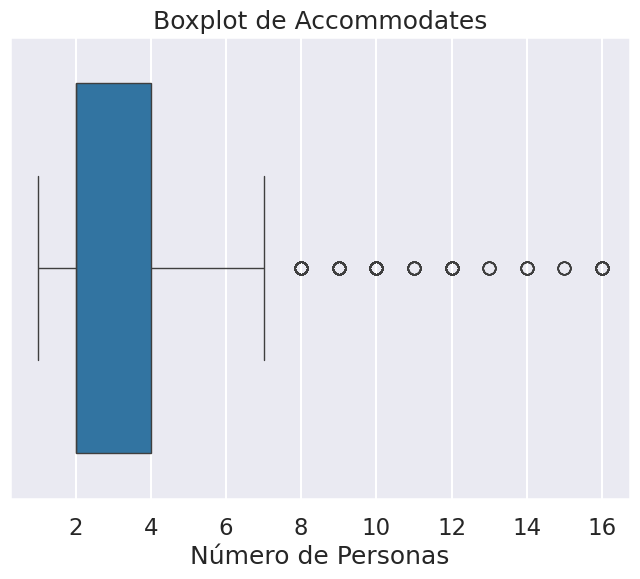

In [ ]:

plt.figure(figsize=(8, 6))
sns.boxplot(x='accommodates', data=df)
plt.title('Boxplot de Accommodates')
plt.xlabel('Número de Personas')
plt.show()


In [ ]:
accommodates_counts = df['accommodates'].value_counts()
print(accommodates_counts)

accommodates
2     9506
4     6249
1     4213
3     2666
6     2015
5     1193
8      507
7      288
10     130
9       74
12      53
16      36
11      19
14      14
13      10
15       7
Name: count, dtype: int64


In [ ]:
df = df[df['accommodates'] <= 8]


#####bathrroms

In [ ]:
nan_count_bathrooms = df['bathrooms'].isna().sum()
print(f"Cantidad de NaN en 'bathrooms': {nan_count_bathrooms}")


Cantidad de NaN en 'bathrooms': 5905


Paso los  nan de bahrooms a su media porque son 5 mil filas. Aproximandamente un 20% de los datos.  
Mas adelante al analizar otras variables y ver las filas de estos NANS la mayoria contenian NANS en muchas mas variables por lo que se termino decidiendo eliminarlas.

In [ ]:
df.fillna({'bathrooms': df['bathrooms'].mean()}, inplace=True)

<ipython-input-426-f193d0aa97bb>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
counts = df_limpio['bathrooms'].value_counts()
print(counts)

bathrooms
1.0     15015
2.0      3468
1.5      1092
3.0       504
0.5       277
2.5       226
0.0       136
4.0       127
5.0        67
3.5        50
4.5        33
8.0        16
6.0        14
7.0         5
5.5         4
10.0        2
6.5         2
12.0        1
8.5         1
Name: count, dtype: int64


In [ ]:
def remove_decimal_half(x):
  if isinstance(x, float) and x % 1 == 0.5:
    return int(x)
  return x

df['bathrooms'] = df['bathrooms'].apply(remove_decimal_half)


In [ ]:
counts = df['bathrooms'].value_counts()
print(counts)

bathrooms
1.000000     16080
1.272212      5905
2.000000      3571
3.000000       486
0.000000       411
4.000000       110
5.000000        48
8.000000        15
6.000000         7
10.000000        2
7.000000         1
12.000000        1
Name: count, dtype: int64


In [ ]:
df.shape

(26637, 33)

In [ ]:
df['bathrooms'] = df['bathrooms'].astype(int)

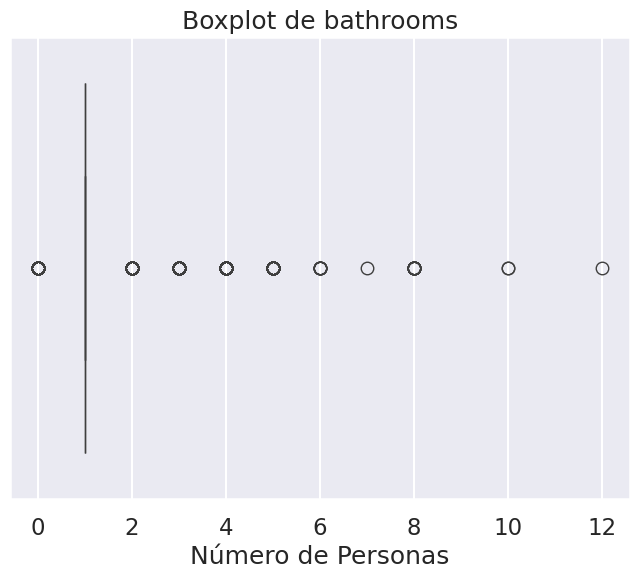

In [ ]:

plt.figure(figsize=(8, 6))
sns.boxplot(x='bathrooms', data=df)
plt.title('Boxplot de bathrooms')
plt.xlabel('Número de Personas')
plt.show()


In [ ]:
df = df[df['bathrooms'] <= 4]

#####beds



In [ ]:
nan_count_bathrooms = df['beds'].isna().sum()
print(f"Cantidad de NaN en 'beds': {nan_count_bathrooms}")

Cantidad de NaN en 'beds': 5927


In [ ]:
df.shape

(26563, 33)

In [ ]:
df.dropna(subset=['beds'], inplace=True)

In [ ]:
(df['beds'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
beds,,
1.0,9624,46.636945
2.0,5842,28.309750
3.0,2640,12.793177
4.0,1383,6.701880
0.0,443,2.146734
5.0,411,1.991665
6.0,185,0.896492
8.0,40,0.193836
7.0,29,0.140531


In [ ]:
counts = df['beds'].value_counts()
print(counts)

beds
1.0     9624
2.0     5842
3.0     2640
4.0     1383
0.0      443
5.0      411
6.0      185
8.0       40
7.0       29
12.0      16
10.0      12
9.0        4
14.0       3
30.0       1
18.0       1
11.0       1
40.0       1
Name: count, dtype: int64


In [ ]:
df = df[df['beds'] <= 6]

In [ ]:
df.shape

(20528, 33)

#####bedrooms

In [ ]:
nan_count_bathrooms = df['bedrooms'].isna().sum()
print(f"Cantidad de NaN en 'bedrooms': {nan_count_bathrooms}")

Cantidad de NaN en 'bedrooms': 28


In [ ]:
df.dropna(subset=['bedrooms'], inplace=True)

<ipython-input-442-7b870619b46d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
(df['bedrooms'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
bedrooms,,
1.0,12937,63.107317
2.0,4314,21.043902
3.0,1459,7.117073
0.0,1457,7.107317
4.0,246,1.200000
5.0,45,0.219512
6.0,20,0.097561
9.0,5,0.024390
8.0,4,0.019512


In [ ]:
df = df[df['bedrooms'] <= 4]


###Estudio general de demas variables

#####Host

######host_response_time

In [ ]:
df['host_response_time'].describe()

,host_response_time
count,19001
unique,4
top,within an hour
freq,13818


In [ ]:
df['host_response_time'].isna().sum()

1412

Para los valores NaN, vemos si ya tuvo alguna review podriamos decir que todavia no hay informacion al respecto y poner algun valor que signifique no hay info todavia. Si no tuvo alguna review, lo eliminamos

In [ ]:
df.loc[(df['host_response_time'].isna()) & (df['number_of_reviews'] != 0), 'host_response_time'] = 'No-info'
df['host_response_time'].isna().sum()

509

In [ ]:
df = df.dropna(subset=['host_response_time'], inplace=False)
df['host_response_time'].isna().sum()

0

In [ ]:
(df['host_response_time'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
host_response_time,,
within an hour,13818,69.423232
within a few hours,3018,15.162781
within a day,1284,6.450965
No-info,903,4.536777
a few days or more,881,4.426246


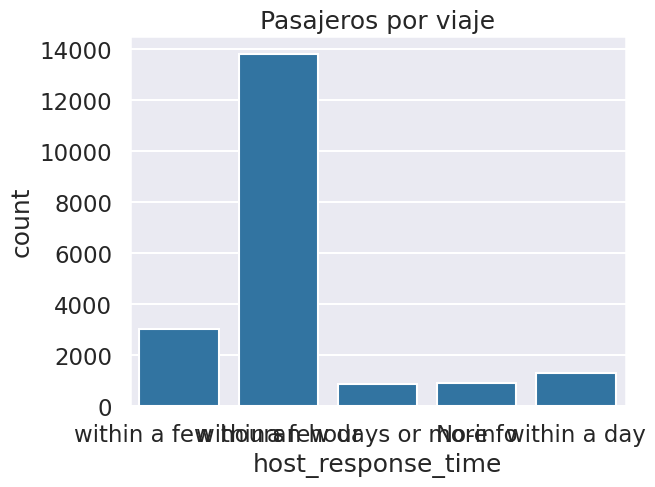

In [ ]:
df = df.reset_index(drop=True)
sns.countplot(x='host_response_time', data=df).set(title='Pasajeros por viaje')
plt.show()

######host_response_rate

In [ ]:
df['host_response_rate'].describe()

,host_response_rate
count,19001
unique,90
top,100%
freq,12941


In [ ]:
df['host_response_rate'].isna().sum()

903

In [ ]:
df['host_response_rate'] = pd.to_numeric(df['host_response_rate'].str.replace('%', ''), errors='coerce')

Para los valores NaN, si tuvieron alguna review, los ponemos en 0%. Si no tuvieron alguna review, los eliminamos

In [ ]:
df[['host_response_rate','number_of_reviews','number_of_reviews_ltm', 'number_of_reviews_l30d']][(df['host_response_rate'].isna()) & (df['number_of_reviews'] != 0)]

,host_response_rate,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d
9,NaN,1,0,0
26,NaN,3,0,0
48,NaN,26,0,0
63,NaN,1,0,0
91,NaN,71,57,4
...,...,...,...,...
19686,NaN,1,0,0
19730,NaN,15,0,0
19775,NaN,5,0,0
19819,NaN,3,3,0


In [ ]:
df.loc[(df['host_response_rate'].isna()) & (df['number_of_reviews'] != 0), 'host_response_rate'] = '-1%'
df[['host_response_rate','number_of_reviews','number_of_reviews_ltm', 'number_of_reviews_l30d']][(df['host_response_rate'].isna()) & (df['number_of_reviews'] != 0)]

<ipython-input-455-16f0686ec27f>:1: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-1%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



,host_response_rate,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d


In [ ]:
df['host_response_rate'].isna().sum()

0

In [ ]:
df['host_response_rate'].value_counts()

,count
host_response_rate,
100.0,12941
98.0,936
-1%,903
99.0,665
0.0,453
...,...
59.0,2
2.0,1
35.0,1


######host_acceptance_rate

In [ ]:
df['host_acceptance_rate'].isna().sum()

453

Aplicamos la misma logica que para host_response_rate

In [ ]:
df[['host_acceptance_rate','number_of_reviews','number_of_reviews_ltm', 'number_of_reviews_l30d']][(df['host_acceptance_rate'].isna()) & (df['number_of_reviews'] != 0)]

,host_acceptance_rate,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d
91,NaN,71,57,4
110,NaN,75,67,4
226,NaN,2,0,0
239,NaN,242,25,0
333,NaN,1,0,0
...,...,...,...,...
19532,NaN,49,0,0
19586,NaN,1,0,0
19623,NaN,1,0,0
19652,NaN,125,47,1


In [ ]:
df.loc[(df['host_acceptance_rate'].isna()) & (df['number_of_reviews'] != 0), 'host_acceptance_rate'] = '-1%'
df[['host_acceptance_rate','number_of_reviews','number_of_reviews_ltm', 'number_of_reviews_l30d']][(df['host_acceptance_rate'].isna()) & (df['number_of_reviews'] != 0)]

,host_acceptance_rate,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d


In [ ]:
df['host_acceptance_rate'].isna().sum()

87

In [ ]:
df = df.dropna(subset=['host_acceptance_rate'], inplace=False)
df['host_acceptance_rate'].isna().sum()

0

In [ ]:
df['host_acceptance_rate'].value_counts()

,count
host_acceptance_rate,
100%,7341
99%,2535
97%,1244
98%,919
0%,617
...,...
3%,6
45%,5
12%,5


In [ ]:
df['host_acceptance_rate'] = pd.to_numeric(df['host_acceptance_rate'].str.replace('%', ''), errors='coerce')

######host_is_superhost

In [ ]:
df['host_is_superhost'].isna().sum()

869

In [ ]:
df['host_is_superhost'].value_counts()

,count
host_is_superhost,
f,13382
t,5566


Para los NaN, asumimos que no hay datos sobre si son superhost, entonces los pongo en f

In [ ]:
df['host_is_superhost'] = df['host_is_superhost'].fillna('f')
df['host_is_superhost'].value_counts()

,count
host_is_superhost,
f,14251
t,5566


In [ ]:
px.pie(df, names='host_is_superhost')

#####Caracteristicas lugar

In [ ]:
df[['room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds']].isna().sum()

,0
room_type,0
accommodates,0
bathrooms,0
bedrooms,0
beds,0


######property_type

In [ ]:
(df_original['property_type'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
property_type,,
Entire rental unit,15414,57.131208
Private room in rental unit,6724,24.922165
Private room in home,842,3.120830
Entire condo,650,2.409192
Entire loft,564,2.090437
...,...,...
Private room in pension,1,0.003706
Yurt,1,0.003706
Entire bungalow,1,0.003706


In [ ]:
df.shape

(19817, 33)

In [ ]:
unique_property_types = df_original['property_type'].unique()
print(unique_property_types)


['Entire rental unit' 'Private room in rental unit' 'Private room in home'
 'Private room in chalet' 'Entire loft' 'Shared room in condo'
 'Entire home' 'Private room in condo' 'Room in boutique hotel'
 'Private room in guesthouse' 'Room in hotel' 'Entire condo'
 'Private room in hostel' 'Private room in bed and breakfast'
 'Private room in casa particular' 'Entire guest suite'
 'Private room in townhouse' 'Shared room in rental unit'
 'Room in aparthotel' 'Private room in serviced apartment'
 'Shared room in home' 'Entire guesthouse' 'Private room'
 'Private room in guest suite' 'Entire serviced apartment'
 'Shared room in bed and breakfast' 'Camper/RV' 'Casa particular'
 'Room in hostel' 'Entire townhouse' 'Private room in tent'
 'Shared room in hostel' 'Entire place' 'Tiny home'
 'Room in casa particular' 'Entire vacation home' 'Private room in loft'
 'Private room in tiny home' 'Private room in villa'
 'Private room in dome' 'Shared room in chalet' 'Shared room in loft'
 'Shared ro

In [ ]:
df.head(10)

,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,concatenated_categorical
0,https://www.airbnb.com/rooms/922279485725006244,2019-09-03,within a few hours,100.0,97,t,"['email', 'phone']",t,t,Centro,40.424930,-3.702830,Entire rental unit,Entire home/apt,4,1,2.0,2.0,150.0,14,11,2,2023-08-12,2024-09-08,4.64,4.71,4.36,4.64,4.79,4.93,4.64,t,https://www.airbnb.com/rooms/92227948572500624...
1,https://www.airbnb.com/rooms/887120231398812211,2017-02-14,within an hour,100.0,99,f,"['email', 'phone']",t,t,Centro,40.421582,-3.702643,Entire loft,Entire home/apt,4,1,0.0,1.0,137.0,31,31,1,2023-09-25,2024-08-25,4.58,4.61,4.55,4.65,4.68,4.81,4.35,f,https://www.airbnb.com/rooms/88712023139881221...
2,https://www.airbnb.com/rooms/707073912721841330,2020-11-30,within an hour,98.0,99,f,"['email', 'phone', 'work_email']",t,t,Centro,40.423830,-3.698840,Entire rental unit,Entire home/apt,6,2,2.0,3.0,244.0,67,33,2,2022-09-17,2024-09-04,4.78,4.75,4.73,4.51,4.66,4.94,4.67,t,https://www.airbnb.com/rooms/70707391272184133...
3,https://www.airbnb.com/rooms/19011445,2017-05-30,within an hour,100.0,100,t,"['email', 'phone', 'work_email']",t,t,Moncloa - Aravaca,40.424940,-3.713190,Entire rental unit,Entire home/apt,4,1,1.0,2.0,144.0,387,77,3,2017-06-06,2024-09-06,4.96,4.95,4.96,4.97,4.99,4.96,4.93,f,https://www.airbnb.com/rooms/19011445 2017-05-...
4,https://www.airbnb.com/rooms/782402536605430808,2020-01-07,within an hour,98.0,99,f,"['email', 'phone']",t,t,Puente de Vallecas,40.382721,-3.672909,Entire rental unit,Entire home/apt,4,1,1.0,1.0,69.0,11,10,0,2023-06-09,2024-07-10,3.73,4.00,3.64,4.09,4.09,4.45,3.55,t,https://www.airbnb.com/rooms/78240253660543080...
5,https://www.airbnb.com/rooms/1177153799736546245,2022-03-10,a few days or more,32.0,32,f,"['email', 'phone']",t,t,Arganzuela,40.402999,-3.691649,Private room in rental unit,Private room,1,1,1.0,1.0,20.0,1,1,0,2024-06-30,2024-06-30,4.00,4.00,4.00,3.00,4.00,5.00,4.00,f,https://www.airbnb.com/rooms/11771537997365462...
6,https://www.airbnb.com/rooms/791946049512096821,2013-03-19,within an hour,100.0,99,f,"['email', 'phone']",t,f,Carabanchel,40.393798,-3.708586,Private room in rental unit,Private room,1,1,1.0,1.0,32.0,27,11,0,2023-01-24,2024-06-24,4.52,4.48,4.41,4.74,4.81,4.63,4.41,f,https://www.airbnb.com/rooms/79194604951209682...
7,https://www.airbnb.com/rooms/700506328928861604,2021-12-01,within a few hours,100.0,99,f,"['email', 'phone', 'work_email']",t,f,Centro,40.424555,-3.699194,Entire rental unit,Entire home/apt,2,1,1.0,1.0,125.0,1,1,0,2024-03-26,2024-03-26,3.00,3.00,4.00,5.00,5.00,5.00,4.00,t,https://www.airbnb.com/rooms/70050632892886160...
8,https://www.airbnb.com/rooms/934873350239287909,2023-07-13,a few days or more,10.0,0,f,"['email', 'phone']",t,t,Latina,40.411320,-3.733370,Private room in rental unit,Private room,1,0,1.0,1.0,27.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/93487335023928790...
9,https://www.airbnb.com/rooms/48991692,2019-01-13,No-info,-1%,100,t,"['email', 'phone']",t,t,Ciudad Lineal,40.430800,-3.659340,Private room in rental unit,Private room,1,1,1.0,1.0,40.0,1,0,0,2021-04-04,2021-04-04,5.00,5.00,5.00,5.00,5.00,5.00,5.00,f,https://www.airbnb.com/rooms/48991692 2019-01-...


In [ ]:
# One-hot encoding para variables categóricas
df_property = pd.get_dummies(df, columns=['property_type'], drop_first=True)


In [ ]:
# junto los tipos entire_condo y enire_loft con enire rental unit
df.loc[df['property_type'].isin(['Entire condo', 'Entire loft']), 'property_type'] = 'Entire rental unit'

######Creacion de variable: property_category
para los tipos de property_type ya que son muchos, los agrupo en menos categorias

In [ ]:
def categorize_property_type(property_type):
  if property_type in ['Entire rental unit', 'Entire serviced apartment', 'Entire condominium', 'Entire guest suite', 'Entire townhouse', 'Entire villa']:
    return 'Entire Property'
  elif property_type in ['Private room in rental unit', 'Private room in house', 'Private room in townhouse', 'Private room in condominium', 'Private room in bungalow']:
    return 'Private Room'
  elif property_type in ['Room in hotel', 'Room in boutique hotel', 'Room in bed and breakfast']:
    return 'Hotel/B&B Room'
  elif property_type in ['Tiny house', 'Cabin', 'Cottage', 'Guesthouse', 'Earth house', 'Farm stay', 'Casa particular']:
    return 'Unique Stay'
  elif property_type in ['Aparthotel', 'Loft', 'Serviced apartment', 'Boat', 'Apartament', 'Bed and breakfast', 'Guest suite']:
    return 'Other'
  else:
    return 'Other' #Para los tipos de propiedad menos frecuentes

df['property_category'] = df['property_type'].apply(categorize_property_type)

# Verificar los nuevos valores
print(df['property_category'].value_counts())

property_category
Entire Property    13686
Private Room        4199
Other               1787
Hotel/B&B Room       131
Unique Stay           14
Name: count, dtype: int64


In [ ]:
unique_property_types = df['property_category'].unique()
print(unique_property_types)


['Entire Property' 'Private Room' 'Other' 'Hotel/B&B Room' 'Unique Stay']


In [ ]:
(df['property_type'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
property_type,,
Entire rental unit,13402,67.628804
Private room in rental unit,4172,21.052632
Private room in home,504,2.543271
Entire serviced apartment,252,1.271635
Private room in condo,207,1.044558
Entire home,198,0.999142
Private room in casa particular,162,0.817480
Private room in hostel,133,0.671141
Room in hotel,104,0.524802


Paso la variable property type a numerica

In [ ]:
# One-hot encoding para variables categóricas
df_property = pd.get_dummies(df, columns=['property_type'], drop_first=True)


######room_type

In [ ]:
df['room_type'].value_counts()

,count
room_type,
Entire home/apt,13996
Private room,5583
Shared room,189
Hotel room,49


In [ ]:
px.pie(df, names='room_type')

######accommodates

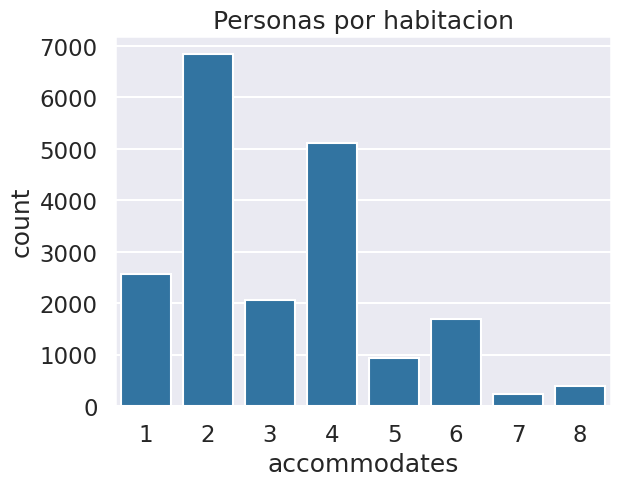

,count
accommodates,
2,6838
4,5119
1,2571
3,2052
6,1694
5,932
8,384
7,227


In [ ]:
sns.countplot(x='accommodates', data=df).set(title='Personas por habitacion')
plt.show()
df['accommodates'].value_counts()

In [ ]:
#elimina los accomodates de 11 para arriba
df = df[df['accommodates'] <= 10]

In [ ]:
df[['accommodates', 'room_type']].value_counts()

accommodates  room_type      
4             Entire home/apt    4944
2             Entire home/apt    3985
              Private room       2801
1             Private room       2296
3             Entire home/apt    1767
6             Entire home/apt    1668
5             Entire home/apt     907
8             Entire home/apt     379
3             Private room        267
7             Entire home/apt     226
4             Private room        170
1             Shared room         142
              Entire home/apt     120
2             Shared room          28
5             Private room         25
2             Hotel room           24
6             Private room         19
1             Hotel room           13
3             Hotel room           11
6             Shared room           7
3             Shared room           7
4             Shared room           4
8             Private room          4
4             Hotel room            1
7             Private room          1
8             Shared room           1
Name: count, dtype: int64

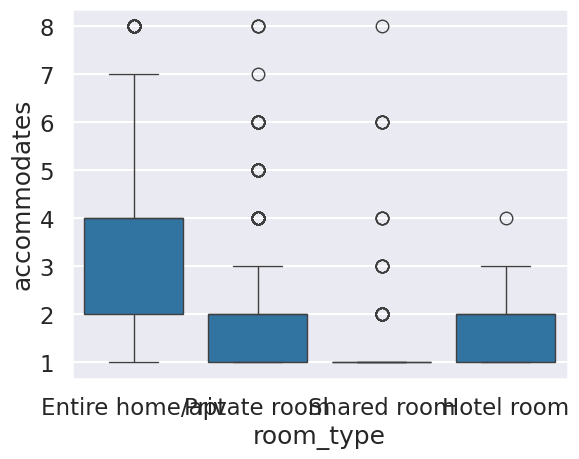

In [ ]:
sns.boxplot(x='room_type', y='accommodates', data=df)
plt.show()

In [ ]:
max_personas_private_room = 3
df[['accommodates', 'room_type']][(df['accommodates'] > max_personas_private_room) & (df['room_type'] == 'Private room')]

,accommodates,room_type
122,5,Private room
180,6,Private room
216,5,Private room
513,5,Private room
519,4,Private room
...,...,...
19817,6,Private room
19829,4,Private room
19865,4,Private room
19868,6,Private room


In [ ]:
max_personas_hotel_room = 3
df[['accommodates', 'room_type']][(df['accommodates'] > max_personas_hotel_room) & (df['room_type'] == 'Hotel room')]

,accommodates,room_type
5613,4,Hotel room


In [ ]:
max_personas_shared_room = 3
df[['accommodates', 'room_type']][(df['accommodates'] > max_personas_shared_room) & (df['room_type'] == 'Shared room')]

,accommodates,room_type
738,6,Shared room
762,6,Shared room
1069,8,Shared room
1653,4,Shared room
3098,6,Shared room
4600,6,Shared room
4636,6,Shared room
6187,6,Shared room
6195,4,Shared room
6411,4,Shared room


In [ ]:
max_personas_entire_home_apt = 8
df[['accommodates', 'room_type']][(df['accommodates'] > max_personas_shared_room) & (df['room_type'] == 'Entire room/apt')]

,accommodates,room_type


Para los valores atipicos en accommodates con respecto al room_type, a cada valor atipico los eliminaremos



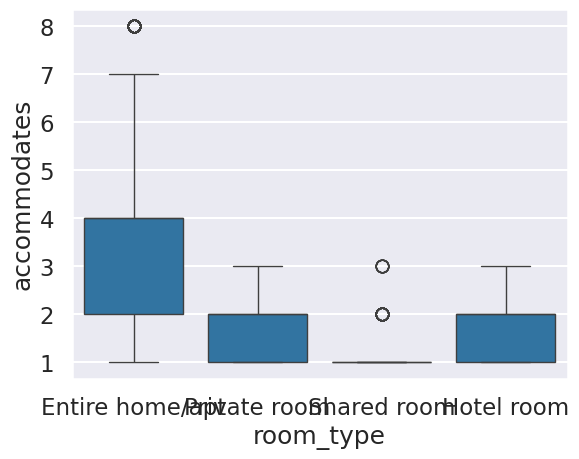

,count
accommodates,
2,6838
4,4944
1,2571
3,2052
6,1668
5,907
8,379
7,226


In [ ]:
df = df.drop(df[(df['room_type'] == 'Hotel room') & (df['accommodates'] > max_personas_hotel_room)].index)
df = df.drop(df[(df['room_type'] == 'Shared room') & (df['accommodates'] > max_personas_shared_room)].index)
df = df.drop(df[(df['room_type'] == 'Private room') & (df['accommodates'] > max_personas_private_room)].index)
df = df.drop(df[(df['room_type'] == 'Entire home/apt') & (df['accommodates'] > max_personas_entire_home_apt)].index)
sns.boxplot(x='room_type', y='accommodates', data=df)
plt.show()
df['accommodates'].value_counts()


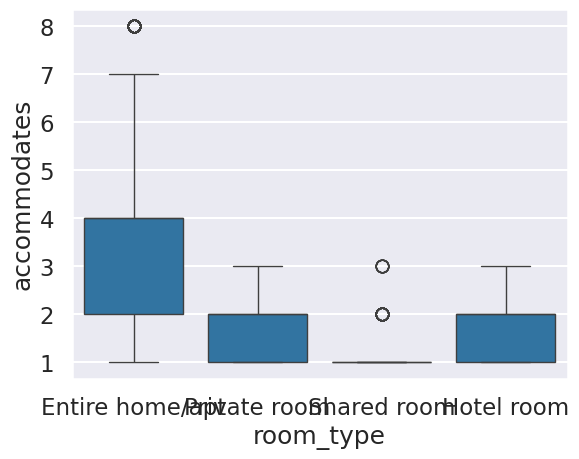

,count
accommodates,
2,6838
4,4944
1,2571
3,2052
6,1668
5,907
8,379
7,226


In [ ]:
df = df.drop(df[(df['room_type'] == 'Hotel room') & (df['accommodates'] > max_personas_hotel_room)].index)
df = df.drop(df[(df['room_type'] == 'Shared room') & (df['accommodates'] > max_personas_shared_room)].index)
df = df.drop(df[(df['room_type'] == 'Private room') & (df['accommodates'] > max_personas_private_room)].index)
df = df.drop(df[(df['room_type'] == 'Entire home/apt') & (df['accommodates'] > max_personas_entire_home_apt)].index)
sns.boxplot(x='room_type', y='accommodates', data=df)
plt.show()
df['accommodates'].value_counts()

In [ ]:
df['bathrooms'].value_counts()

,count
bathrooms,
1,15366
2,3332
3,437
0,365
4,85


In [ ]:
df['bathrooms'].isna().sum()

0

A los que tengan baños en NaN, los elimino.
A los que tengan baños con decimales, los redondeo para abajo

In [ ]:
df.dropna(subset=['bathrooms'], inplace=True)

In [ ]:
df['bathrooms'] = df['bathrooms'].apply(lambda x: int(x))
df['bathrooms'].value_counts()

,count
bathrooms,
1,15366
2,3332
3,437
0,365
4,85


In [ ]:
df = df[df['bathrooms'] >= 0]
df = df[df['bathrooms'] <= 5]

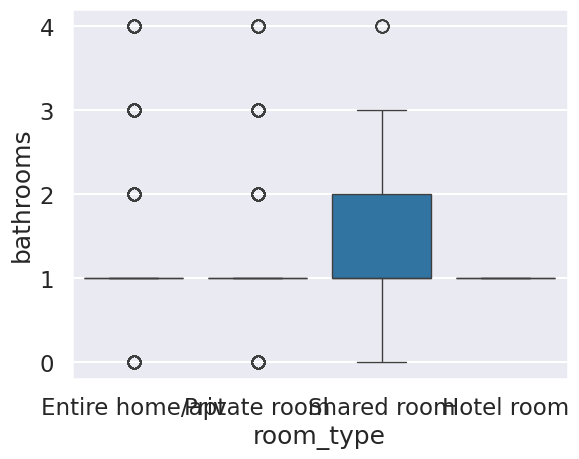

,count
bathrooms,
1,15366
2,3332
3,437
0,365
4,85


In [ ]:
sns.boxplot(x='room_type', y='bathrooms', data=df)
plt.show()
df['bathrooms'].value_counts()

In [ ]:
max_bathrooms_private_room = 1
df[['bathrooms', 'room_type']][(df['bathrooms'] > max_bathrooms_private_room) & (df['room_type'] == 'Private room')]

,bathrooms,room_type
10,3,Private room
16,2,Private room
82,2,Private room
90,3,Private room
93,2,Private room
...,...,...
19881,2,Private room
19882,2,Private room
19886,2,Private room
19889,2,Private room


In [ ]:
max_bathrooms_shared_room = 3
df[['bathrooms', 'room_type']][(df['bathrooms'] > max_bathrooms_shared_room) & (df['room_type'] == 'Shared room')]

,bathrooms,room_type
14701,4,Shared room
14717,4,Shared room
16167,4,Shared room
16168,4,Shared room
16222,4,Shared room
17365,4,Shared room
17390,4,Shared room
17559,4,Shared room
18667,4,Shared room


In [ ]:
max_bathrooms_hotel_room = 1
df[['bathrooms', 'room_type']][df['room_type'] == 'Hotel room'].value_counts()

,,count
bathrooms,room_type,
1,Hotel room,48


In [ ]:
max_bathrooms_entire_home_apt = 1
df[['bathrooms', 'room_type']][df['room_type'] == 'Entire home/apt'].value_counts()

,,count
bathrooms,room_type,
1,Entire home/apt,10862
2,Entire home/apt,2711
3,Entire home/apt,293
0,Entire home/apt,81
4,Entire home/apt,49


######bedrooms

In [ ]:
df['bedrooms'].value_counts()

,count
bedrooms,
1.0,12338
2.0,4171
0.0,1422
3.0,1411
4.0,243


In [ ]:
df['bedrooms'].isna().sum()

0

A los que tengan NaN habitaciones, los pongo en cero

In [ ]:
df = df.dropna(subset=['bedrooms'], inplace=False)
df['bedrooms'].value_counts()

,count
bedrooms,
1.0,12338
2.0,4171
0.0,1422
3.0,1411
4.0,243


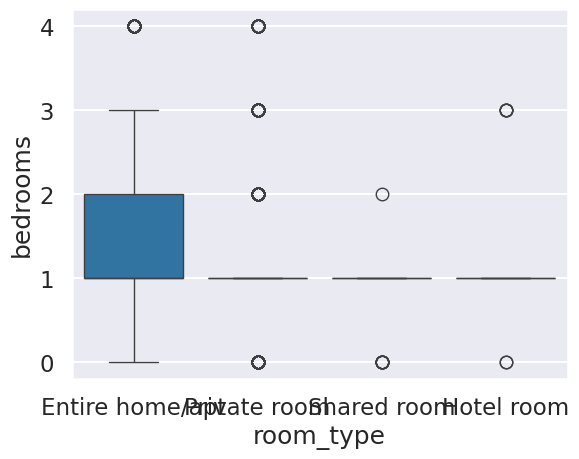

,count
bedrooms,
1.0,12338
2.0,4171
0.0,1422
3.0,1411
4.0,243


In [ ]:
sns.boxplot(x='room_type', y='bedrooms', data=df)
plt.show()
df['bedrooms'].value_counts()

In [ ]:
max_bedrooms_private_room = 1
df[['bedrooms', 'room_type']][(df['bedrooms'] > max_bedrooms_private_room) & (df['room_type'] == 'Private room')]

,bedrooms,room_type
37,3.0,Private room
108,2.0,Private room
121,4.0,Private room
215,2.0,Private room
219,2.0,Private room
...,...,...
19816,2.0,Private room
19855,2.0,Private room
19858,2.0,Private room
19886,2.0,Private room


In [ ]:
max_bedrooms_shared_room = 1
df[['bedrooms', 'room_type']][(df['bedrooms'] > max_bedrooms_shared_room) & (df['room_type'] == 'Shared room')]


,bedrooms,room_type
383,2.0,Shared room


In [ ]:
max_bedrooms_hotel_room = 1
df[['bedrooms', 'room_type']][df['room_type'] == 'Hotel room'].value_counts()

,,count
bedrooms,room_type,
1.0,Hotel room,42
3.0,Hotel room,4
0.0,Hotel room,2


In [ ]:
max_bedrooms_entire_home_apt = 2
df[['bedrooms', 'room_type']][df['room_type'] == 'Entire home/apt'].value_counts()

,,count
bedrooms,room_type,
1.0,Entire home/apt,7109
2.0,Entire home/apt,4002
3.0,Entire home/apt,1353
0.0,Entire home/apt,1324
4.0,Entire home/apt,208


######beds

In [ ]:
df['beds'].value_counts()

,count
beds,
1.0,9156
2.0,5600
3.0,2535
4.0,1322
0.0,426
5.0,386
6.0,160


In [ ]:
df['beds'].isna().sum()

0

In [ ]:
df = df.dropna(subset=['beds'], inplace=False)
df['beds'].value_counts()

,count
beds,
1.0,9156
2.0,5600
3.0,2535
4.0,1322
0.0,426
5.0,386
6.0,160


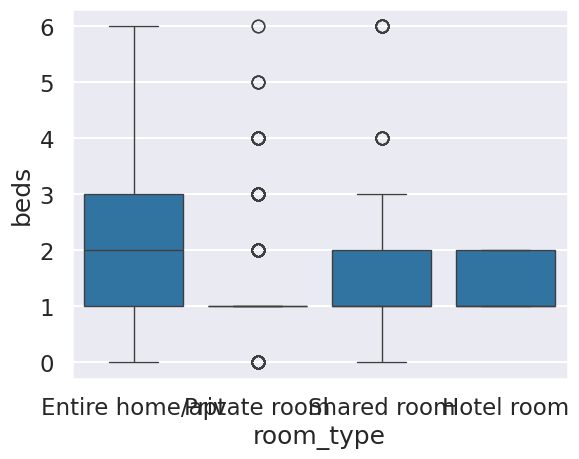

,count
beds,
1.0,9156
2.0,5600
3.0,2535
4.0,1322
0.0,426
5.0,386
6.0,160


In [ ]:
sns.boxplot(x='room_type', y='beds', data=df)
plt.show()
df['beds'].value_counts()

In [ ]:
max_beds_private_room = 7
df[['beds', 'room_type']][(df['beds'] > max_beds_private_room) & (df['room_type'] == 'Private room')]

,beds,room_type


In [ ]:
max_beds_shared_room = 15
df[['beds', 'room_type']][(df['beds'] > max_beds_shared_room) & (df['room_type'] == 'Shared room')]

,beds,room_type


In [ ]:
max_beds_hotel_room = 1
df[['beds', 'room_type']][df['room_type'] == 'Hotel room'].value_counts()

,,count
beds,room_type,
1.0,Hotel room,35
2.0,Hotel room,13


In [ ]:
max_beds_entire_home_apt = 3
df[['beds', 'room_type']][df['room_type'] == 'Entire home/apt'].value_counts()

,,count
beds,room_type,
2.0,Entire home/apt,4990
1.0,Entire home/apt,4501
3.0,Entire home/apt,2450
4.0,Entire home/apt,1269
5.0,Entire home/apt,381
0.0,Entire home/apt,267
6.0,Entire home/apt,138


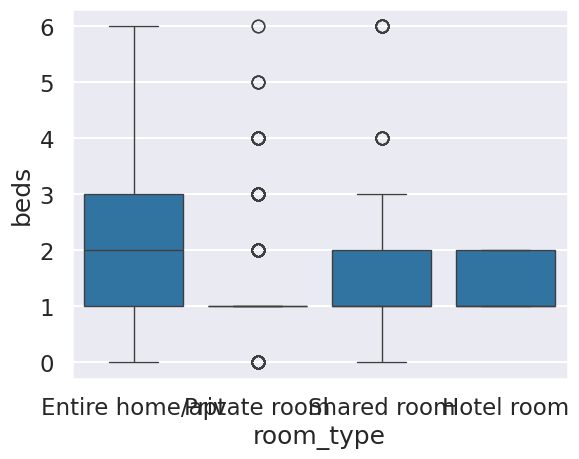

,count
beds,
1.0,9156
2.0,5600
3.0,2535
4.0,1322
0.0,426
5.0,386
6.0,160


In [ ]:
df = df.drop(df[(df['room_type'] == 'Shared room') & (df['beds'] > max_beds_shared_room)].index)
df = df.drop(df[(df['room_type'] == 'Private room') & (df['beds'] > max_beds_private_room)].index)
sns.boxplot(x='room_type', y='beds', data=df)
plt.show()
df['beds'].value_counts()

#####Reviews

######Number of reviews

In [ ]:
df[['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d']].isna().sum()

,0
number_of_reviews,0
number_of_reviews_ltm,0
number_of_reviews_l30d,0


In [ ]:
df['number_of_reviews'].value_counts()

,count
number_of_reviews,
0,2794
1,1391
2,858
3,637
4,551
...,...
476,1
332,1
528,1


In [ ]:
df['number_of_reviews'][df['number_of_reviews'] < 0]

,number_of_reviews


In [ ]:
df['number_of_reviews_ltm'].value_counts()

,count
number_of_reviews_ltm,
0,3985
1,1548
2,1034
3,726
4,693
...,...
183,1
149,1
299,1


In [ ]:
df['number_of_reviews_ltm'][df['number_of_reviews_ltm'] < 0]

,number_of_reviews_ltm


In [ ]:
df['number_of_reviews_l30d'].value_counts()

,count
number_of_reviews_l30d,
0,11638
1,3143
2,1725
3,1191
4,741
5,477
6,277
7,144
8,91


######First and last review

In [ ]:
df['first_review'].isna().sum(), df['last_review'].isna().sum()

(2794, 2794)

In [ ]:
df[(df['first_review'].isna()) & (df['last_review'].isna())]

,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,concatenated_categorical,property_category
8,https://www.airbnb.com/rooms/934873350239287909,2023-07-13,a few days or more,10.0,0,f,"['email', 'phone']",t,t,Latina,40.411320,-3.733370,Private room in rental unit,Private room,1,0,1.0,1.0,27.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/93487335023928790...,Private Room
13,https://www.airbnb.com/rooms/1219384007797193791,2020-05-15,within an hour,98.0,97,f,"['phone', 'work_email']",t,t,Centro,40.424279,-3.695911,Entire rental unit,Entire home/apt,3,1,1.0,2.0,149.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/12193840077971937...,Entire Property
18,https://www.airbnb.com/rooms/1203417102014508381,2016-12-13,within an hour,100.0,100,f,"['email', 'phone']",t,t,Chamartín,40.451875,-3.689303,Entire rental unit,Entire home/apt,5,2,3.0,3.0,159.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,https://www.airbnb.com/rooms/12034171020145083...,Entire Property
24,https://www.airbnb.com/rooms/1217139530047241233,2013-06-27,within an hour,100.0,100,t,"['phone', 'work_email']",t,t,San Blas - Canillejas,40.449270,-3.575132,Entire rental unit,Entire home/apt,4,1,1.0,1.0,75.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,https://www.airbnb.com/rooms/12171395300472412...,Entire Property
33,https://www.airbnb.com/rooms/42576484,2014-10-13,within an hour,100.0,100,t,"['email', 'phone']",t,t,Centro,40.411248,-3.698940,Entire rental unit,Entire home/apt,6,1,4.0,4.0,90.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,https://www.airbnb.com/rooms/42576484 2014-10-...,Entire Property
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19892,https://www.airbnb.com/rooms/988903564375531067,2023-09-26,a few days or more,3.0,3,f,['phone'],t,t,Usera,40.379793,-3.714082,Private room in rental unit,Private room,2,1,1.0,1.0,21.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/98890356437553106...,Private Room
19894,https://www.airbnb.com/rooms/1226100621073955168,2016-07-22,within an hour,100.0,86,f,"['email', 'phone']",t,t,Puente de Vallecas,40.398907,-3.661680,Private room in rental unit,Private room,2,0,1.0,1.0,29.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/12261006210739551...,Private Room
19898,https://www.airbnb.com/rooms/34808705,2019-05-17,a few days or more,0.0,0,f,"['email', 'phone']",t,t,Villaverde,40.352950,-3.698530,Private room in rental unit,Private room,2,1,1.0,1.0,93.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/34808705 2019-05-...,Private Room
19900,https://www.airbnb.com/rooms/32600865,2016-10-02,a few days or more,0.0,0,f,['phone'],t,t,Villaverde,40.353200,-3.688060,Private room in condo,Private room,2,1,2.0,2.0,64.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,https://www.airbnb.com/rooms/32600865 2016-10-...,Other


Vemos que cuando para first_review es NaN, para last_review tambien. Podriamos eliminarlos o podemos inferir que todavia no tuvieron reviews, por lo que podriamos asignarles un valor de No-data

In [ ]:
df['first_review'] = df['first_review'].fillna('No-data')
df['last_review'] = df['last_review'].fillna('No-data')
df[(df['first_review'].isna()) & (df['last_review'].isna())]

,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,concatenated_categorical,property_category


In [ ]:
df['first_review'].value_counts()

,count
first_review,
No-data,2794
2024-07-14,77
2024-06-16,69
2023-12-10,57
2024-06-02,56
...,...
2013-03-25,1
2020-09-26,1
2012-10-29,1


In [ ]:
df['last_review'].value_counts()

,count
last_review,
No-data,2794
2024-09-08,745
2024-09-09,526
2024-07-14,436
2024-08-27,390
...,...
2023-02-18,1
2020-05-01,1
2017-09-02,1


In [ ]:
df[(df['first_review'] > df['last_review'])]

,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,concatenated_categorical,property_category


######review scores

In [ ]:
df['review_scores_rating'].isna().sum(), df['review_scores_accuracy'].isna().sum(), df['review_scores_cleanliness'].isna().sum(), df['review_scores_checkin'].isna().sum(), df['review_scores_communication'].isna().sum(), df['review_scores_location'].isna().sum(), df['review_scores_value'].isna().sum()

(2794, 2794, 2795, 2795, 2794, 2794, 2794)

In [ ]:
px.box(df, x=['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value'], title='Distribución de review_scores')

In [ ]:
df[['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']].describe()

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,16791.000000,16791.000000,16790.000000,16790.000000,16791.000000,16791.000000,16791.000000
mean,4.655025,4.704646,4.689451,4.748144,4.757330,4.748734,4.562559
std,0.459063,0.426523,0.434465,0.416458,0.438064,0.370277,0.485434
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,4.560000,4.640000,4.600000,4.700000,4.730000,4.670000,4.460000
50%,4.760000,4.810000,4.800000,4.860000,4.880000,4.860000,4.670000
75%,4.915000,4.940000,4.940000,4.960000,4.990000,4.970000,4.830000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


Si todos los NaN que hay los cambiamos a cero, la distribucion en el grafico se distorsionaria demasiado, por lo que decidimos eliminar todas las filas que tengan NaN en cualquiera de las columnas del tipo review_scores_

In [ ]:
df = df.dropna(subset=['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value'], inplace=False)
df['review_scores_rating'].isna().sum(), df['review_scores_accuracy'].isna().sum(), df['review_scores_cleanliness'].isna().sum(), df['review_scores_checkin'].isna().sum(), df['review_scores_communication'].isna().sum(), df['review_scores_location'].isna().sum(), df['review_scores_value'].isna().sum()

(0, 0, 0, 0, 0, 0, 0)

#####instant_bookable


Descripción: [t=true; f=false]. Whether the guest can automatically book the listing without the host requiring to accept their booking request. An indicator of a commercial listing.

####neighbourhood_group_cleansed  

In [ ]:
unique_neighbourhood_group_cleansed = df['neighbourhood_group_cleansed'].unique()
print(unique_neighbourhood_group_cleansed)

['Centro' 'Moncloa - Aravaca' 'Puente de Vallecas' 'Arganzuela'
 'Carabanchel' 'Ciudad Lineal' 'Chamberí' 'Latina' 'Chamartín'
 'Villaverde' 'Retiro' 'Usera' 'Salamanca' 'Tetuán'
 'Fuencarral - El Pardo' 'Vicálvaro' 'San Blas - Canillejas' 'Barajas'
 'Hortaleza' 'Villa de Vallecas' 'Moratalaz']


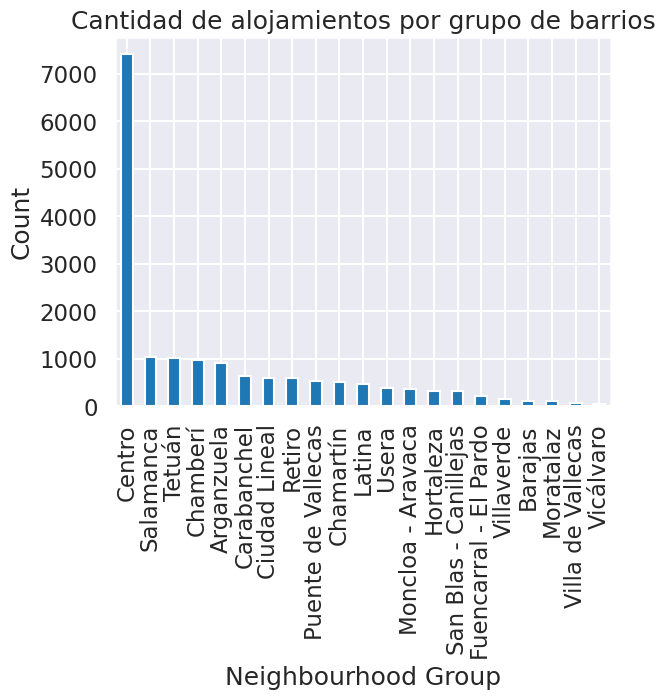

In [ ]:
import matplotlib.pyplot as plt
df['neighbourhood_group_cleansed'].value_counts().plot(kind='bar')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Count')
plt.title('Cantidad de alojamientos por grupo de barrios')
plt.show()


In [ ]:
(df['neighbourhood_group_cleansed'].value_counts(normalize=False)
 .to_frame('Count')
 .assign(Percentage=lambda x: 100 * x['Count'] / x['Count'].sum())
)

,Count,Percentage
neighbourhood_group_cleansed,,
Centro,7404,44.100304
Salamanca,1040,6.194532
Tetuán,1011,6.021800
Chamberí,984,5.860980
Arganzuela,909,5.414259
Carabanchel,637,3.794151
Ciudad Lineal,594,3.538031
Retiro,593,3.532075
Puente de Vallecas,526,3.133004


In [ ]:
# Crear un diccionario para mapear los barrios a sus valores numéricos
neighbourhood_map = {
    'Centro': 44.100304,
    'Salamanca': 6.194532,
    'Tetuán': 6.021800,
    'Chamberí': 5.860980,
    'Arganzuela': 5.414259,
    'Carabanchel': 3.794151,
    'Ciudad Lineal': 3.538031,
    'Retiro': 3.532075,
    'Puente de Vallecas': 3.133004,
    'Chamartín': 3.001966,
    'Latina': 2.757758,
    'Usera': 2.322950,
    'Moncloa - Aravaca': 2.162130,
    'Hortaleza': 1.947704,
    'San Blas - Canillejas': 1.911966,
    'Fuencarral - El Pardo': 1.322294,
    'Villaverde': 0.869617,
    'Barajas': 0.708797,
    'Moratalaz': 0.655191,
    'Villa de Vallecas': 0.470546,
    'Vicálvaro': 0.279945
}

# Aplicar el mapeo a la columna 'neighbourhood_group_cleansed'
df['neighbourhood_group'] = df['neighbourhood_group_cleansed'].map(neighbourhood_map)

# Verificar los cambios
df[['neighbourhood_group_cleansed', 'neighbourhood_group']].head()


,neighbourhood_group_cleansed,neighbourhood_group
0,Centro,44.100304
1,Centro,44.100304
2,Centro,44.100304
3,Moncloa - Aravaca,2.162130
4,Puente de Vallecas,3.133004


####Estudio exhaustivo de variable Price
Variable más importante al ser la variable a predecir.

Limpio price

In [ ]:
df_filter_price = df[df['price'].between(0, 300)]
px.box(df_filter_price, x='price', title='Distribución de precio')

In [ ]:
fig = px.histogram(df, x='price', nbins=100, title='Distribución de los precios')
fig.show()

In [ ]:
df.shape

(16789, 35)

In [ ]:
# Eliminar filas fuera del rango y actualizar el DataFrame original
df_1 = df[(df['price'] >= 1000) & (df['price'] <= 35000)]

In [ ]:
df_1.shape

(32, 35)

In [ ]:
# Eliminar filas fuera del rango y actualizar el DataFrame original
df_2 = df[(df['price'] >= -1000) & (df['price'] <= 1000)]

In [ ]:
df_2.shape

(16763, 35)

In [ ]:
df_out_of_range = df[(df['price'] < 2) | (df['price'] > 1000)]
print(df_out_of_range.shape)


(27, 35)


####estudio de property_type 2

In [ ]:
# Frecuencia de cada tipo de propiedad
df['property_type'].value_counts()


,count
property_type,
Entire rental unit,11575
Private room in rental unit,3370
Private room in home,409
Entire serviced apartment,230
Private room in condo,185
Entire home,177
Private room in casa particular,145
Private room in hostel,94
Room in hotel,73


In [ ]:
#crea un mapeo de property_type para cada uno de sus unique
unique_property_types = df['property_type'].unique()
property_type_mapping = {property_type: i for i, property_type in enumerate(unique_property_types)}


In [ ]:
print(df['property_type'].value_counts()[:15])


property_type
Entire rental unit                   11575
Private room in rental unit           3370
Private room in home                   409
Entire serviced apartment              230
Private room in condo                  185
Entire home                            177
Private room in casa particular        145
Private room in hostel                  94
Room in hotel                           73
Private room in bed and breakfast       69
Shared room in hostel                   49
Shared room in rental unit              42
Room in hostel                          32
Room in boutique hotel                  26
Private room                            25
Name: count, dtype: int64


In [ ]:
def categorize_property_type(property_type):
  """Categoriza los tipos de propiedad en grupos más generales."""

  if property_type in ['Entire rental unit', 'Entire serviced apartment', 'Entire condominium', 'Entire guest suite', 'Entire townhouse', 'Entire villa']:
    return 'Entire Property'
  elif property_type in ['Private room in rental unit', 'Private room in house', 'Private room in townhouse', 'Private room in condominium', 'Private room in bungalow']:
    return 'Private Room'
  elif property_type in ['Room in hotel', 'Room in boutique hotel', 'Room in bed and breakfast']:
    return 'Hotel/B&B Room'
  elif property_type in ['Tiny house', 'Cabin', 'Cottage', 'Guesthouse', 'Earth house', 'Farm stay', 'Casa particular']:
    return 'Unique Stay'
  elif property_type in ['Aparthotel', 'Loft', 'Serviced apartment', 'Boat', 'Apartament', 'Bed and breakfast', 'Guest suite']:
    return 'Other'
  else:
    return 'Other'  # Para los tipos de propiedad menos frecuentes

# creo una nueva columna 'property_category'
df['property_category'] = df['property_type'].apply(categorize_property_type)

# Verificar los nuevos valores
print(df['property_category'].value_counts())


property_category
Entire Property    11836
Private Room        3394
Other               1446
Hotel/B&B Room       100
Unique Stay           13
Name: count, dtype: int64


In [ ]:
# crea un diccionariio para mappearlo
property_category_map = {
    'Entire Property': 1,
    'Private Room': 2,
    'Hotel/B&B Room': 3,
    'Unique Stay': 4,
    'Other': 5
}

# Aplicar el mapeo a la columna 'property_category'
df['property_category_mapped'] = df['property_category'].map(property_category_map)


####Limpieza de datos

In [ ]:
df.shape

(16789, 36)

In [ ]:
# Eliminar filas fuera del rango y actualizar el DataFrame original
df = df[(df['price'] >= 2) & (df['price'] <= 700)]

In [ ]:
df.shape

(16727, 36)

Corto price. Probé con varios números y este es el que mejor quedaba en el cuadro de correlación.

In [ ]:
# Eliminar filas fuera del rango y actualizar el DataFrame original
df = df[(df['price'] >= 2) & (df['price'] <= 550)]

In [ ]:
df = df.dropna(subset=['price'])

In [ ]:
df.shape

(16694, 36)

###Indice final

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16694 entries, 0 to 19903
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   listing_url                   16694 non-null  object 
 1   host_since                    16694 non-null  object 
 2   host_response_time            16694 non-null  object 
 3   host_response_rate            16694 non-null  object 
 4   host_acceptance_rate          16694 non-null  int64  
 5   host_is_superhost             16694 non-null  object 
 6   host_verifications            16694 non-null  object 
 7   host_has_profile_pic          16694 non-null  object 
 8   host_identity_verified        16694 non-null  object 
 9   neighbourhood_group_cleansed  16694 non-null  object 
 10  latitude                      16694 non-null  float64
 11  longitude                     16694 non-null  float64
 12  property_type                 16694 non-null  object 
 13  room_t

###Crear un conjunto de prueba
Tomo un 20% de los datos para test. Estos datos no se tocan en el entrenamiento.
Problemática en elegir un 20% de los datos. ¿Cómo seleccionar una parte de los datos y asegurarse que siempre será la misma partición al ejecutar el entorno distintas veces?

Esta técnica permite trabajar con datos que se pueden actualizar con el tiempo y asegura que:
Los mismos datos antiguos siempre caigan en los mismos conjuntos (entrenamiento o prueba).
Solo las nuevas entradas se distribuyan aleatoriamente

In [ ]:
from zlib import crc32
import numpy as np

def is_id_in_test_set(identifier, test_ratio):
    return crc32(np.int64(identifier)) < test_ratio * 2**32

def split_data_with_id_hash(data, test_ratio, id_column):
    ids = data[id_column]
    in_test_set = ids.apply(lambda id_: is_id_in_test_set(id_, test_ratio))
    return data.loc[~in_test_set], data.loc[in_test_set]

# Usando un identificador como "id" o latitud/longitud:
df['custom_id'] = df['longitude'] * 1000 + df['latitude']
train_set, test_set = split_data_with_id_hash(df, 0.2, 'custom_id')
df=train_set

Scikit-Learn ofrece varias funciones para dividir conjuntos de datos en varios subconjuntos
de distintas maneras. La función más simple es train_test_split(). Hay un parámetro random_state que nos permite establecer la semilla aleatoria del generador. Y podemos pasarle múltiples conjuntos de datos con un número idéntico de filas y los dividirá en los mismos índices. -Sacado del cap. 2 del libro Machine Learning

##b) Entrenamiento y Predicción:
Se deberá trabajar con un 80% de datos para entrenamiento y
un 20% de datos para test. Para todos los modelos se pide realizar las tareas de ingeniería de
características necesarias para trabajar con cada algoritmo (encoding, normalización, etc).
Los modelos a entrenar son los siguientes:

¿Que variables me sirven para la predicción?

In [ ]:
df_inciso_b=df.copy()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12776 entries, 0 to 19901
Data columns (total 37 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   listing_url                   12776 non-null  object 
 1   host_since                    12776 non-null  object 
 2   host_response_time            12776 non-null  object 
 3   host_response_rate            12776 non-null  object 
 4   host_acceptance_rate          12776 non-null  int64  
 5   host_is_superhost             12776 non-null  object 
 6   host_verifications            12776 non-null  object 
 7   host_has_profile_pic          12776 non-null  object 
 8   host_identity_verified        12776 non-null  object 
 9   neighbourhood_group_cleansed  12776 non-null  object 
 10  latitude                      12776 non-null  float64
 11  longitude                     12776 non-null  float64
 12  property_type                 12776 non-null  object 
 13  room_t

######Correlación

In [ ]:
#Calculo la Covarianza
df = df[df['price'].between(0, 450)]
matriz_cov=df.cov(numeric_only=True)
matriz_cov

,host_acceptance_rate,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_group,property_category_mapped,custom_id
host_acceptance_rate,610.180255,0.000118,-0.025167,6.958287,0.891385,0.410293,2.764891,261.954267,414.623851,158.113472,9.831883,0.215914,0.322867,0.847613,-0.011445,0.257115,0.425141,0.289775,62.760416,-3.454214,-25.166885
latitude,0.000118,0.000536,0.000152,0.000525,0.000522,0.000201,0.000605,0.115253,-0.105430,-0.017745,-0.000875,0.000011,-0.000002,0.000079,0.000052,-0.000114,0.000630,-0.000161,-0.070586,0.000152,0.152107
longitude,-0.025167,0.000152,0.000752,-0.001234,-0.000220,-0.000023,-0.000310,-0.168967,-0.102227,0.007464,0.000390,0.000306,0.000253,0.000171,0.000131,0.000163,-0.000691,0.000226,-0.185567,0.002151,0.752007
accommodates,6.958287,0.000525,-0.001234,2.686754,0.309475,0.786182,1.384021,73.688883,14.220890,3.321317,0.327904,-0.032306,-0.024135,-0.018485,-0.030463,-0.028933,-0.008568,-0.030705,3.866624,-0.692001,-1.233460
bathrooms,0.891385,0.000522,-0.000220,0.309475,0.245806,0.176873,0.225455,13.444483,-0.596770,-0.042398,0.019978,-0.002815,-0.001087,-0.001615,-0.007835,-0.010982,0.007744,0.002351,0.396296,-0.015022,-0.219945
bedrooms,0.410293,0.000201,-0.000023,0.786182,0.176873,0.562561,0.540177,25.809150,-0.349678,-0.198687,0.026561,-0.006695,-0.005780,-0.006616,-0.008346,-0.009972,-0.004222,-0.003325,-0.295844,-0.097580,-0.022593
beds,2.764891,0.000605,-0.000310,1.384021,0.225455,0.540177,1.245494,41.012347,9.253858,1.723091,0.137869,-0.014285,-0.008318,-0.010018,-0.013194,-0.010707,0.000067,-0.008370,1.467765,-0.262788,-0.309076
price,261.954267,0.115253,-0.168967,73.688883,13.444483,25.809150,41.012347,5113.587239,78.727603,-50.996370,0.947352,1.122514,1.115909,2.259660,0.113791,0.018868,3.319437,0.478292,347.904471,-27.309124,-168.851611
number_of_reviews,414.623851,-0.105430,-0.102227,14.220890,-0.596770,-0.349678,9.253858,78.727603,9681.578993,1605.128476,74.083813,4.525567,4.784611,4.403135,4.488641,5.214339,4.810893,6.615063,434.209075,-6.967552,-102.332902
number_of_reviews_ltm,158.113472,-0.017745,0.007464,3.321317,-0.042398,-0.198687,1.723091,-50.996370,1605.128476,572.894082,30.642601,1.599081,1.477284,1.462325,1.297355,1.616565,1.084558,2.018377,77.829666,-0.857334,7.446336


In [ ]:
#Calculo la correlación
matriz_corr=df.corr(numeric_only=True)
matriz_corr


,host_acceptance_rate,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_group,property_category_mapped,custom_id
host_acceptance_rate,1.000000,0.000206,-0.037157,0.171854,0.072785,0.022145,0.100295,0.148297,0.170589,0.267425,0.205474,0.018913,0.030072,0.078877,-0.001110,0.023820,0.045969,0.024044,0.127462,-0.123013,-0.037149
latitude,0.000206,1.000000,0.238772,0.013825,0.045469,0.011575,0.023406,0.069619,-0.046284,-0.032024,-0.019517,0.001015,-0.000230,0.007861,0.005357,-0.011239,0.072727,-0.014258,-0.152961,0.005782,0.239568
longitude,-0.037157,0.238772,1.000000,-0.027455,-0.016217,-0.001108,-0.010120,-0.086173,-0.037890,0.011373,0.007336,0.024113,0.021249,0.014327,0.011454,0.013580,-0.067264,0.016891,-0.339513,0.069009,1.000000
accommodates,0.171854,0.013825,-0.027455,1.000000,0.380817,0.639476,0.756585,0.628674,0.088174,0.084656,0.103272,-0.042645,-0.033876,-0.025924,-0.044541,-0.040396,-0.013961,-0.038395,0.118343,-0.371385,-0.027438
bathrooms,0.072785,0.045469,-0.016217,0.380817,1.000000,0.475642,0.407467,0.379215,-0.012233,-0.003573,0.020803,-0.012287,-0.005046,-0.007487,-0.037875,-0.050692,0.041717,0.009719,0.040100,-0.026653,-0.016176
bedrooms,0.022145,0.011575,-0.001108,0.639476,0.475642,1.000000,0.645328,0.481200,-0.004738,-0.011067,0.018281,-0.019313,-0.017730,-0.020278,-0.026667,-0.030426,-0.015035,-0.009086,-0.019788,-0.114448,-0.001098
beds,0.100295,0.023406,-0.010120,0.756585,0.407467,0.645328,1.000000,0.513903,0.084271,0.064506,0.063774,-0.027696,-0.017149,-0.020635,-0.028333,-0.021955,0.000159,-0.015373,0.065979,-0.207141,-0.010098
price,0.148297,0.069619,-0.086173,0.628674,0.379215,0.481200,0.513903,1.000000,0.011189,-0.029795,0.006839,0.033965,0.035904,0.072638,0.003814,0.000604,0.123983,0.013709,0.244073,-0.335951,-0.086097
number_of_reviews,0.170589,-0.046284,-0.037890,0.088174,-0.012233,-0.004738,0.084271,0.011189,1.000000,0.681553,0.388687,0.099519,0.111878,0.102866,0.109330,0.121277,0.130591,0.137796,0.221385,-0.062293,-0.037922
number_of_reviews_ltm,0.267425,-0.032024,0.011373,0.084656,-0.003573,-0.011067,0.064506,-0.029795,0.681553,1.000000,0.660903,0.144557,0.142003,0.140439,0.129903,0.154564,0.121025,0.172839,0.163129,-0.031510,0.011344


Ver que de aqui hay muchas variable que pueden predecir el precio.

El coeficiente de relación va de -1 a 1.  
1 significa que hay una correlación positiva fuerte  
-1 significa que hay una correlación negativa fuerte  
0 no hay correlación

<Axes: >

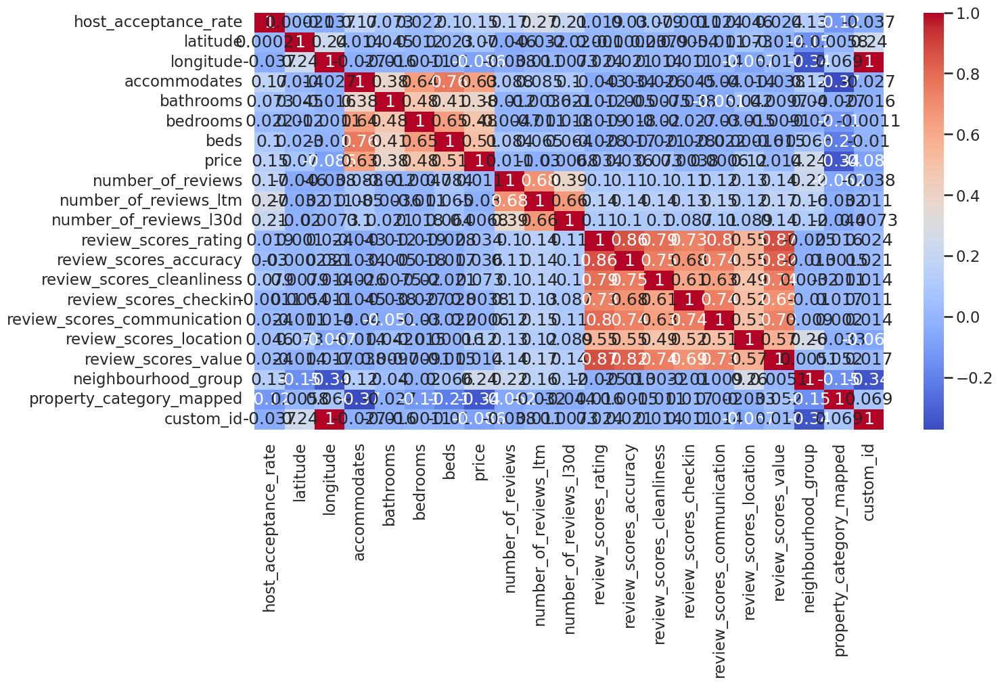

In [ ]:
#Grafico la matriz de correlación en un Heatmap
plt.figure(figsize = (15,8))
sns.heatmap(matriz_corr, annot = True, cmap='coolwarm')

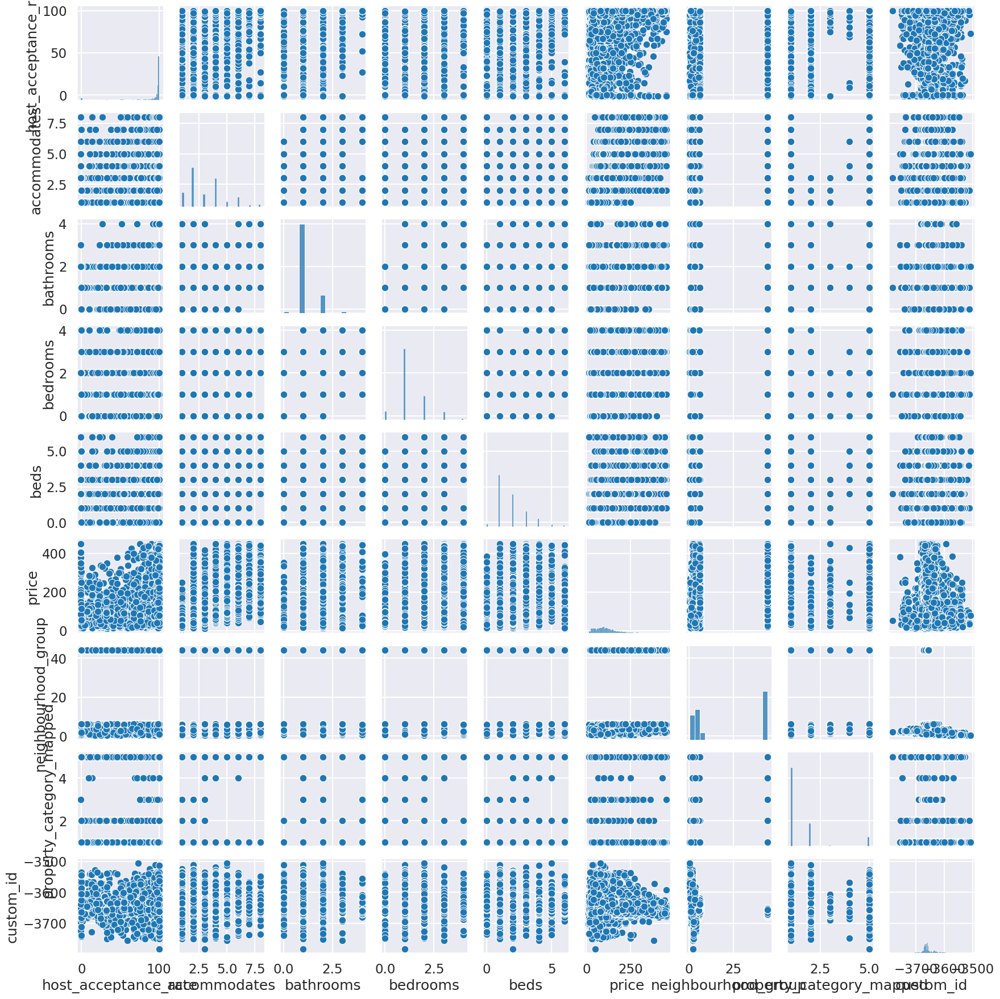

In [ ]:
#Elimino para la visualización columnas: latitude, longitude, y ninguna de las que tengan reviews. Porque es muy costoso hacerla de todas las variables.
import matplotlib.pyplot as plt
cols_to_exclude = ['latitude', 'longitude']
review_cols = [col for col in df.columns if 'review' in col]
cols_to_exclude.extend(review_cols)

cols_to_plot = [col for col in df.columns if col not in cols_to_exclude]

sns.pairplot(df[cols_to_plot], height=2)
plt.show()


Aqui hay un gráfico completo de pairplot pero es muy costoso para ejecutarse, tarda mucho tiempo por lo que lo dejamos comentado.

In [ ]:
#Grafico un pairplot
#sns.pairplot(df, height=2)

In [ ]:
modelo_regresion = LinearRegression()

dispersión geográfico de los datos

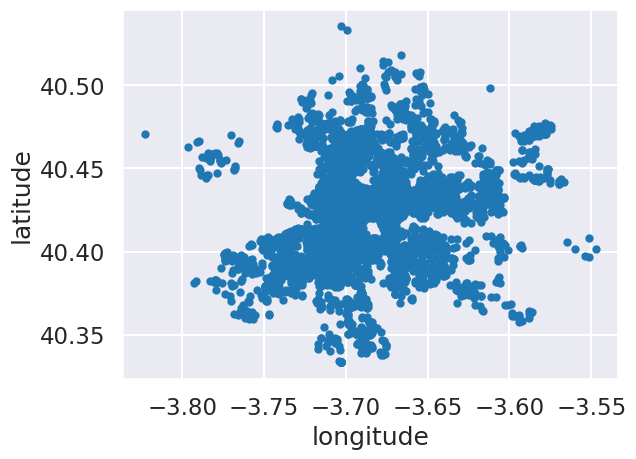

In [ ]:
df.plot(kind="scatter", x="longitude", y="latitude", grid=True)
plt.show()

Visualización mejor que resalta las áreas de alta densidad

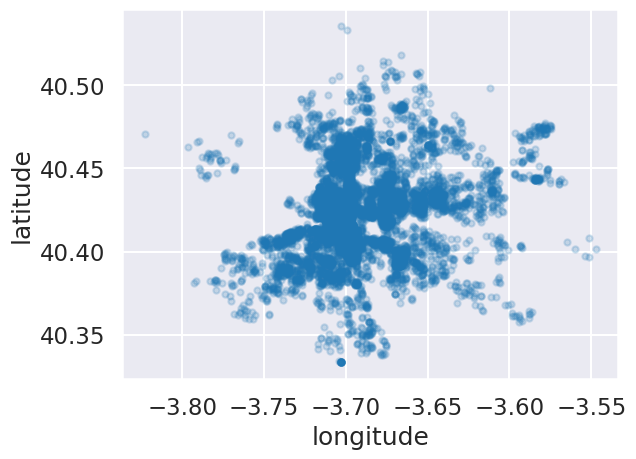

In [ ]:
df.plot(kind="scatter", x="longitude", y="latitude", grid=True, alpha=0.2)
plt.show()

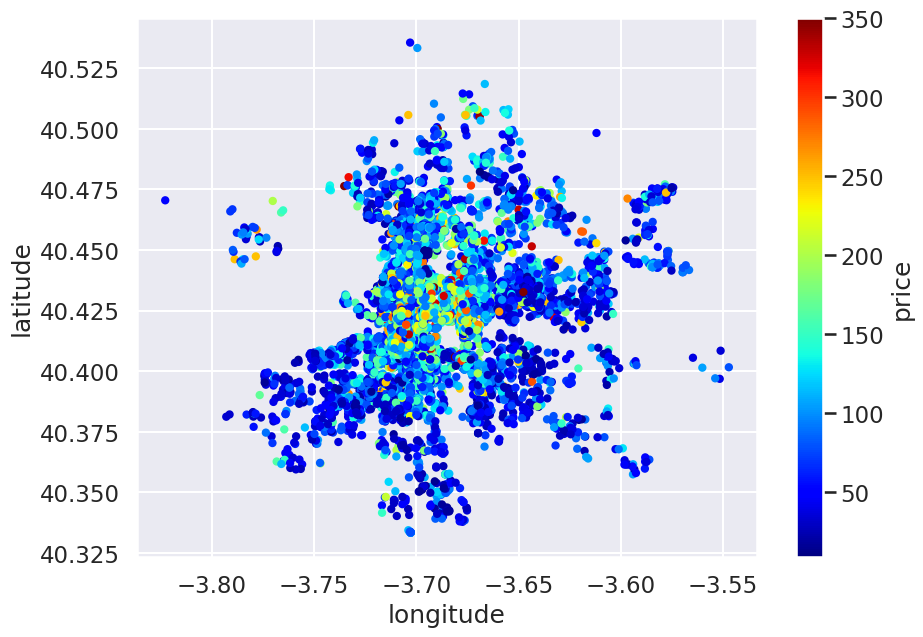

In [ ]:

df_filtrado_1 = df[df['price'].between(1, 350)]
df_filtrado_1.plot(kind="scatter", x="longitude", y="latitude", grid=True,
# s=df["population"] / 100, label="population",
 c="price", cmap="jet", colorbar=True,
 legend=True, sharex=False, figsize=(10, 7))
plt.show()

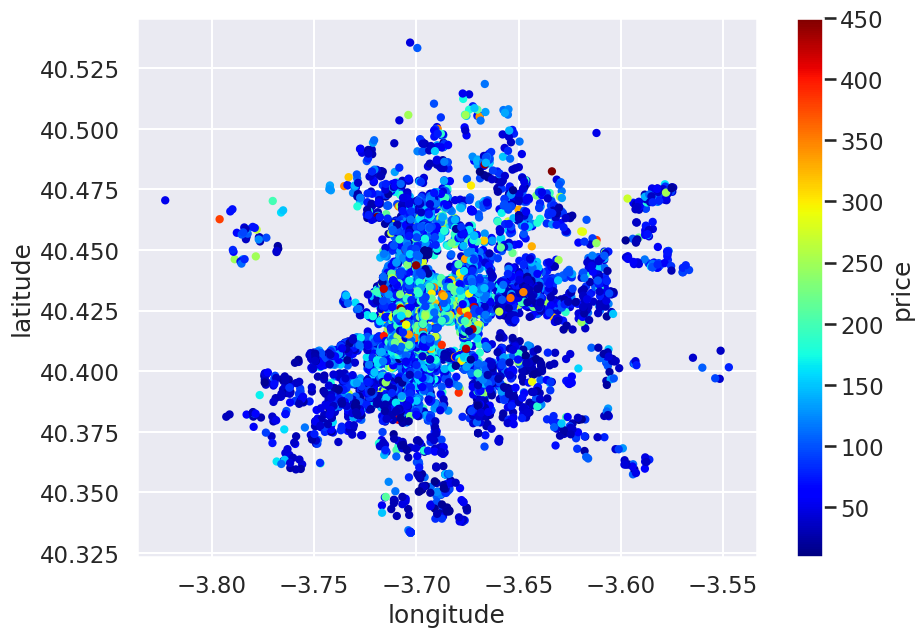

In [ ]:
df.plot(kind="scatter", x="longitude", y="latitude", grid=True,
# s=df["population"] / 100, label="population",
 c="price", cmap="jet", colorbar=True,
 legend=True, sharex=False, figsize=(10, 7))
plt.show()

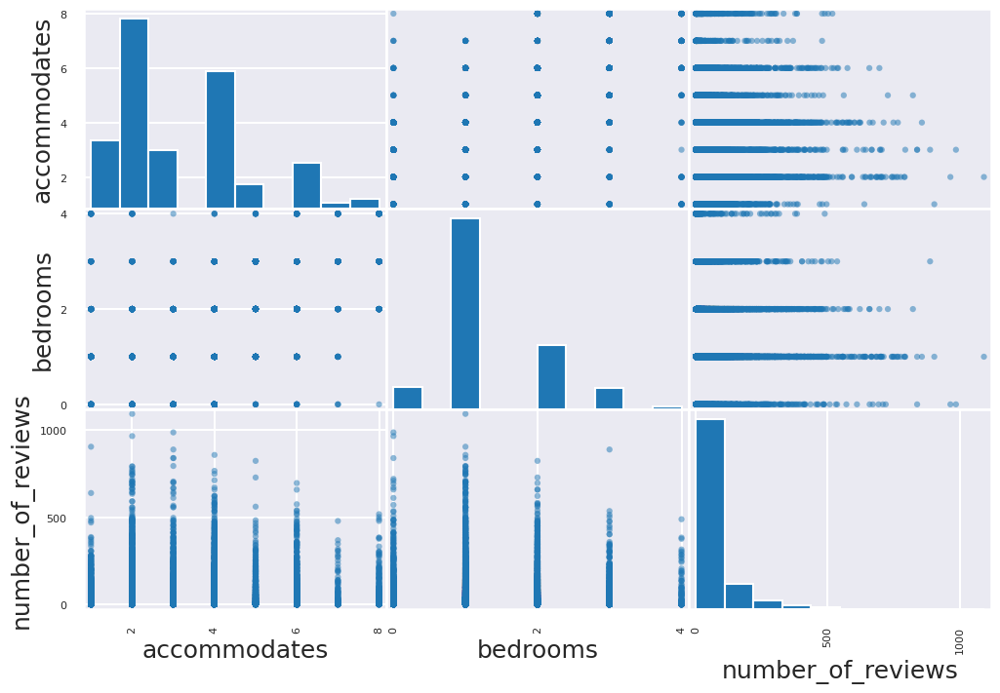

In [ ]:
from pandas.plotting import scatter_matrix
attributes = ["room_type", "accommodates", "bedrooms",
 "number_of_reviews"]
scatter_matrix(df[attributes], figsize=(12, 8))
plt.show()

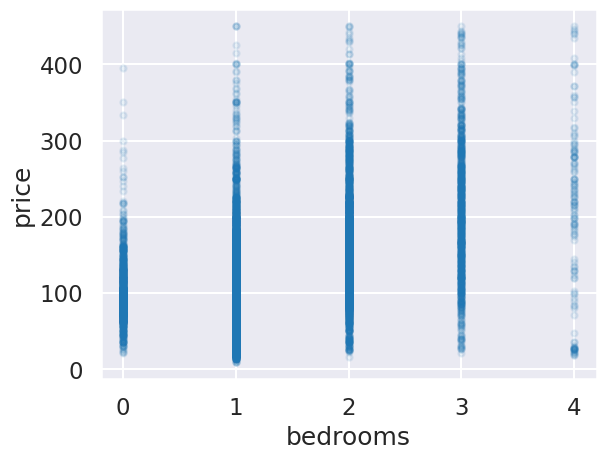

In [ ]:
df.plot(kind="scatter", x="bedrooms", y="price",
 alpha=0.1, grid=True)
plt.show()

Antes normalizaba los datos pero en algunos modelos no es necesario por lo que lo quitamos.

In [ ]:
#import pandas as pd
#from sklearn.preprocessing import StandardScaler
#numeric_cols = df.select_dtypes(include=['number']).columns

# Crea un objeto StandardScaler
#scaler = StandardScaler()

# Ajusta y transforma los datos
#df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

###Modelo Lineal Simple
Ejemplo del modelo simple ocn una sola variable a predecir precio. (la más correlacionada con price)  
X  = variable predictora o covariable  
Y = variable dependiente o de respuesta.

X = accomodates  
Y = price

In [ ]:
modelo_lineal_simple_1 = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
accommodates=df['accommodates'].values.reshape(-1, 1)
price=df['price'].values.reshape(-1, 1)

# le doy la variable predictora y la variable a predecir al modelo
modelo_lineal_simple_1.fit(accommodates,price)

#Coeficientes Estimados
B0_e=round(modelo_lineal_simple_1.intercept_[0],2)
B1_e=round(modelo_lineal_simple_1.coef_[0][0],2)

#Muestro el modelo
print(f" El modelo lineal simple ajustado es : price = {B1_e} * accomodates  + {B0_e}")

 El modelo lineal simple ajustado es : price = 27.43 * accomodates  + 28.96


¿Cómo se interpreta este modelo?

Tiene sentido que B0_e sea 0. Poruqe al haber 0 cantidad de personas para alojar no hay un precio si nadie ocupará el lugar.  

β1^  la pendiente. Entre más aumento la cantidad de accommodates, el precio incremente en un 0.63

**Probemoslo**  
¿Cuál sería el precio esperado si los accommodates son 3?

In [ ]:
#Vemos que valores estima el modelo para cada observacion
price_estim_accommodates= B1_e * accommodates + B0_e

#Lo agregamos en el dataframe
df['price_estim_accomodates']= B1_e * accommodates + B0_e
df[["price", "price_estim_accomodates"]].head(10)

<ipython-input-576-4f7e9cd709fe>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,price,price_estim_accomodates
0,150.0,138.68
1,137.0,138.68
2,244.0,193.54
4,69.0,138.68
6,32.0,56.39
7,125.0,83.82
9,40.0,56.39
10,48.0,56.39
11,123.0,138.68
12,98.0,83.82


Simplemente agrego columna de estimaciones al df

In [ ]:
#Vemos que valores estima el modelo para cada observacion
price_estim_accommodates=modelo_lineal_simple_1.predict(accommodates)

#Lo agregamos en el dataframe
df['price_estim_accomodates']= price_estim_accommodates
df.head(3)

<ipython-input-577-4138d3664cb3>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,listing_url,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,concatenated_categorical,property_category,neighbourhood_group,property_category_mapped,custom_id,price_estim_accomodates
0,https://www.airbnb.com/rooms/922279485725006244,2019-09-03,within a few hours,100.0,97,t,"['email', 'phone']",t,t,Centro,40.424930,-3.702830,Entire rental unit,Entire home/apt,4,1,2.0,2.0,150.0,14,11,2,2023-08-12,2024-09-08,4.64,4.71,4.36,4.64,4.79,4.93,4.64,t,https://www.airbnb.com/rooms/92227948572500624...,Entire Property,44.100304,1,-3662.405070,138.664314
1,https://www.airbnb.com/rooms/887120231398812211,2017-02-14,within an hour,100.0,99,f,"['email', 'phone']",t,t,Centro,40.421582,-3.702643,Entire rental unit,Entire home/apt,4,1,0.0,1.0,137.0,31,31,1,2023-09-25,2024-08-25,4.58,4.61,4.55,4.65,4.68,4.81,4.35,f,https://www.airbnb.com/rooms/88712023139881221...,Entire Property,44.100304,1,-3662.220918,138.664314
2,https://www.airbnb.com/rooms/707073912721841330,2020-11-30,within an hour,98.0,99,f,"['email', 'phone', 'work_email']",t,t,Centro,40.423830,-3.698840,Entire rental unit,Entire home/apt,6,2,2.0,3.0,244.0,67,33,2,2022-09-17,2024-09-04,4.78,4.75,4.73,4.51,4.66,4.94,4.67,t,https://www.airbnb.com/rooms/70707391272184133...,Entire Property,44.100304,1,-3658.416170,193.517782


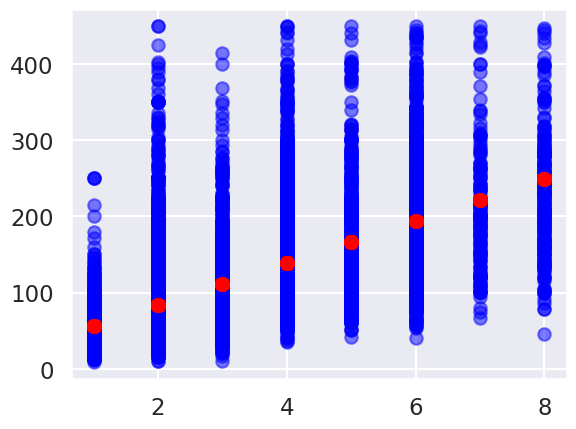

In [ ]:
#Grafico las observaciones reales + las estimadas
plt.scatter(df['accommodates'],df['price'],color='blue',alpha=0.5)
plt.scatter(df['accommodates'],df['price_estim_accomodates'], color='red',alpha=0.5)

#####Metricas
Veo cuánto pueden explicar el fenómeno o problema las variables estudiadas en predicción.


In [ ]:
#Metricas de los modelos
r2_accommodates = metrics.r2_score(price, price_estim_accommodates)
print(f"El R2 del modelo accommodates es: {r2_accommodates}")

El R2 del modelo accommodates es: 0.39523044756169257


El modelo accommodates logra explicar un 39.52% de la variablidad del problema.

######MSE y RMSE
Mientras más chico más cerca está nuestro modelo de los datos reales
MSE  
RMSE: esta en las unidades del problema. en este caso es a dolares. O sea que se equivoca por 55.60 dolares

In [ ]:
print("MSE de accomodates: " + str(metrics.mean_squared_error(price, price_estim_accommodates, squared=True)))
print("RMSE de accomodates: " + str(metrics.mean_squared_error(price, price_estim_accommodates, squared=False)))

MSE de accomodates: 3092.2983779345745
RMSE de accomodates: 55.60843801020286


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



######Seleccionar mejor variable
Para poder comparar los modelos y seleccionar aquél que mejor logra explicar el precio del airbnb evalua el  R2  (coeficiente de determinación), que representa la capacidad de predicción del modelo.

In [ ]:
from sklearn.metrics import r2_score

r2 = r2_score(df['price'], df['price_estim_accomodates'])
print(f"The R-squared (R2) value for the accommodates model is: {r2:.2f}")

The R-squared (R2) value for the accommodates model is: 0.40


#####Predicción y evaluación en datos de testeo
Uso dataframe de prueba. Un df que este modelo no ha visto.

In [ ]:
#Casos nuevos
accommodates_test=test_set['accommodates'].values.reshape(-1,1)

#Variable a predecir
price_test=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_accommodates     =  modelo_lineal_simple_1.predict(accommodates_test)

In [ ]:
#Error modelo accommodates
print('Modelo accommodates:')

mse = metrics.mean_squared_error(
        y_true  = price_test,
        y_pred  = price_predict_accommodates,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test,
        y_pred  = price_predict_accommodates,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

r2 = metrics.r2_score(price_test, price_predict_accommodates)
print(f"El R2 del modelo accommodates es: {r2}")

Modelo accommodates:
El error (mse) de test es: 3327.011196765543
El error (rmse) de test es: 57.68024962468127
El R2 del modelo accommodates es: 0.3823137578293744


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



el error en entrenamiento es de 55.60  
el error en test es de 57.68  
Está generalizando bien el modelo

Me guardo el modelo

In [ ]:
with open('modelo_lineal_simple_1.pkl', 'wb') as file:
    pickle.dump(modelo_lineal_simple_1, file)

###Modelos Lineal Múltiple

####Modelo 1: accommodates y neighbourhood_group
Vamos a estimar los parámetros y modelar la siguiente relación:

price^  =  β1^  * accomodates +  β2^  * neighbourhood_group +  β0^

#####Ajuste del modelo

In [ ]:
#Creo un regresor lineal
modelo_multiple_accom_neighb = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
variables=df[['accommodates','neighbourhood_group']]
price=df['price'].values.reshape(-1, 1)

#Ajusto el modelo
modelo_multiple_accom_neighb.fit(variables,price)

#Coeficientes estimados
B1_e=round(modelo_multiple_accom_neighb.coef_[0][0],2)
B2_e=round(modelo_multiple_accom_neighb.coef_[0][1],2)
B0_e=round(modelo_multiple_accom_neighb.intercept_[0],2)

#Muestro el modelo
print(f" El modelo lineal multiple ajustado es : price = {B1_e} * accomodates  + {B2_e} * neighbourhood_group + {B0_e}")

 El modelo lineal multiple ajustado es : price = 26.54 * accomodates  + 0.62 * neighbourhood_group + 18.52


¿Cómo interpretamos este modelo?
β1^ : por cada 1 persona permitida aumentan 26.54 euros (manteniendo constante el bario al que pertenece)

β2^ : por cada 1 aumentado en los numeros asignados al neighborhood group aumentan 0.62 euros (manteniendo constante la cant de personas), (ver el mapeo de neighborhood group que fue realizado segun su porcentaje en el df)

PREGUNTA A CORRECTOR:  
¿Cómo interpretar el 18.52 en este modelo donde si al tener variable accommodates en 0 no existe un precio al no existir local para ninguna persona.

#####Entrenamiento: Evaluación de las métricas del modelo ajustado

Caluclo R2: coeficiente de determinación

In [ ]:
r2=modelo_multiple_accom_neighb.score(variables,price)
print(f"El R2 del modelo_multiple_accom_neighb es: {r2}")

El R2 del modelo_multiple_accom_neighb es: 0.42442878493551106


Apenas mejors 0.2 respecto al del modelo linela simple con variable accommodates

In [ ]:
#R2 Ajustado
n=df.shape[0] #numero de observaciones
p=2                   #numero de variables independientes

adj_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adj_r2

0.42433812952283756

Vemos el error

In [ ]:
#RMSE
precio_pred_accomo_neigh=modelo_multiple_accom_neighb.predict(df[['accommodates','neighbourhood_group']])

rmse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_accomo_neigh,
        squared = False
       )
print(f"El error (rmse) del modelo modelo_multiple_accom_neighb es: {rmse}")

El error (rmse) del modelo modelo_multiple_accom_neighb es: 54.249441362686206


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Apenas mejora una cifra el error respecto del simple con accommodates.

#####Ponerlo a Prueba: Prediccion y Evaluación en datos de testeo

In [ ]:
#Casos nuevos
variable_test=test_set[['accommodates','neighbourhood_group']]

#Variable a predecir
price_test_accomm_neighb=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_variables_acomm_neighb    =  modelo_multiple_accom_neighb.predict(variable_test)

In [ ]:
r2_test = metrics.r2_score(price_test_accomm_neighb, price_predict_variables_acomm_neighb)
print(f"El R2 del modelo en test modelo_multiple_accom_neighb es: {r2_test}")


El R2 del modelo en test modelo_multiple_accom_neighb es: 0.41123089621776276


In [ ]:
#Error modelo_multiple_accom_neighb
print('Modelo modelo_multiple_accom_neighb:')

mse = metrics.mean_squared_error(
        y_true  = price_test_accomm_neighb,
        y_pred  = price_predict_variables_acomm_neighb,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test_accomm_neighb,
        y_pred  = price_predict_variables_acomm_neighb,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

Modelo modelo_multiple_accom_neighb:
El error (mse) de test es: 3171.256322157196
El error (rmse) de test es: 56.31390878066622


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Comparacion con error de modelo en entrenamiento:  
Solo empeora por 2 puntos  
  
  Comparacion con modelo simple de acommodates en test:  
  57.6 el simple  
  56.31  
  Mejora en un 1 punto


####Modelo 2: accommodates y beds (las dos variables más correlacionadas con price)
Voy a usar beds. Notar que beds es la seguna variable con mas correlacion con price.  
Pero tambien esta más correlacionada con accommodates y no es recomendable usar en multiple variables tan relacionadas entre ellas.  
Veamos qué pasa


In [ ]:
#Creo un regresor lineal
modelo_multiple_accommodates_beds = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
variables=df[['accommodates','beds']]
price=df['price'].values.reshape(-1, 1)

#Ajusto el modelo
modelo_multiple_accommodates_beds.fit(variables,price)

#Coeficientes estimados
B1_e=round(modelo_multiple_accommodates_beds.coef_[0][0],2)
B2_e=round(modelo_multiple_accommodates_beds.coef_[0][1],2)
B0_e=round(modelo_multiple_accommodates_beds.intercept_[0],2)

#Muestro el modelo
print(f" El modelo lineal multiple ajustado es : price = {B1_e} * accomodates  + {B2_e} * beds + {B0_e}")

 El modelo lineal multiple ajustado es : price = 24.47 * accomodates  + 5.73 * beds + 27.58


#####Entrenamiento: Evaluación de las métricas del modelo ajustado

Caluclo R2: coeficiente de determinación

In [ ]:
r2=modelo_multiple_accommodates_beds.score(variables,price)
print(f"El R2 del modelo_multiple_accommodates_beds es: {r2}")

El R2 del modelo_multiple_accommodates_beds es: 0.3986535514099152


el R2 emepeora 0.03 respecto al modelo 1

In [ ]:
#R2 Ajustado
n=df.shape[0] #numero de observaciones
p=2                   #numero de variables independientes

adj_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adj_r2

0.39855883626602007

Vemos el error

In [ ]:
#RMSE
precio_pred_accomo_beds=modelo_multiple_accommodates_beds.predict(df[['accommodates','beds']])

rmse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_accomo_beds,
        squared = False
       )
print(f"El error (rmse) del modelo modelo_multiple_accommodates_beds es: {rmse}")

El error (rmse) del modelo modelo_multiple_accommodates_beds es: 55.45083782923286


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Emepeora 1 punto respecto a modelo 1

#####Ponerlo a Prueba: Prediccion y Evaluación en datos de testeo

In [ ]:
#Casos nuevos
variable_test=test_set[['accommodates','beds']]

#Variable a predecir
price_test_accomm_beds=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_variables_acomm_beds    =  modelo_multiple_accommodates_beds.predict(variable_test)

In [ ]:
#Error modelo_multiple_accom_neighb
print('Modelo modelo_multiple_accom_neighb:')

mse = metrics.mean_squared_error(
        y_true  = price_test_accomm_beds,
        y_pred  = price_predict_variables_acomm_beds,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test_accomm_beds,
        y_pred  = price_predict_variables_acomm_beds,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

Modelo modelo_multiple_accom_neighb:
El error (mse) de test es: 3316.131982642325
El error (rmse) de test es: 57.585866170809005


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



56 a 57. Empeora un punto tambien en las pruebas con test respecto a modelo 1

Comparacion con error de modelo en entrenamiento:  
55.4 a 57.6
Solo empeora por 2 puntos  


#####Conclusión
A pesar de que en este modelo las 2 variables están más correlacioanadas con la variable a predecir.  
Al utilizar este modelo donde dos variables estan mas correlacionadas entre ellas que con la variable a predecir el modelo empeoró en comparación con el modelo 1 donde son 2 variables que no estan tan correlacionadas entre ellas.  
rmse empeora 1 punto respecto al modelo 1. En entrenamiento y test

####Modelo 3: accommodates y property_type (correlación positiva y negativa)
La variable property_category_mapped esta correlacionada con price de forma negativa.  
Variable accommodates esta relacionada positivamente.


Vamos a estimar los parámetros y modelar la siguiente relación:

price^  =  β1^  * accomodates +  β2^  * property_type +  β0^

In [ ]:
#Creo un regresor lineal
modelo_multiple_accom_property = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
variables=df[['accommodates','property_category_mapped']]
price=df['price'].values.reshape(-1, 1)

#Ajusto el modelo
modelo_multiple_accom_property.fit(variables,price)

#Coeficientes estimados
B1_e=round(modelo_multiple_accom_property.coef_[0][0],2)
B2_e=round(modelo_multiple_accom_property.coef_[0][1],2)
B0_e=round(modelo_multiple_accom_property.intercept_[0],2)

#Muestro el modelo
print(f" El modelo lineal multiple ajustado es : price = {B1_e} * accomodates  + {B2_e} * property + {B0_e}")

 El modelo lineal multiple ajustado es : price = 25.5 * accomodates  + -7.48 * property + 46.7


#####Entrenamiento: Evaluación de las métricas del modelo ajustado

Caluclo R2: coeficiente de determinación

In [ ]:
r2=modelo_multiple_accom_property.score(variables,price)
print(f"El R2 del modelo_multiple_accom_neighb es: {r2}")

El R2 del modelo_multiple_accom_neighb es: 0.4074108511604264


Es pero por 2 puntos que el modelo 1.

In [ ]:
#R2 Ajustado
n=df.shape[0] #numero de observaciones
p=2                   #numero de variables independientes

adj_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adj_r2

0.40731751533606997

Vemos el error

In [ ]:
#RMSE
precio_pred_accomo_property=modelo_multiple_accom_property.predict(df[['accommodates','property_category_mapped']])

rmse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_accomo_property,
        squared = False
       )
print(f"El error (rmse) del modelo modelo_multiple_accom_property es: {rmse}")

El error (rmse) del modelo modelo_multiple_accom_property es: 55.04559678586792


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Empeora por 1 punto respecto al modelo 1

#####Ponerlo a Prueba: Prediccion y Evaluación en datos de testeo

In [ ]:
#Casos nuevos
variable_test=test_set[['accommodates','property_category_mapped']]

#Variable a predecir
price_test_accomm_property=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_variables_acomm_property    =  modelo_multiple_accom_property.predict(variable_test)

In [ ]:
#Error modelo_multiple_accom_neighb
print('Modelo modelo_multiple_accom_neighb:')

mse = metrics.mean_squared_error(
        y_true  = price_test_accomm_property,
        y_pred  = price_predict_variables_acomm_property,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test_accomm_property,
        y_pred  = price_predict_variables_acomm_property,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

Modelo modelo_multiple_accom_neighb:
El error (mse) de test es: 3306.79593967924
El error (rmse) de test es: 57.504747105601986


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Comparacion con error de modelo en entrenamiento:  
Solo empeora por 2 puntos  


#####Coclusión
Hasta ahora se entrenaron 3 modelos lineales multiples con dos variables. Y los 3 suelen tener un compórtamiento parecido respecto a su entreneamiento y testeo.  
Todos coinciden en tener 2 puntos de diferencia en el error RMSE.

####Modelo 4: Uso de 3 variables. Accommodates, neighbourhood_group y bathrooms

#####Ajuste del modelo

In [ ]:
#Creo un regresor lineal
modelo_multiple_accom_neighb_bath = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
variables=df[['accommodates','neighbourhood_group','bathrooms']]
price=df['price'].values.reshape(-1, 1)

#Ajusto el modelo
modelo_multiple_accom_neighb_bath.fit(variables,price)

#Coeficientes estimados
B1_e=round(modelo_multiple_accom_neighb_bath.coef_[0][0],2)
B2_e=round(modelo_multiple_accom_neighb_bath.coef_[0][1],2)
B3_e=round(modelo_multiple_accom_neighb_bath.coef_[0][1],2)
B0_e=round(modelo_multiple_accom_neighb_bath.intercept_[0],2)

#Muestro el modelo
print(f" El modelo lineal multiple ajustado es : price = {B1_e} * accomodates  + {B2_e} * neighbourhood_group + {B3_e} bathrooms + {B0_e}")

 El modelo lineal multiple ajustado es : price = 23.8 * accomodates  + 0.62 * neighbourhood_group + 0.62 bathrooms + -1.36


#####Entrenamiento: Evaluación de las métricas del modelo ajustado

Caluclo R2: coeficiente de determinación

In [ ]:
r2=modelo_multiple_accom_neighb_bath.score(variables,price)
print(f"El R2 del modelo_multiple_accom_neighb es: {r2}")

El R2 del modelo_multiple_accom_neighb es: 0.44757068483008267


mejora 0.02 respecto al del modelo 1. Es el mejor hasta ahora

In [ ]:
#R2 Ajustado
n=df.shape[0] #numero de observaciones
p=2                   #numero de variables independientes

adj_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adj_r2

0.44748367438510395

Vemos el error

In [ ]:
#RMSE
precio_pred_accomo_neigh_bath=modelo_multiple_accom_neighb_bath.predict(df[['accommodates','neighbourhood_group','bathrooms']])

rmse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_accomo_neigh_bath,
        squared = False
       )
print(f"El error (rmse) del modelo modelo_multiple_accom_neighb es: {rmse}")

El error (rmse) del modelo modelo_multiple_accom_neighb es: 53.14765358321139


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



mejora una cifra el error respecto al modelo 1

#####Ponerlo a Prueba: Prediccion y Evaluación en datos de testeo

In [ ]:
#Casos nuevos
variable_test=test_set[['accommodates','neighbourhood_group','bathrooms']]

#Variable a predecir
price_test_accomm_neighb_bath=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_variables_acomm_neighb_bath    =  modelo_multiple_accom_neighb_bath.predict(variable_test)

In [ ]:
#Error modelo_multiple_accom_neighb
print('Modelo modelo_multiple_accom_neighb:')

mse = metrics.mean_squared_error(
        y_true  = price_test_accomm_neighb_bath,
        y_pred  = price_predict_variables_acomm_neighb_bath,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test_accomm_neighb_bath,
        y_pred  = price_predict_variables_acomm_neighb_bath,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

Modelo modelo_multiple_accom_neighb:
El error (mse) de test es: 3066.2209605882913
El error (rmse) de test es: 55.37346802023774


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Comparacion con error de modelo en entrenamiento:  
 empeora por 2 puntos  


#####Conclusión:
Respecto al Modelo 1 (que era el mejor)  
Usando más de dos variables en general todo mejoró usando una sola variable más.  

-r2: mejora 0.02 (recordar va de 0 a 1)  
-rmse en entrenamiento: mejora 1 punto  
-rmse en test: mejora 1 punto

####Modelo 5: Uso de 5 variables. Accommodates, neighbourhood_group, bathrooms, reviews_scored_location y property_type

#####Ajuste del modelo

In [ ]:
#Creo un regresor lineal
modelo_multiple_5 = LinearRegression()

#Doy el formato adecuado a las variables dependiente e independiente
variables=df[['accommodates','neighbourhood_group','bathrooms','review_scores_location','property_category_mapped']]
price=df['price'].values.reshape(-1, 1)

#Ajusto el modelo
modelo_multiple_5.fit(variables,price)

#Coeficientes estimados
B1_e=round(modelo_multiple_5.coef_[0][0],2)
B2_e=round(modelo_multiple_5.coef_[0][1],2)
B3_e=round(modelo_multiple_5.coef_[0][1],2)
B4_e=round(modelo_multiple_5.coef_[0][1],2)
B5_e=round(modelo_multiple_5.coef_[0][1],2)
B0_e=round(modelo_multiple_5.intercept_[0],2)

#Muestro el modelo
print(f" El modelo lineal multiple ajustado es : price = {B1_e} * accomodates  + {B2_e} * neighbourhood_group + {B3_e}*bathrooms + {B4_e}*reviews_scored_location +{B5_e}* property_category_mapped  + {B0_e}")

 El modelo lineal multiple ajustado es : price = 21.88 * accomodates  + 0.49 * neighbourhood_group + 0.49*bathrooms + 0.49*reviews_scored_location +0.49* property_category_mapped  + -58.62


#####Entrenamiento: Evaluación de las métricas del modelo ajustado

Caluclo R2: coeficiente de determinación

In [ ]:
r2=modelo_multiple_5.score(variables,price)
print(f"El R2 del modelo_multiple_5 es: {r2}")

El R2 del modelo_multiple_5 es: 0.46667011403877645


mejora 0.02 respecto al modelo 4 (el anterior mejor)  
de 0.44 a 0.46.

In [ ]:
#R2 Ajustado
n=df.shape[0] #numero de observaciones
p=2                   #numero de variables independientes

adj_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adj_r2

0.46658611185166643

Vemos el error

In [ ]:
#RMSE
precio_pred_5=modelo_multiple_5.predict(df[['accommodates','neighbourhood_group','bathrooms','review_scores_location','property_category_mapped']])

mse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_5,
        squared = True
       )

print(f"El error (mse) del modelo precio_pred_5 es: {mse}")

rmse = metrics.mean_squared_error(
        y_true  = price,
        y_pred  = precio_pred_5,
        squared = False
       )
print(f"El error (rmse) del modelo precio_pred_5 es: {rmse}")

El error (mse) del modelo precio_pred_5 es: 2727.0141736015385
El error (rmse) del modelo precio_pred_5 es: 52.22082126510017


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



mejora una cifra el error respecto al modelo 4

#####Ponerlo a Prueba: Prediccion y Evaluación en datos de testeo

In [ ]:
#Casos nuevos
variable_test=test_set[['accommodates','neighbourhood_group','bathrooms','review_scores_location','property_category_mapped']]

#Variable a predecir
price_test_5=test_set['price'].values.reshape(-1,1)

#Prediccion sobre casos nuevos con mis modelos ya entrenados
price_predict_5    =  modelo_multiple_5.predict(variable_test)

In [ ]:
r2_test_5 = metrics.r2_score(price_test_5, price_predict_5)
print(f"El R2 del modelo en test modelo_multiple_5 es: {r2_test_5}")


El R2 del modelo en test modelo_multiple_5 es: 0.44142318281362314


In [ ]:
#Error modelo_multiple_accom_neighb
print('Modelo modelo_multiple_5:')

mse = metrics.mean_squared_error(
        y_true  = price_test_5,
        y_pred  = price_predict_5,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")


rmse = metrics.mean_squared_error(
        y_true  = price_test_5,
        y_pred  = price_predict_5,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

Modelo modelo_multiple_5:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



El error (mse) de test es: 3008.6331832519363
El error (rmse) de test es: 54.85100895381904


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Comparacion con error de modelo en entrenamiento:  
 empeora por 2 puntos  


#####Conclusión:
Respecto al Modelo 4 (que era el mejor)  
Usando 5 variables en general todo mejoró usando dos variables más.  

-r2: mejora 0.02 (recordar va de 0 a 1)  
-rmse en entrenamiento: mejora 1 punto  
-rmse en test: mejora 1 punto

####Conclusion
Orden del mejor modelo al peor:  
Modelo 5  
Modelo 4  
Modelo 1   
Modelo 3  
Modelo 2  

  Todos coinciden en relacion al error de RMSE respecto de su entreneamiento y prueba en tests. Todos empeoran 2 puntos.  
  Modelo 3 y 2 son muy iguales.  
   El resto van mejorando un punto en el error RMSE.  
  Y tambien mejoran 0.02 en R2.

  El mejor modelo es el modelo 5, el que tiene más variables que el resto (5). La elección de las variables influye en que sea mejor.  


  

 Con Respecto al modelo simple de la variable accommodates la cual es la variable con mas correalación con price la mejora no es tan distinta. Incluso es mejor que el modelo 2 y 3 levemente.

 Comparacion mejor modelo y modelo lineal simple:  

   -Error en RMSE(en tests):  57.68 vs 54.85.  
    -R2: 0.40 vs 0.46

Me guardo el mejor modelo, que en este caso es el Modelo 5

In [ ]:
with open('modelo_lineal_multiple_5.pkl', 'wb') as archivo:
    pickle.dump(modelo_multiple_5, archivo)

###k-nearest neighbors algorithm

####1 K-Nearest Neighbors

Elijo las variables más correlacionadas con price

In [ ]:
from sklearn.model_selection import train_test_split
#selecciono variables regresoras y a predecir
X = df[['accommodates', 'bathrooms', 'bedrooms','beds','property_category_mapped','neighbourhood_group']]
y = df.price

#Separacion Train/test  (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=12)

[Text(0.5, 0, 'Variable')]

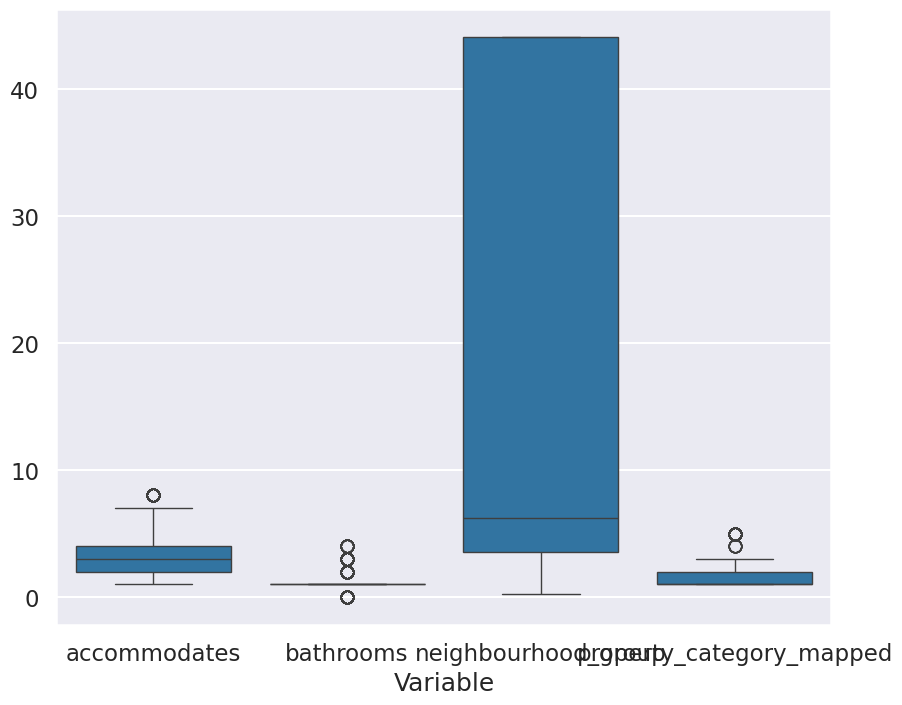

In [ ]:
#Grafico Boxplot Conjunto
sns.set_context('talk')
sns.set_style("darkgrid")

variables=[]
valores=[]

variables =['accommodates']*len(list(X_train.accommodates)) + ['bathrooms']*len(list(X_train.bathrooms))+ ['neighbourhood_group']*len(list(X_train.neighbourhood_group)) + ['property_category_mapped']*len(list(X_train.property_category_mapped))

valores=list(X_train.accommodates) + list(X_train.bathrooms)+list(X_train.neighbourhood_group)+list(X_train.property_category_mapped)

plt.figure(figsize=(10,8))
grafico=sns.boxplot(x=variables,y=valores)
grafico.set(xlabel='Variable')

Podemos ver que aunque muestra outliers en los boxplot, esos outliers están bien, son valores esperados, no están lejos de lo normal. En particular en bathrooms está así de aplastado porque la gran mayoría estan en un mismo valor. Decido dejarlos así.

In [ ]:
#Heatmap correlación
X_train.corr().style.background_gradient(cmap='coolwarm')

,accommodates,bathrooms,bedrooms,beds,property_category_mapped,neighbourhood_group
accommodates,1.000000,0.377154,0.638304,0.758002,-0.370080,0.123385
bathrooms,0.377154,1.000000,0.471985,0.406603,-0.022212,0.041365
bedrooms,0.638304,0.471985,1.000000,0.647565,-0.110020,-0.016943
beds,0.758002,0.406603,0.647565,1.000000,-0.207131,0.072469
property_category_mapped,-0.370080,-0.022212,-0.110020,-0.207131,1.000000,-0.156566
neighbourhood_group,0.123385,0.041365,-0.016943,0.072469,-0.156566,1.000000


<Axes: xlabel='accommodates', ylabel='price'>

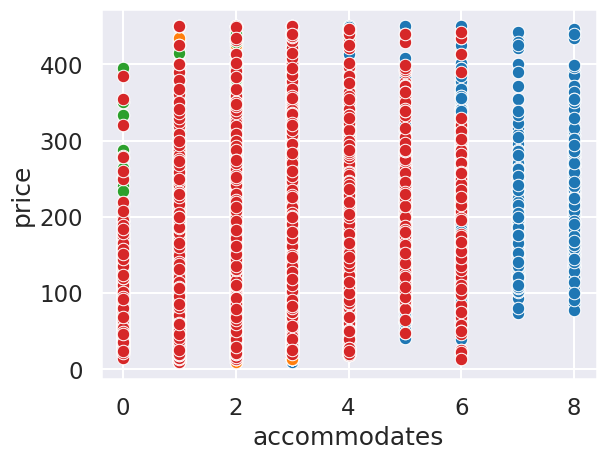

In [ ]:
sns.scatterplot(x=X_train.accommodates,y=y_train)
sns.scatterplot(x=X_train.bathrooms,y=y_train)
sns.scatterplot(x=X_train.bedrooms,y=y_train)
sns.scatterplot(x=X_train.beds,y=y_train)

<Axes: xlabel='property_category_mapped', ylabel='price'>

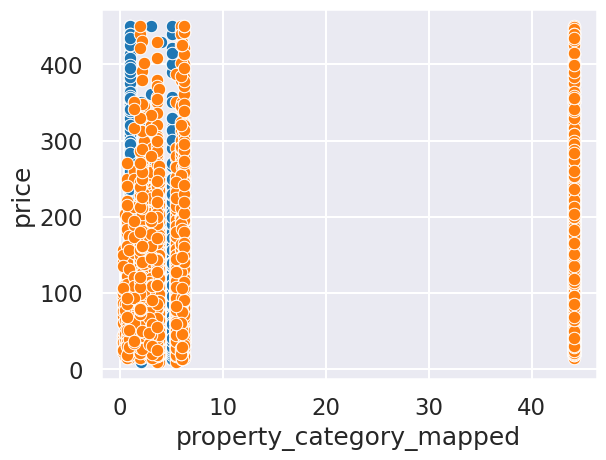

In [ ]:
sns.scatterplot(x=X_train.property_category_mapped	,y=y_train)
sns.scatterplot(x=X_train.neighbourhood_group	,y=y_train)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

# Creo un modelo KNN para regresion y lo ajusto
knn_regressor = KNeighborsRegressor().fit(X_train, y_train)

#Hago una predicción
y_pred=knn_regressor.predict(X_test)

In [ ]:
# Performance
performance = pd.DataFrame({'Valor Real': y_test,
                            'Prediccion': y_pred,
                            'Error': y_test - y_pred})
# View
performance.head()

,Valor Real,Prediccion,Error
9902,129.0,122.2,6.8
10992,53.0,53.0,0.0
317,129.0,135.4,-6.4
17603,70.0,71.0,-1.0
18830,36.0,39.2,-3.2


No esta nada mal la predicción!

In [ ]:
#Metricas para evaluar modelos
from sklearn import metrics

#Mean Square Error
mse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")

#Root Mean Square Error
rmse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

El error (mse) de test es: 2643.970137741047
El error (rmse) de test es: 51.41955015109571


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [ ]:
#Coef. de Determinación R2
score_knn = knn_regressor.score(X_test, y_test)
score_knn

0.49997817454794835

####2 K-Nearest Neighbors

 Pruebo con Menos variables

In [ ]:
#selecciono variables regresoras y a predecir
X = df[['accommodates', 'bathrooms', 'bedrooms','beds']]
y = df.price

#Separacion Train/test  (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=12)

In [ ]:
#Heatmap correlación
X_train.corr().style.background_gradient(cmap='coolwarm')

,accommodates,bathrooms,bedrooms,beds
accommodates,1.000000,0.377154,0.638304,0.758002
bathrooms,0.377154,1.000000,0.471985,0.406603
bedrooms,0.638304,0.471985,1.000000,0.647565
beds,0.758002,0.406603,0.647565,1.000000


<Axes: xlabel='accommodates', ylabel='price'>

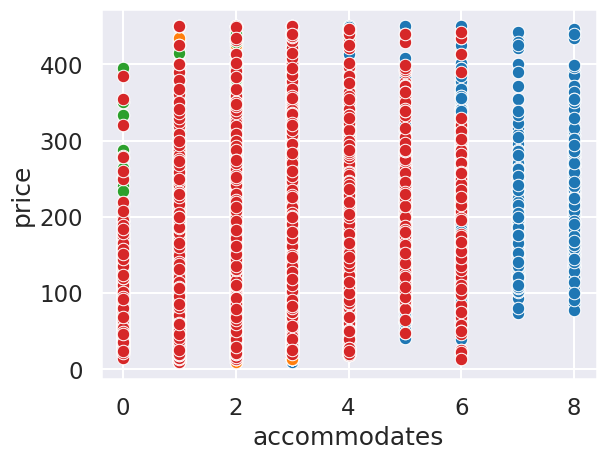

In [ ]:
sns.scatterplot(x=X_train.accommodates,y=y_train)
sns.scatterplot(x=X_train.bathrooms,y=y_train)
sns.scatterplot(x=X_train.bedrooms,y=y_train)
sns.scatterplot(x=X_train.beds,y=y_train)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

# Creo un modelo KNN para regresion y lo ajusto
knn_regressor = KNeighborsRegressor().fit(X_train, y_train)

#Hago una predicción
y_pred=knn_regressor.predict(X_test)

In [ ]:
# Performance
performance = pd.DataFrame({'Valor Real': y_test,
                            'Prediccion': y_pred,
                            'Error': y_test - y_pred})
# View
performance.head()

,Valor Real,Prediccion,Error
9902,129.0,86.4,42.6
10992,53.0,109.4,-56.4
317,129.0,124.4,4.6
17603,70.0,100.4,-30.4
18830,36.0,29.2,6.8


In [ ]:
#Metricas para evaluar modelos
from sklearn import metrics

#Mean Square Error
mse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")

#Root Mean Square Error
rmse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

El error (mse) de test es: 3321.9477528532075
El error (rmse) de test es: 57.636340557440036


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [ ]:
#Coef. de Determinación R2
score_knn = knn_regressor.score(X_test, y_test)
score_knn

0.371760537031948

Quitando dos variables la predicción empeoró.  
7 puntos en rmse y 13 en k2.

####3 K-Nearest Neighbors

Agrego dos variables más

In [ ]:
#selecciono variables regresoras y a predecir
X = df[['accommodates', 'bathrooms', 'bedrooms','beds','property_category_mapped','neighbourhood_group','host_acceptance_rate','review_scores_location']]
y = df.price

#Separacion Train/test  (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=12)

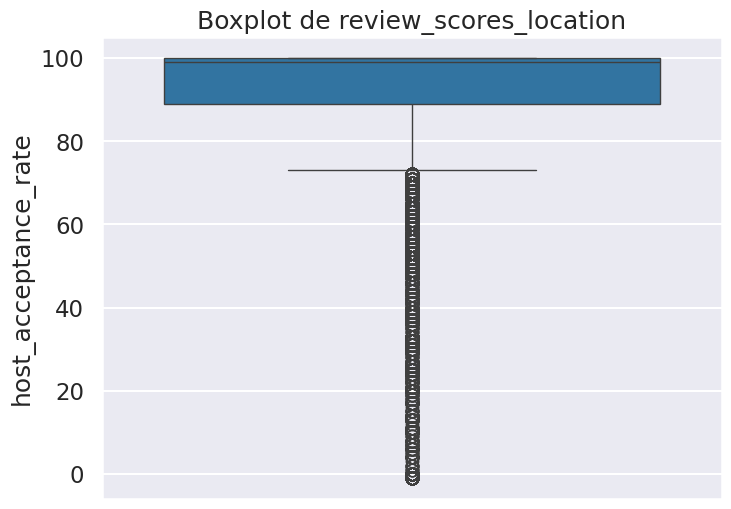

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(y=df['host_acceptance_rate'])
plt.title('Boxplot de review_scores_location')
plt.show()

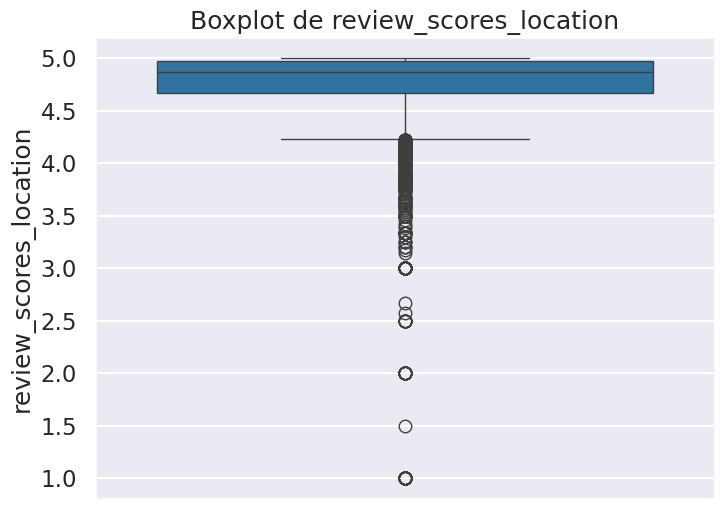

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(y=df['review_scores_location'])
plt.title('Boxplot de review_scores_location')
plt.show()


In [ ]:
#Heatmap correlación
X_train.corr().style.background_gradient(cmap='coolwarm')

,accommodates,bathrooms,bedrooms,beds,property_category_mapped,neighbourhood_group,host_acceptance_rate,review_scores_location
accommodates,1.000000,0.377154,0.638304,0.758002,-0.370080,0.123385,0.176382,-0.016440
bathrooms,0.377154,1.000000,0.471985,0.406603,-0.022212,0.041365,0.076089,0.034030
bedrooms,0.638304,0.471985,1.000000,0.647565,-0.110020,-0.016943,0.024894,-0.022137
beds,0.758002,0.406603,0.647565,1.000000,-0.207131,0.072469,0.104723,-0.001636
property_category_mapped,-0.370080,-0.022212,-0.110020,-0.207131,1.000000,-0.156566,-0.128456,-0.039629
neighbourhood_group,0.123385,0.041365,-0.016943,0.072469,-0.156566,1.000000,0.124677,0.266214
host_acceptance_rate,0.176382,0.076089,0.024894,0.104723,-0.128456,0.124677,1.000000,0.054140
review_scores_location,-0.016440,0.034030,-0.022137,-0.001636,-0.039629,0.266214,0.054140,1.000000


In [ ]:
from sklearn.neighbors import KNeighborsRegressor

# Creo un modelo KNN para regresion y lo ajusto
knn_regressor = KNeighborsRegressor().fit(X_train, y_train)

#Hago una predicción
y_pred=knn_regressor.predict(X_test)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
# Predicciones en entrenamiento
y_train_pred = knn_regressor.predict(X_train)

# MSE, RMSE y r2 en entrenamiento
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

#en prueba
mse_test = mean_squared_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred)

# Resultados
print(f"MSE en entrenamiento: {mse_train}")
print(f"RMSE en entrenamiento: {rmse_train}")
print(f"R² en entrenamiento: {r2_train}\n")

print(f"MSE en test: {mse_test}")
print(f"RMSE en test: {rmse_test}")
print(f"R² en test: {r2_test}")


MSE en entrenamiento: 1640.9762362204724
RMSE en entrenamiento: 40.50896488705275
R² en entrenamiento: 0.6763054767441499

MSE en test: 2571.1419756001574
RMSE en test: 50.706429331990606
R² en test: 0.5137512766182759


In [ ]:
# Performance
performance = pd.DataFrame({'Valor Real': y_test,
                            'Prediccion': y_pred,
                            'Error': y_test - y_pred})
# View
performance.head()

,Valor Real,Prediccion,Error
9902,129.0,110.2,18.8
10992,53.0,100.0,-47.0
317,129.0,117.6,11.4
17603,70.0,72.4,-2.4
18830,36.0,53.0,-17.0


In [ ]:
#Metricas para evaluar modelos
from sklearn import metrics

#Mean Square Error
mse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = True
       )

print(f"El error (mse) de test es: {mse}")

#Root Mean Square Error
rmse = metrics.mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred,
        squared = False
       )

print(f"El error (rmse) de test es: {rmse}")

El error (mse) de test es: 2571.1419756001574
El error (rmse) de test es: 50.706429331990606


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [ ]:
#Coef. de Determinación R2
score_knn = knn_regressor.score(X_test, y_test)
score_knn

0.5137512766182759

####Conclusion
Entre más variables se utilicen en KNN mejor es la predicción.  
A diferencia de Modelo lineal simple, en KNN no importa si las variables están también muy correlacionadas con las otras que no son la variable a predecir.  
  
  
Usando las 8 variables con mejor correclación a price se obtiene:  


In [ ]:
print(f"mse: {mse}")
print(f"rmse: {rmse}")
print(f"r2: {score_knn}")

mse: 2571.1419756001574
rmse: 50.706429331990606
r2: 0.5137512766182759


####Ajuste del parámetro n_neighbors.  
Es la cantidad de vecinos más cercanos que el modelo utiliza para hacer las predicciones.  
Hago dos funciones probando distintos k y viendo sus mse, rmse y k2 para ver cual es el mejor k

En estas funciones se agrega el test pero para elegir el mejor k nos basamos solamente en los resultados de entrenamiento. Porque no deberiamos nunca poder ver los de test, se hace con fines de ver si en entrenameinto y tests son acordes y vemos que lo son.

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_score
import numpy as np

X = df[['accommodates', 'bathrooms', 'bedrooms','beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df.price
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

print("Los distintos k con datos sin escalar:")
for k in range(1, 21):
    knn_reg = KNeighborsRegressor(n_neighbors=k)
    scores = cross_val_score(knn_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')#mse
    rmse_cv = np.sqrt(-scores.mean())#rmse

    # entrenamiento
    knn_reg.fit(X_train, y_train)
    y_train_pred = knn_reg.predict(X_train)

    #En test
    y_test_pred = knn_reg.predict(X_test)

    # MSE, RMSE y R2 en el conjunto de entrenamiento
    mse_train = mean_squared_error(y_train, y_train_pred)
    rmse_train = root_mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    #MSE, RMSE y R2 en el conjunto de prueba
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_test = root_mean_squared_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)

    print(f'k= {k}')
    print("Entrenamiento:  "  f'MSE={mse_train:.3f}, Train RMSE={rmse_train:.3f}, Train R²={r2_train:.3f}')
    print(f'Test:           MSE={mse_test:.3f}, Test RMSE={rmse_test:.3f}, Test R²={r2_test:.3f}')


Los distintos k con datos sin escalar:
k= 1
Entrenamiento:  MSE=736.463, Train RMSE=27.138, Train R²=0.855
Test:           MSE=3968.312, Test RMSE=62.995, Test R²=0.250
k= 2
Entrenamiento:  MSE=1154.774, Train RMSE=33.982, Train R²=0.772
Test:           MSE=3077.491, Test RMSE=55.475, Test R²=0.418
k= 3
Entrenamiento:  MSE=1400.341, Train RMSE=37.421, Train R²=0.724
Test:           MSE=2774.969, Test RMSE=52.678, Test R²=0.475
k= 4
Entrenamiento:  MSE=1544.154, Train RMSE=39.296, Train R²=0.695
Test:           MSE=2637.862, Test RMSE=51.360, Test R²=0.501
k= 5
Entrenamiento:  MSE=1640.976, Train RMSE=40.509, Train R²=0.676
Test:           MSE=2571.142, Test RMSE=50.706, Test R²=0.514
k= 6
Entrenamiento:  MSE=1706.700, Train RMSE=41.312, Train R²=0.663
Test:           MSE=2557.624, Test RMSE=50.573, Test R²=0.516
k= 7
Entrenamiento:  MSE=1776.302, Train RMSE=42.146, Train R²=0.650
Test:           MSE=2508.592, Test RMSE=50.086, Test R²=0.526
k= 8
Entrenamiento:  MSE=1827.664, Train RMSE

In [ ]:
# Importar la librería para escalar
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import root_mean_squared_error

X = df[['accommodates', 'bathrooms', 'bedrooms','beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df.price
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

#Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Los distintos k escalados:")
k=19
knn_reg = KNeighborsRegressor(n_neighbors=k)
scores = cross_val_score(knn_reg, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')

rmse_cv = np.sqrt(-scores.mean())
knn_reg.fit(X_train_scaled, y_train)
y_train_pred = knn_reg.predict(X_train_scaled)

y_test_pred = knn_reg.predict(X_test_scaled)

mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = root_mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = root_mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f'k= {k}')
print("Entrenamiento:  "  f'MSE={mse_train:.3f}, Train RMSE={rmse_train:.3f}, Train R²={r2_train:.3f}')
print(f'Test:           MSE={mse_test:.3f}, Test RMSE={rmse_test:.3f}, Test R²={r2_test:.3f}')


Los distintos k escalados:
k= 19
Entrenamiento:  MSE=2014.833, Train RMSE=44.887, Train R²=0.603
Test:           MSE=2365.010, Test RMSE=48.631, Test R²=0.553


Se puede ver que con los datos escalados la predicción es mejor, en particular en k=19.

In [ ]:
X = df[['accommodates', 'bathrooms', 'bedrooms','beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df.price
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

#Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

k=19
knn_reg = KNeighborsRegressor(n_neighbors=k)
scores = cross_val_score(knn_reg, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')

rmse_cv = np.sqrt(-scores.mean())
knn_reg.fit(X_train_scaled, y_train)
y_train_pred = knn_reg.predict(X_train_scaled)

y_test_pred = knn_reg.predict(X_test_scaled)

mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = root_mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = root_mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)



####Conclusión 2
Luego de probar los ditintos k y los datos escalados, obtenemos el resultado:

In [ ]:
print(f'k= {k}')
print("Entrenamiento:  "  f'MSE={mse_train:.3f}, Train RMSE={rmse_train:.3f}, Train R²={r2_train:.3f}')
print(f'Test:           MSE={mse_test:.3f}, Test RMSE={rmse_test:.3f}, Test R²={r2_test:.3f}')

k= 19
Entrenamiento:  MSE=2014.833, Train RMSE=44.887, Train R²=0.603
Test:           MSE=2365.010, Test RMSE=48.631, Test R²=0.553


Me guardo el modelo con K=19

In [ ]:
with open('modelo_knn_k_19.pkl', 'wb') as archivo:
    pickle.dump(knn_reg, archivo)

###XGBoost

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import pickle

df_para_xgboost = df.drop(['custom_id', 'property_type', 'listing_url', 'host_since', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_group_cleansed', 'first_review', 'last_review', 'concatenated_categorical', 'property_category'], axis='columns', inplace=False)
df_para_xgboost[['accommodates', 'bathrooms', 'bedrooms', 'beds']] = df_para_xgboost[['accommodates', 'bathrooms', 'bedrooms', 'beds']].astype(float)
df_para_xgboost = pd.get_dummies(df_para_xgboost, columns=['room_type', 'instant_bookable'])

######Modelo XGB 1: Variables con mejor correlacion

Primero tomo un dataframe con las variables que mejor correlacion tienen con Price

In [ ]:
df_mejor_correlacion = df_para_xgboost[['price', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'neighbourhood_group', 'property_category_mapped']].copy()
df_mejor_correlacion.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     12701 non-null  float64
 1   accommodates              12701 non-null  float64
 2   bathrooms                 12701 non-null  float64
 3   bedrooms                  12701 non-null  float64
 4   beds                      12701 non-null  float64
 5   neighbourhood_group       12701 non-null  float64
 6   property_category_mapped  12701 non-null  int64  
dtypes: float64(6), int64(1)
memory usage: 793.8 KB


In [ ]:
df_mejor_correlacion.head()

,price,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
0,150.0,4.0,1.0,2.0,2.0,44.100304,1
1,137.0,4.0,1.0,0.0,1.0,44.100304,1
2,244.0,6.0,2.0,2.0,3.0,44.100304,1
4,69.0,4.0,1.0,1.0,1.0,3.133004,1
6,32.0,1.0,1.0,1.0,1.0,3.794151,2


In [ ]:
df_variables_x = df_mejor_correlacion.drop(['price'], axis='columns', inplace=False)
df_to_predict_y = df_mejor_correlacion['price'].copy()

x_train, x_test, y_train, y_test = train_test_split(df_variables_x, df_to_predict_y, test_size=0.2, random_state=2)


In [ ]:
x_train.head(2)

,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
14490,2.0,1.0,1.0,1.0,0.470546,2
14783,6.0,1.0,2.0,6.0,44.100304,1


In [ ]:
y_train.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test.head(2)

,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
4895,1.0,2.0,1.0,1.0,2.322950,2
16061,4.0,1.0,2.0,2.0,3.001966,1


In [ ]:
y_test.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters = {
    'objective': ['reg:squarederror'],
    'max_depth': [4, 5, 6, 8, 9],
    'learning_rate': [0.1, 0.3, 0.5],
    'n_estimators': [10, 50, 100],
    'lambda': [0, 1, 5, 10, 20],
    'gamma': [50, 100, 150, 200]
}
folds = 5

first_model = xgb.XGBRegressor()

#Con RandomizedSearchCV
hyperparam_cv = RandomizedSearchCV(estimator=first_model, param_distributions=parameters, cv=folds, random_state=2)
hyperparam_cv.fit(x_train, y_train)
for i in range(6, 10):
  prueba = RandomizedSearchCV(estimator=first_model, param_distributions=parameters, cv=i, random_state=2)
  prueba.fit(x_train, y_train)
  if prueba.best_score_ > hyperparam_cv.best_score_:
    hyperparam_cv = prueba
    folds = i

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
best_parameters = hyperparam_cv.best_params_
print("Best parameters: ")
print(best_parameters)
print("\nBest score: ")
print(hyperparam_cv.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'objective': 'reg:squarederror', 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1, 'lambda': 1, 'gamma': 100}

Best score: 
0.5838344380265295

Number of folds for the best score: 
7


In [ ]:
xgbr = xgb.XGBRegressor(objective =best_parameters['objective'], learning_rate = best_parameters['learning_rate'],
                  max_depth = best_parameters['max_depth'], alpha = 10, n_estimators = best_parameters['n_estimators'], gamma = best_parameters['gamma'], reg_lambda = best_parameters['lambda'])
xgbr.fit(x_train,y_train)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=100, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, ...)

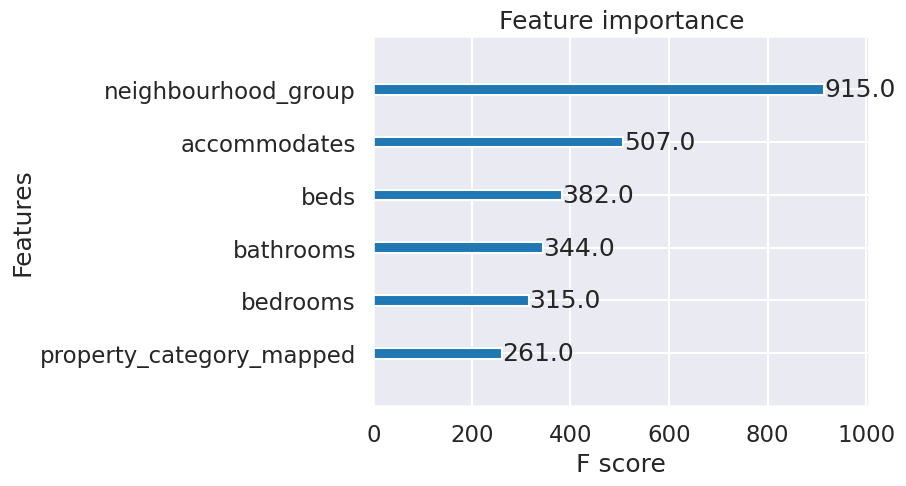

In [ ]:
xgb.plot_importance(xgbr)
plt.show()

In [ ]:
preds = xgbr.predict(x_test)
preds[0:10]

array([ 28.20174, 133.0012 , 107.93801, 192.4831 , 125.60354,  65.02091,
       169.47021, 143.5512 , 260.5221 , 113.61538], dtype=float32)

In [ ]:
len(preds)

2541

In [ ]:
y_test.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparamos las metricas para el set de entrenamiento y el set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
y_pred_train = xgbr.predict(x_train)
mse_train = mean_squared_error(y_train, y_pred_train)
print("MSE: %.2f" % mse_train)

rmse_train = np.sqrt(mse_train)
print("RMSE: %.2f" % rmse_train)

r2_train = r2_score(y_train, y_pred_train)
print("R2: %.2f" % r2_train)

MSE: 1894.76
RMSE: 43.53
R2: 0.63


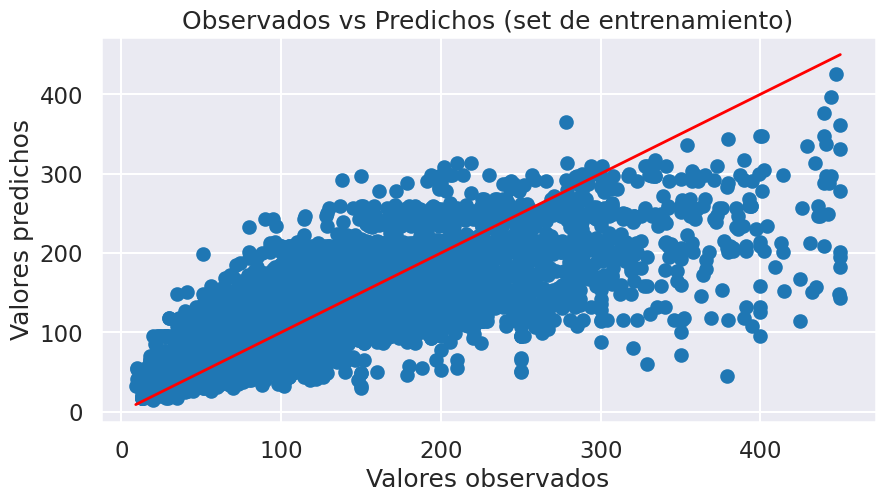

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train, y_pred_train)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
# #Veo los errores para los valores observados y los predichos para el set de test
mse_test = mean_squared_error(y_test, preds)
print("MSE: %.2f" % mse_test)

rmse_test =np.sqrt(mse_test)
print("RMSE: %.2f" % rmse_test)

r2_test = r2_score(y_test, preds)
print("R2: %.2f" % r2_test)

MSE: 2126.83
RMSE: 46.12
R2: 0.60


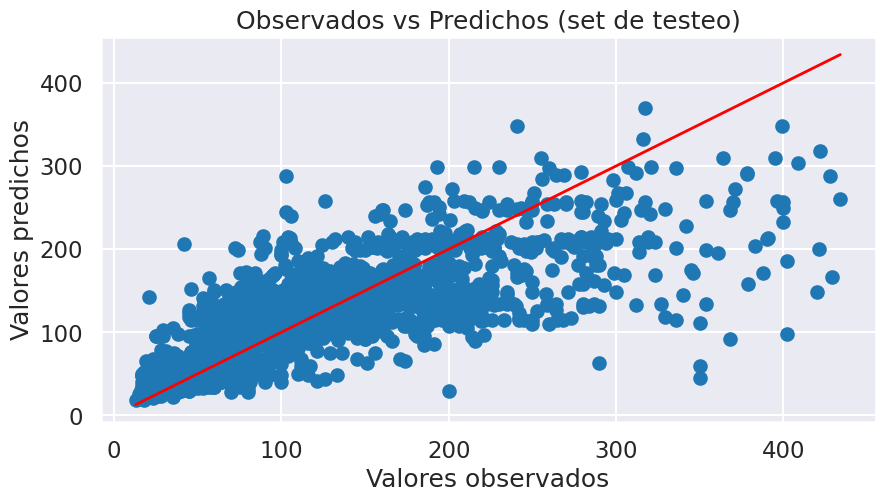

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, preds)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test)

Para el set de entrenamiento: 
RMSE: 43.53
Para el set de testeo: 
RMSE: 46.12


Podemos observar que tanto para el set de entrenamiento como para el set de testeo, la raiz del error cuadratico medio son similares entre si, ninguna varia demasiado de la otra.

######Modelo XGB 2: Variables del tipo review_scores_

Tomo las variables del tipo number_of_reviews_, siendo aquellas con menor correlacion con Price

In [ ]:
df_tipo_review_scores = df_para_xgboost[['price', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']].copy()
df_tipo_review_scores.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   price                        12701 non-null  float64
 1   review_scores_rating         12701 non-null  float64
 2   review_scores_accuracy       12701 non-null  float64
 3   review_scores_cleanliness    12701 non-null  float64
 4   review_scores_checkin        12701 non-null  float64
 5   review_scores_communication  12701 non-null  float64
 6   review_scores_location       12701 non-null  float64
 7   review_scores_value          12701 non-null  float64
dtypes: float64(8)
memory usage: 893.0 KB


In [ ]:
df_tipo_review_scores.head()

,price,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,150.0,4.64,4.71,4.36,4.64,4.79,4.93,4.64
1,137.0,4.58,4.61,4.55,4.65,4.68,4.81,4.35
2,244.0,4.78,4.75,4.73,4.51,4.66,4.94,4.67
4,69.0,3.73,4.00,3.64,4.09,4.09,4.45,3.55
6,32.0,4.52,4.48,4.41,4.74,4.81,4.63,4.41


In [ ]:
df_variables_x_2 = df_tipo_review_scores.drop(['price'], axis='columns', inplace=False)
df_to_predict_y_2 = df_tipo_review_scores['price'].copy()

x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(df_variables_x_2, df_to_predict_y_2, test_size=0.2, random_state=2)


In [ ]:
x_train_2.head(2)

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
14490,5.0,5.00,5.0,5.00,5.0,5.0,5.0
14783,4.8,4.85,4.8,4.95,4.9,5.0,4.8


In [ ]:
y_train_2.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_2.head(2)

,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
4895,4.95,4.95,4.90,4.95,5.00,4.76,4.95
16061,3.67,3.33,3.67,3.67,3.67,3.00,3.33


In [ ]:
y_test_2.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_2 = {
    'objective': ['reg:squarederror'],
    'max_depth': [4, 5, 6, 8, 9],
    'learning_rate': [0.1, 0.3, 0.5],
    'n_estimators': [10, 50, 100],
    'lambda': [0, 1, 5, 10, 20],
    'gamma': [50, 100, 150, 200]
}
folds = 5

first_model_2 = xgb.XGBRegressor()

#Con RandomizedSearchCV
hyperparam_cv_2 = RandomizedSearchCV(estimator=first_model_2, param_distributions=parameters_2, cv=folds, random_state=2)
hyperparam_cv_2.fit(x_train_2, y_train_2)
for i in range(6, 10):
  prueba_2 = RandomizedSearchCV(estimator=first_model_2, param_distributions=parameters_2, cv=i, random_state=2)
  prueba_2.fit(x_train_2, y_train_2)
  if prueba_2.best_score_ > hyperparam_cv_2.best_score_:
    hyperparam_cv_2 = prueba_2
    folds = i

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
best_parameters_2 = hyperparam_cv_2.best_params_
print("Best parameters: ")
print(best_parameters_2)
print("\nBest score: ")
print(hyperparam_cv_2.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'objective': 'reg:squarederror', 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1, 'lambda': 1, 'gamma': 100}

Best score: 
0.11184991899012064

Number of folds for the best score: 
8


In [ ]:
xgbr_2 = xgb.XGBRegressor(objective =best_parameters_2['objective'], learning_rate = best_parameters_2['learning_rate'],
                  max_depth = best_parameters_2['max_depth'], alpha = 10, n_estimators = best_parameters_2['n_estimators'], gamma = best_parameters_2['gamma'], reg_lambda = best_parameters_2['lambda'])
xgbr_2.fit(x_train_2,y_train_2)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=100, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, ...)

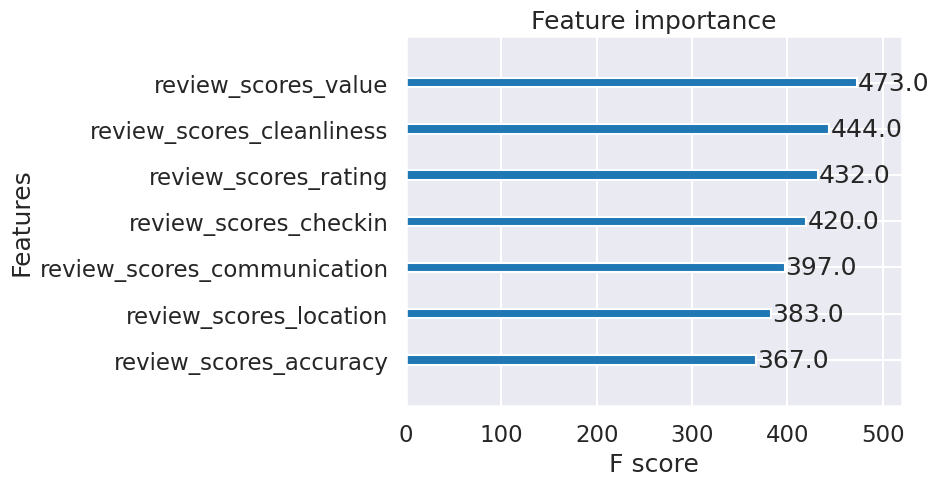

In [ ]:
xgb.plot_importance(xgbr_2)
plt.show()

In [ ]:
preds_2 = xgbr_2.predict(x_test_2)
preds_2[0:10]

array([ 54.515087,  79.95731 , 159.72293 , 109.210464, 105.21159 ,
        93.566696, 110.33418 , 139.31535 , 167.16068 ,  96.91918 ],
      dtype=float32)

In [ ]:
len(preds_2)

2541

In [ ]:
y_test_2.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparacion de metricas entre el set de entrenamiento y el set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
y_pred_train_2 = xgbr_2.predict(x_train_2)
mse_train_2 = mean_squared_error(y_train_2, y_pred_train_2)
print("MSE: %.2f" % mse_train_2)

rmse_train_2 = np.sqrt(mse_train_2)
print("RMSE: %.2f" % rmse_train_2)

r2_train_2 = r2_score(y_train_2, y_pred_train_2)
print("R2: %.2f" % r2_train_2)

MSE: 3667.49
RMSE: 60.56
R2: 0.28


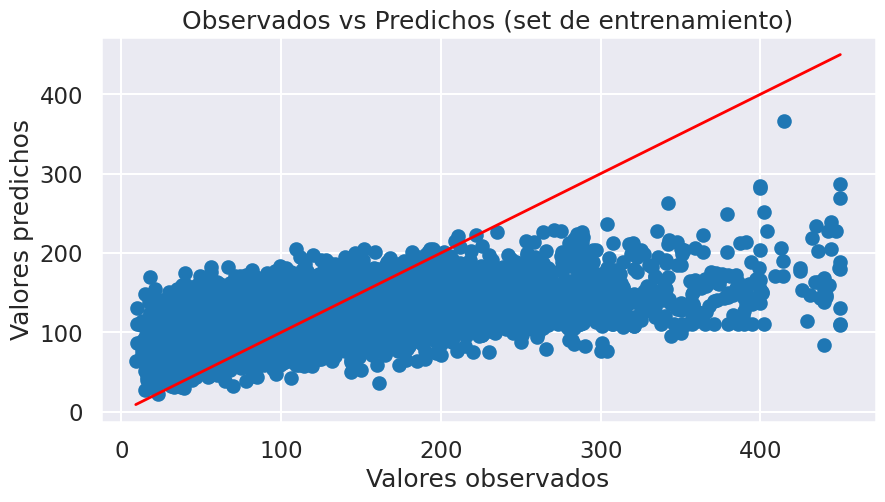

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_2, y_pred_train_2)
plt.plot([y_train_2.min(), y_train_2.max()], [y_train_2.min(), y_train_2.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
#Veo los errores para los valores observados y los predichos para el set de test
mse_test_2 = mean_squared_error(y_test_2, preds_2)
print("MSE: %.2f" % mse_test_2)

rmse_test_2 = np.sqrt(mse_test_2)
print("RMSE: %.2f" % rmse_test_2)

r2_test_2 = r2_score(y_test_2, preds_2)
print("R2: %.2f" % r2_test_2)

MSE: 4882.10
RMSE: 69.87
R2: 0.08


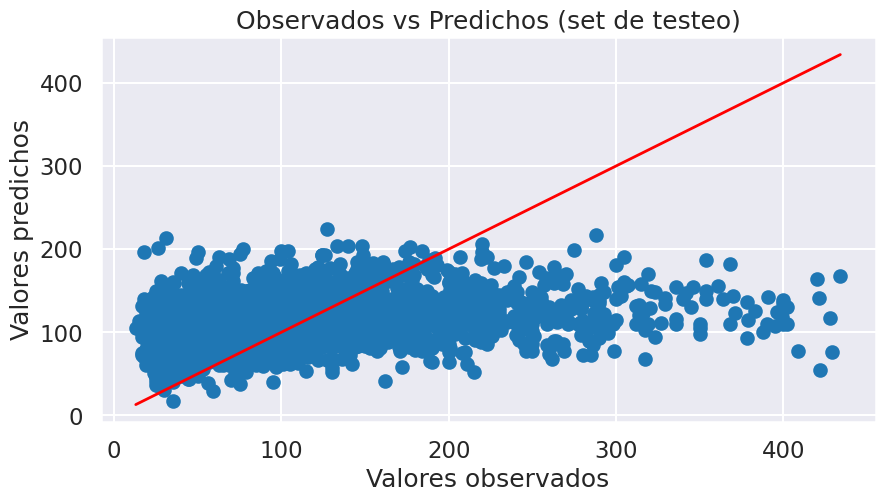

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_2, preds_2)
plt.plot([y_test_2.min(), y_test_2.max()], [y_test_2.min(), y_test_2.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_2)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_2)

Para el set de entrenamiento: 
RMSE: 60.56
Para el set de testeo: 
RMSE: 69.87


Para el set de entrenamiento se obtuvo un error de 60.56 y para el set de testeo, 69.97. Hay una gran diferencia, por lo que este modelo no es tan confiable a la hora de predecir correctamente

######Modelo XGB 3: Variables del tipo number_of_reviews_

Tomo las variables del tipo number_of_reviews_

In [ ]:
df_tipo_number_of_reviews = df_para_xgboost[['price', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d']].copy()
df_tipo_number_of_reviews.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   price                   12701 non-null  float64
 1   number_of_reviews       12701 non-null  int64  
 2   number_of_reviews_ltm   12701 non-null  int64  
 3   number_of_reviews_l30d  12701 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 496.1 KB


In [ ]:
df_tipo_number_of_reviews.head()

,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d
0,150.0,14,11,2
1,137.0,31,31,1
2,244.0,67,33,2
4,69.0,11,10,0
6,32.0,27,11,0


In [ ]:
df_variables_x_3 = df_tipo_number_of_reviews.drop(['price'], axis='columns', inplace=False)
df_to_predict_y_3 = df_tipo_number_of_reviews['price'].copy()

x_train_3, x_test_3, y_train_3, y_test_3 = train_test_split(df_variables_x_3, df_to_predict_y_3, test_size=0.2, random_state=2)


In [ ]:
x_train_3.head(2)

,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d
14490,1,1,1
14783,20,20,0


In [ ]:
y_train_3.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_3.head(2)

,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d
4895,21,6,0
16061,3,2,0


In [ ]:
y_test_3.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_3 = {
    'objective': ['reg:squarederror'],
    'max_depth': [4, 5, 6, 8, 9],
    'learning_rate': [0.1, 0.3, 0.5],
    'n_estimators': [10, 50, 100],
    'lambda': [0, 1, 5, 10, 20],
    'gamma': [50, 100, 150, 200]
}
folds = 5

first_model_3 = xgb.XGBRegressor()

#Con RandomizedSearchCV
hyperparam_cv_3 = RandomizedSearchCV(estimator=first_model_3, param_distributions=parameters_3, cv=folds, random_state=2)
hyperparam_cv_3.fit(x_train_3, y_train_3)
for i in range(6, 10):
  prueba_3 = RandomizedSearchCV(estimator=first_model_3, param_distributions=parameters_3, cv=i, random_state=2)
  prueba_3.fit(x_train_3, y_train_3)
  if prueba_3.best_score_ > hyperparam_cv_3.best_score_:
    hyperparam_cv_3 = prueba_3
    folds = i

In [ ]:
best_parameters_3 = hyperparam_cv_3.best_params_
print("Best parameters: ")
print(best_parameters_3)
print("\nBest score: ")
print(hyperparam_cv_3.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'objective': 'reg:squarederror', 'n_estimators': 10, 'max_depth': 8, 'learning_rate': 0.1, 'lambda': 5, 'gamma': 50}

Best score: 
0.011306603755329622

Number of folds for the best score: 
9


In [ ]:
xgbr_3 = xgb.XGBRegressor(objective =best_parameters_3['objective'], learning_rate = best_parameters_3['learning_rate'],
                  max_depth = best_parameters_3['max_depth'], alpha = 10, n_estimators = best_parameters_3['n_estimators'], gamma = best_parameters_3['gamma'], reg_lambda = best_parameters_3['lambda'])
xgbr_3.fit(x_train_3,y_train_3)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=50, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=8, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10, n_jobs=None,
             num_parallel_tree=None, ...)

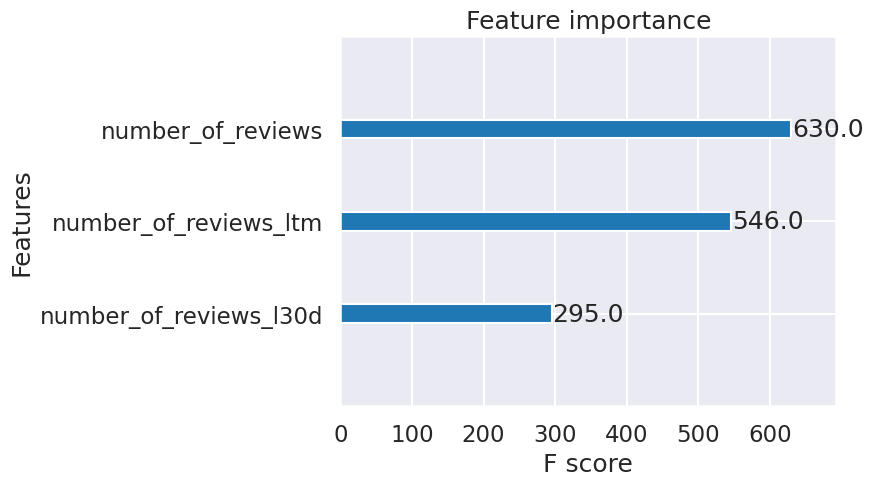

In [ ]:
xgb.plot_importance(xgbr_3)
plt.show()

In [ ]:
preds_3 = xgbr_3.predict(x_test_3)
preds_3[0:10]

array([116.31145 , 115.1697  , 124.5217  , 106.953674, 115.33462 ,
       106.953674, 126.08592 , 112.16263 , 133.18547 , 121.60814 ],
      dtype=float32)

In [ ]:
len(preds_3)

2541

In [ ]:
y_test_3.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparacion entre las metricas para el set de entrenamiento y el set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
y_pred_train_3 = xgbr_3.predict(x_train_3)
mse_train_3 = mean_squared_error(y_train_3, y_pred_train_3)
print("MSE: %.2f" % mse_train_3)

rmse_train_3 = np.sqrt(mse_train_3)
print("RMSE: %.2f" % rmse_train_3)

r2_train_3 = r2_score(y_train_3, y_pred_train_3)
print("R2: %.2f" % r2_train_3)

MSE: 4772.52
RMSE: 69.08
R2: 0.06


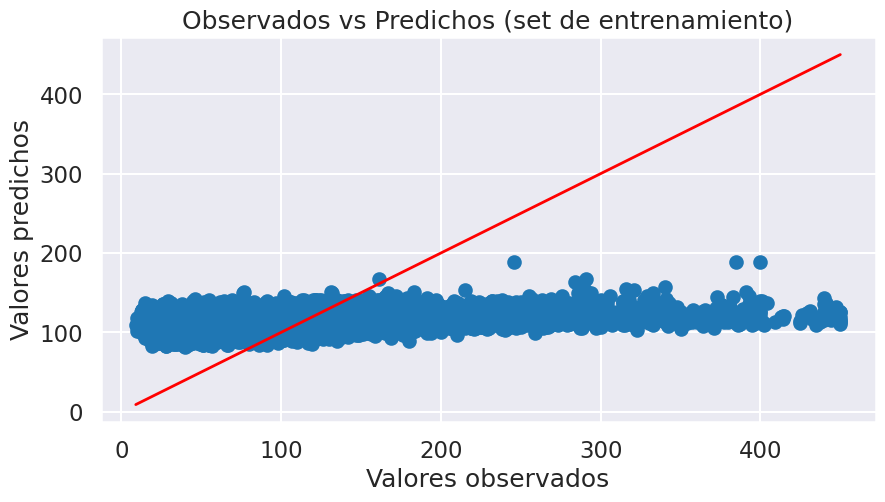

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_3, y_pred_train_3)
plt.plot([y_train_3.min(), y_train_3.max()], [y_train_3.min(), y_train_3.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
#Veo los errores para los valores observados y los predichos para el set de test
mse_test_3 = mean_squared_error(y_test_3, preds_3)
print("MSE: %.2f" % mse_test_3)

rmse_test_3 = np.sqrt(mse_test_3)
print("RMSE: %.2f" % rmse_test_3)

r2_test_3 = r2_score(y_test_3, preds_3)
print("R2: %.2f" % r2_test_3)

MSE: 5236.40
RMSE: 72.36
R2: 0.01


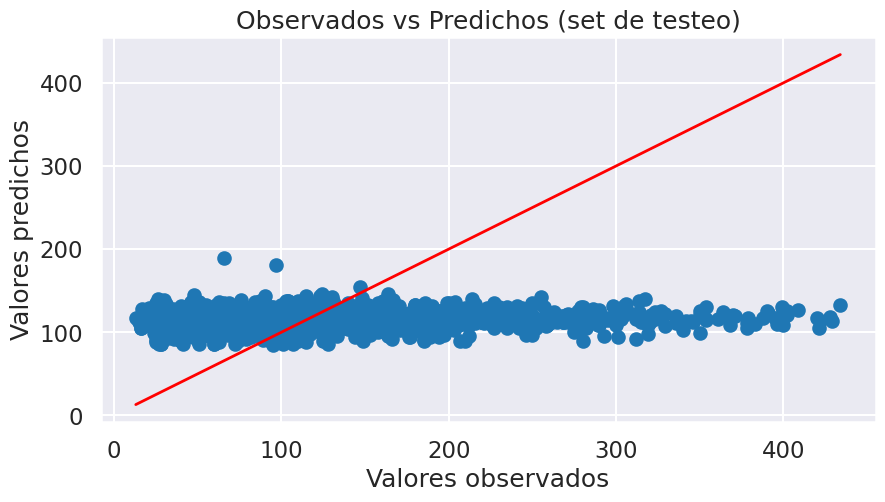

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_3, preds_3)
plt.plot([y_test_3.min(), y_test_3.max()], [y_test_3.min(), y_test_3.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_3)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_3)

Para el set de entrenamiento: 
RMSE: 69.08
Para el set de testeo: 
RMSE: 72.36


Como se puede observar, para ambos set de datos, hay una diferencia de aproximadamente 3 euros para el RMSE. Como no varia tanto para ambos modelos, se puede tener en cuenta este modelo para predecir

######Modelo XGB 4: Variables accommodates, review_scores_rating, neighbourhood_group y property_category_mapped

Tomo un dataframe con las variables accommodates, review_scores_rating, neighbourhood_group y property_category_mapped

In [ ]:
df_mix_variables = df_para_xgboost[['price', 'accommodates', 'review_scores_rating', 'neighbourhood_group', 'property_category_mapped']].copy()
df_mix_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     12701 non-null  float64
 1   accommodates              12701 non-null  float64
 2   review_scores_rating      12701 non-null  float64
 3   neighbourhood_group       12701 non-null  float64
 4   property_category_mapped  12701 non-null  int64  
dtypes: float64(4), int64(1)
memory usage: 595.4 KB


In [ ]:
df_mix_variables.head()

,price,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
0,150.0,4.0,4.64,44.100304,1
1,137.0,4.0,4.58,44.100304,1
2,244.0,6.0,4.78,44.100304,1
4,69.0,4.0,3.73,3.133004,1
6,32.0,1.0,4.52,3.794151,2


In [ ]:
df_variables_x_4 = df_mix_variables.drop(['price'], axis='columns', inplace=False)
df_to_predict_y_4 = df_mix_variables['price'].copy()

x_train_4, x_test_4, y_train_4, y_test_4 = train_test_split(df_variables_x_4, df_to_predict_y_4, test_size=0.2, random_state=2)

In [ ]:
x_train_4.head(2)

,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
14490,2.0,5.0,0.470546,2
14783,6.0,4.8,44.100304,1


In [ ]:
y_train_4.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_4.head(2)

,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
4895,1.0,4.95,2.322950,2
16061,4.0,3.67,3.001966,1


In [ ]:
y_test_4.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_4 = {
    'objective': ['reg:squarederror'],
    'max_depth': [4, 5, 6, 8, 9],
    'learning_rate': [0.1, 0.3, 0.5],
    'n_estimators': [10, 50, 100],
    'lambda': [0, 1, 5, 10, 20],
    'gamma': [50, 100, 150, 200]
}
folds = 5

first_model_4 = xgb.XGBRegressor()

#Con RandomizedSearchCV
hyperparam_cv_4 = RandomizedSearchCV(estimator=first_model_4, param_distributions=parameters_4, cv=folds, random_state=2)
hyperparam_cv_4.fit(x_train_4, y_train_4)

for i in range(6, 10):
  prueba_4 = RandomizedSearchCV(estimator=first_model_4, param_distributions=parameters_4, cv=i, random_state=2)
  prueba_4.fit(x_train_4, y_train_4)
  if prueba_4.best_score_ > hyperparam_cv_4.best_score_:
    hyperparam_cv_4 = prueba_4
    folds = i

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
best_parameters_4 = hyperparam_cv_4.best_params_
print("Best parameters: ")
print(best_parameters_4)
print("\nBest score: ")
print(hyperparam_cv_4.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'objective': 'reg:squarederror', 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1, 'lambda': 1, 'gamma': 100}

Best score: 
0.5287471907038372

Number of folds for the best score: 
9


In [ ]:
xgbr_4 = xgb.XGBRegressor(objective =best_parameters_4['objective'], learning_rate = best_parameters_4['learning_rate'],
                  max_depth = best_parameters_4['max_depth'], alpha = 10, n_estimators = best_parameters_4['n_estimators'], gamma = best_parameters_4['gamma'], reg_lambda = best_parameters_4['lambda'])
xgbr_4.fit(x_train_4,y_train_4)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=100, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, ...)

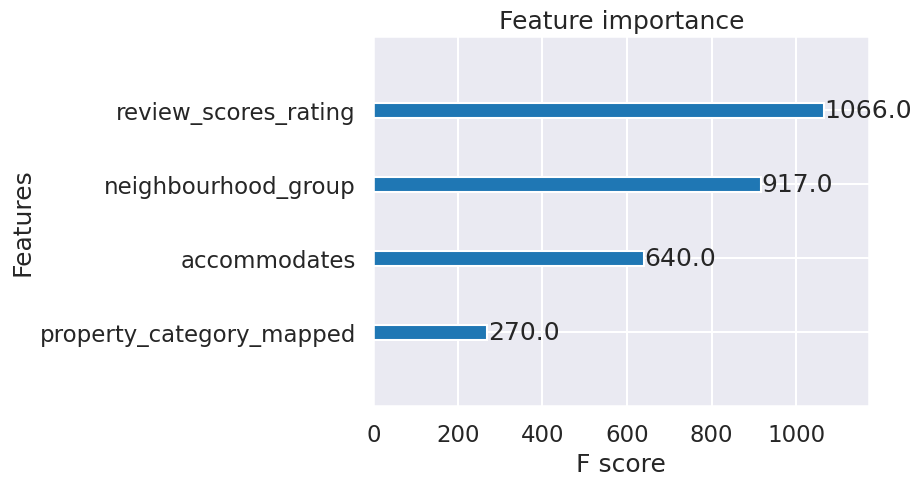

In [ ]:
xgb.plot_importance(xgbr_4)
plt.show()

In [ ]:
preds_4 = xgbr_4.predict(x_test_4)
preds_4[0:10]

array([ 32.87084 , 122.89665 , 112.520966, 161.55943 , 124.66211 ,
        62.287407, 158.75021 , 115.40616 , 259.78357 , 122.12052 ],
      dtype=float32)

In [ ]:
len(preds_4)

2541

In [ ]:
y_test_4.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparamos las metricas para el set de entrenamiento y el set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
y_pred_train_4 = xgbr_4.predict(x_train_4)
mse_train_4 = mean_squared_error(y_train_4, y_pred_train_4)
print("MSE: %.2f" % mse_train_4)

rmse_train_4 = np.sqrt(mse_train_4)
print("RMSE: %.2f" % rmse_train_4)

r2_train_4 = r2_score(y_train_4, y_pred_train_4)
print("R2: %.2f" % r2_train_4)

MSE: 2115.63
RMSE: 46.00
R2: 0.58


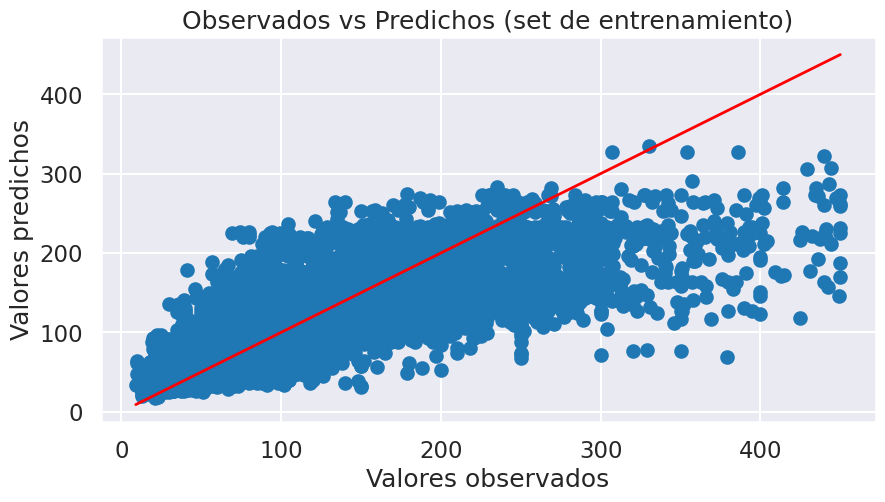

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_4, y_pred_train_4)
plt.plot([y_train_4.min(), y_train_4.max()], [y_train_4.min(), y_train_4.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
# #Veo los errores para los valores observados y los predichos para el set de test
mse_test_4 = mean_squared_error(y_test_4, preds_4)
print("MSE: %.2f" % mse_test_4)

rmse_test_4 = np.sqrt(mse_test_4)
print("RMSE: %.2f" % rmse_test_4)

r2_test_4 = r2_score(y_test_4, preds_4)
print("R2: %.2f" % r2_test_4)

MSE: 2407.22
RMSE: 49.06
R2: 0.55


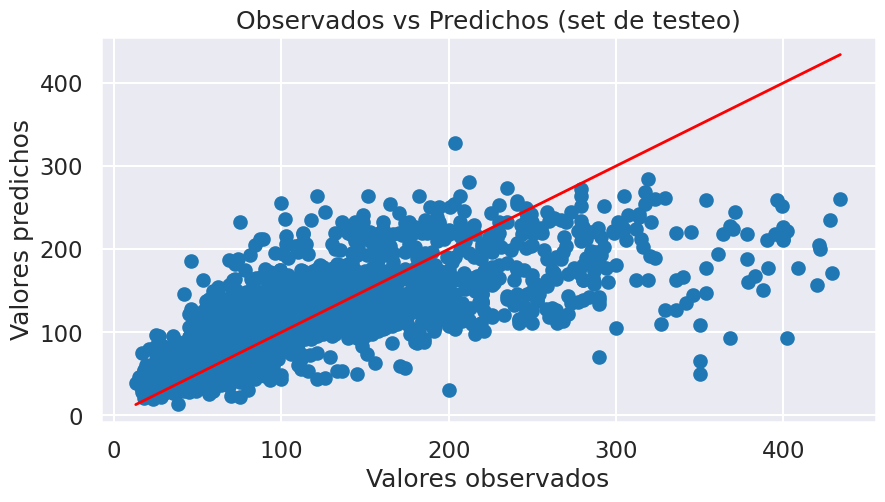

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_4, preds_4)
plt.plot([y_test_4.min(), y_test_4.max()], [y_test_4.min(), y_test_4.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_4)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_4)

Para el set de entrenamiento: 
RMSE: 46.00
Para el set de testeo: 
RMSE: 49.06


Podemos observar que la diferencia para la raiz del error cuadratico medio para el set de entrenamiento y para el set de testeo es de 3.06. Son similares entre si, por lo que este modelo es correcto

######Modelo XGB 5: Todas las variables

In [ ]:
df_todos_los_features = df_para_xgboost.copy()
df_todos_los_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   latitude                     12701 non-null  float64
 1   longitude                    12701 non-null  float64
 2   accommodates                 12701 non-null  float64
 3   bathrooms                    12701 non-null  float64
 4   bedrooms                     12701 non-null  float64
 5   beds                         12701 non-null  float64
 6   price                        12701 non-null  float64
 7   number_of_reviews            12701 non-null  int64  
 8   number_of_reviews_ltm        12701 non-null  int64  
 9   number_of_reviews_l30d       12701 non-null  int64  
 10  review_scores_rating         12701 non-null  float64
 11  review_scores_accuracy       12701 non-null  float64
 12  review_scores_cleanliness    12701 non-null  float64
 13  review_scores_checkin

In [ ]:
df_variables_x_5 = df_todos_los_features.drop(['price'], axis='columns', inplace=False)
df_to_predict_y_5 = df_todos_los_features['price'].copy()

x_train_5, x_test_5, y_train_5, y_test_5 = train_test_split(df_variables_x_5, df_to_predict_y_5, test_size=0.2, random_state=2)


In [ ]:
x_train_5.head(2)

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_group,property_category_mapped,price_estim_accomodates,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,instant_bookable_f,instant_bookable_t
14490,40.374114,-3.627759,2.0,1.0,1.0,1.0,1,1,1,5.0,5.00,5.0,5.00,5.0,5.0,5.0,0.470546,2,83.810846,False,False,True,False,True,False
14783,40.422690,-3.699860,6.0,1.0,2.0,6.0,20,20,0,4.8,4.85,4.8,4.95,4.9,5.0,4.8,44.100304,1,193.517782,True,False,False,False,True,False


In [ ]:
y_train_5.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_5.head(2)

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighbourhood_group,property_category_mapped,price_estim_accomodates,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,instant_bookable_f,instant_bookable_t
4895,40.385330,-3.712090,1.0,2.0,1.0,1.0,21,6,0,4.95,4.95,4.90,4.95,5.00,4.76,4.95,2.322950,2,56.384113,False,False,True,False,True,False
16061,40.463402,-3.669305,4.0,1.0,2.0,2.0,3,2,0,3.67,3.33,3.67,3.67,3.67,3.00,3.33,3.001966,1,138.664314,True,False,False,False,False,True


In [ ]:
y_test_5.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_5 = {
    'objective': ['reg:squarederror'],
    'max_depth': [4, 5, 6, 8, 9],
    'learning_rate': [0.1, 0.3, 0.5],
    'n_estimators': [10, 50, 100],
    'lambda': [0, 1, 5, 10, 20],
    'gamma': [50, 100, 150, 200]
}
folds = 5

first_model_5 = xgb.XGBRegressor()

#Con RandomizedSearchCV
hyperparam_cv_5 = RandomizedSearchCV(estimator=first_model_5, param_distributions=parameters_5, cv=folds, random_state=2)
hyperparam_cv_5.fit(x_train_5, y_train_5)
for i in range(6, 10):
  prueba = RandomizedSearchCV(estimator=first_model_5, param_distributions=parameters_5, cv=i, random_state=2)
  prueba.fit(x_train_5, y_train_5)
  if prueba.best_score_ > hyperparam_cv_5.best_score_:
    hyperparam_cv_5 = prueba
    folds = i

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
best_parameters_5 = hyperparam_cv_5.best_params_
print("Best parameters: ")
print(best_parameters_5)
print("\nBest score: ")
print(hyperparam_cv_5.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'objective': 'reg:squarederror', 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.1, 'lambda': 1, 'gamma': 100}

Best score: 
0.6488578061415063

Number of folds for the best score: 
9


In [ ]:
xgbr_5 = xgb.XGBRegressor(objective =best_parameters_5['objective'], learning_rate = best_parameters_5['learning_rate'],
                  max_depth = best_parameters_5['max_depth'], alpha = 10, n_estimators = best_parameters_5['n_estimators'], gamma = best_parameters_5['gamma'], reg_lambda = best_parameters_5['lambda'])
xgbr_5.fit(x_train_5,y_train_5)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=100, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
preds_5 = xgbr_5.predict(x_test_5)
preds_5[0:10]

array([ 29.744047, 140.52022 , 115.9632  , 177.9065  , 113.546135,
        66.728065, 183.04076 , 149.51605 , 283.6023  , 124.87189 ],
      dtype=float32)

In [ ]:
len(preds_5)

2541

In [ ]:
y_test_5.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparamos las metricas para el set de entrenamiento y el set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
y_pred_train_5 = xgbr_5.predict(x_train_5)
mse_train_5 = mean_squared_error(y_train_5, y_pred_train_5)
print("MSE: %.2f" % mse_train_5)

rmse_train_5 = np.sqrt(mse_train_5)
print("RMSE: %.2f" % rmse_train_5)

r2_train_5 = r2_score(y_train_5, y_pred_train_5)
print("R2: %.2f" % r2_train_5)

MSE: 1253.54
RMSE: 35.41
R2: 0.75


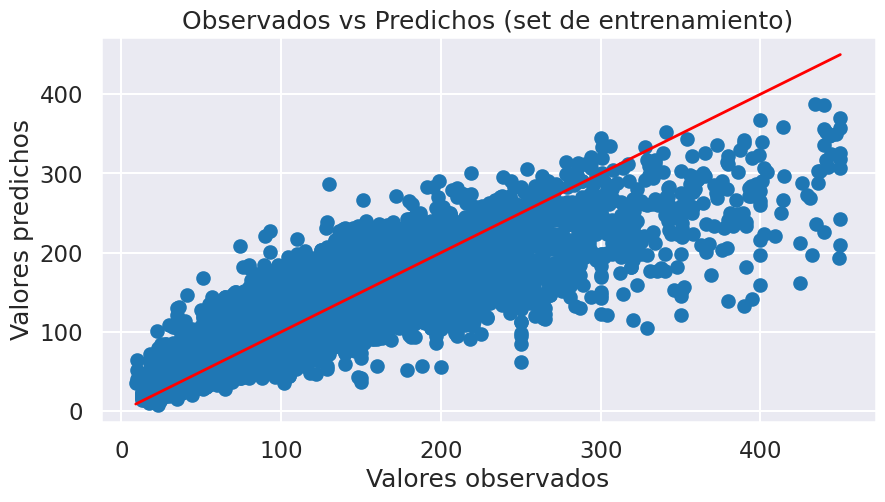

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_5, y_pred_train_5)
plt.plot([y_train_5.min(), y_train_5.max()], [y_train_5.min(), y_train_5.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
# #Veo los errores para los valores observados y los predichos para el set de test
mse_test_5 = mean_squared_error(y_test_5, preds_5)
print("MSE: %.2f" % mse_test_5)

rmse_test_5 = np.sqrt(mse_test_5)
print("RMSE: %.2f" % rmse_test_5)

r2_test_5 = r2_score(y_test_5, preds_5)
print("R2: %.2f" % r2_test_5)

MSE: 1806.71
RMSE: 42.51
R2: 0.66


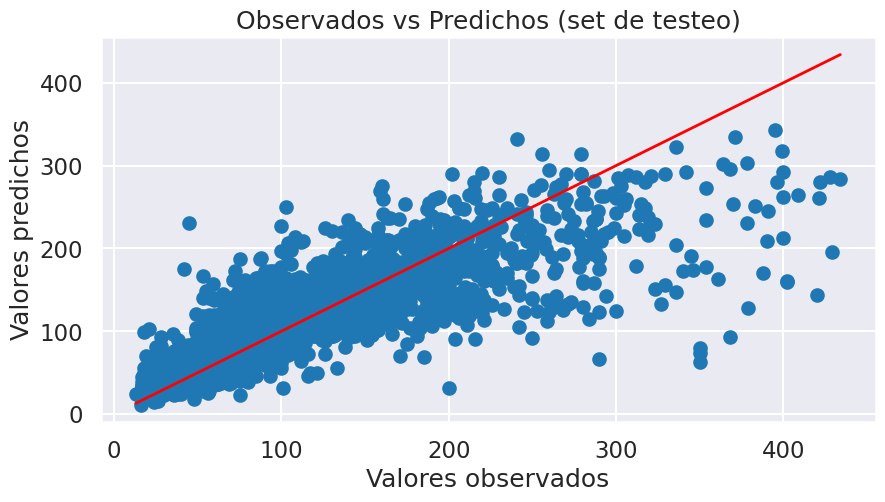

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_5, preds_5)
plt.plot([y_test_5.min(), y_test_5.max()], [y_test_5.min(), y_test_5.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_5)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_5)

Para el set de entrenamiento: 
RMSE: 35.41
Para el set de testeo: 
RMSE: 42.51


Las metricas para el set de entrenamiento y el set de testeo, varian poco pero a diferencia de los demas modelos, varian en mayor cantidad. Para RMSE, varia en 7 aproximadamente y para el R2, varia en 9 euros

######Comparacion de modelos

In [ ]:
print("El MSE del modelo con las variables con mejor correlacion es:")
print("MSE: %.2f" % mse_test)
print("El MSE del modelo con las variables del tipo review_scores_ es:")
print("MSE: %.2f" % mse_test_2)
print("El MSE del modelo con las variables del tipo number_of_reviews_ es:")
print("MSE: %.2f" % mse_test_3)
print("El MSE del modelo con un mix de variables es:")
print("MSE: %.2f" % mse_test_4)
print("El MSE del modelo con todas las variables es:")
print("MSE: %.2f" % mse_test_5)


El MSE del modelo con las variables con mejor correlacion es:
MSE: 2126.83
El MSE del modelo con las variables del tipo review_scores_ es:
MSE: 4882.10
El MSE del modelo con las variables del tipo number_of_reviews_ es:
MSE: 5236.40
El MSE del modelo con un mix de variables es:
MSE: 2407.22
El MSE del modelo con todas las variables es:
MSE: 1806.71


In [ ]:
print("El RMSE del modelo con las variables con mejor correlacion es:")
print("RMSE: %.2f" % rmse_test)
print("El RMSE del modelo con las variables del tipo review_scores_ es:")
print("RMSE: %.2f" % rmse_test_2)
print("El RMSE del modelo con las variables del tipo number_of_reviews_ es:")
print("RMSE: %.2f" % rmse_test_3)
print("El RMSE del modelo con un mix de variables es:")
print("RMSE: %.2f" % rmse_test_4)
print("El RMSE del modelo con todas las variables es:")
print("RMSE: %.2f" % rmse_test_5)

El RMSE del modelo con las variables con mejor correlacion es:
RMSE: 46.12
El RMSE del modelo con las variables del tipo review_scores_ es:
RMSE: 69.87
El RMSE del modelo con las variables del tipo number_of_reviews_ es:
RMSE: 72.36
El RMSE del modelo con un mix de variables es:
RMSE: 49.06
El RMSE del modelo con todas las variables es:
RMSE: 42.51


In [ ]:
print("El R2 del modelo con las variables con mejor correlacion es:")
print("R2: %.2f" % r2_test)
print("El R2 del modelo con las variables del tipo review_scores_ es:")
print("R2: %.2f" % r2_test_2)
print("El R2 del modelo con las variables del tipo number_of_reviews_ es:")
print("R2: %.2f" % r2_test_3)
print("El R2 del modelo con un mix de variables es:")
print("R2: %.2f" % r2_test_4)
print("El R2 del modelo con todas las variables es:")
print("R2: %.2f" % r2_test_5)

El R2 del modelo con las variables con mejor correlacion es:
R2: 0.60
El R2 del modelo con las variables del tipo review_scores_ es:
R2: 0.08
El R2 del modelo con las variables del tipo number_of_reviews_ es:
R2: 0.01
El R2 del modelo con un mix de variables es:
R2: 0.55
El R2 del modelo con todas las variables es:
R2: 0.66


Como podemos observar, el modelo con las variables con mejor correlacion y el modelo con todas las variables tienen las mejores metricas.

Sin embargo, para el modelo con todas las variables, las metricas para el set de entrenamiento y para el set de testeo varian mucho en comparacion a la variacion de las mismas metricas en el primer modelo.

Para las metricas MSE y RMSE, para el primer modelo, se obtuvo 2126.83 y 46.12 respectivamente, que representa que la prediccion tiene un error medio de 46.12 euros de error en el Price. Para los siguientes dos modelos, el MSE casi que duplica al del primer modelo y para el RMSE supera por 20/30 el error para la variable Price.
Para el modelo con un mix de variables, el MSE y el RMSE se le acercan al del primer modelo pero siguen siendo superiores.
Para el ultimo modelo, como ya se dijo, son valores mas bajos pero la variacion entre el set de entrenamiento y el set de testeo es mucho mayor.  

En relacion a la metrica R2, el primer modelo explica un 60% de la variabilidad del problema. Y en los siguientes dos datasets, no superan el 10% de la variablidad. Para el modelo con un mix de variables, se acerca (0.55) pero sigue siendo menor. Para el modelo con todas las variables, el R2 es mucho mejor con 66%

Para los primeros cuatro modelos no hay overfitting ya que el RMSE no es cercano a cero ni tampoco tiene una gran variabilidad con respecto al RMSE de los sets de testeo. El ultimo modelo, no tiene overfitting pero esta mas entrenado para el set de entrenamiento que para el set de testeo.

Para nosotros, el mejor modelo de XGBoost es el primer modelo ya que nos parece que predice mejor que los demas, a pesar de seguir teniendo altos valores de MSE y RMSE.

Guardamos el Modelo XGB 1

In [ ]:
with open('modelo_xgb_1.pkl', 'wb') as f:
  pickle.dump(xgbr, f)

### Tercer modelo: Random Forest (Cross Validation)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV

df_para_rf = df.drop(['custom_id', 'property_type', 'listing_url', 'host_since', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_group_cleansed', 'first_review', 'last_review', 'concatenated_categorical', 'property_category'], axis='columns', inplace=False)
df_para_rf[['accommodates', 'bathrooms', 'bedrooms', 'beds']] = df_para_rf[['accommodates', 'bathrooms', 'bedrooms', 'beds']].astype(float)
df_para_rf = pd.get_dummies(df_para_rf, columns=['room_type', 'instant_bookable'])

######Modelo RF 1: Variables con mejor correlacion con respectos a Price

Primero tomo un dataframe con las variables que mejor correlacion tienen con Price

In [ ]:
df_rf_1 = df_para_rf[['price', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'neighbourhood_group', 'property_category_mapped']].copy()
df_rf_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     12701 non-null  float64
 1   accommodates              12701 non-null  float64
 2   bathrooms                 12701 non-null  float64
 3   bedrooms                  12701 non-null  float64
 4   beds                      12701 non-null  float64
 5   neighbourhood_group       12701 non-null  float64
 6   property_category_mapped  12701 non-null  int64  
dtypes: float64(6), int64(1)
memory usage: 793.8 KB


In [ ]:
df_rf_1.head()

,price,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
0,150.0,4.0,1.0,2.0,2.0,44.100304,1
1,137.0,4.0,1.0,0.0,1.0,44.100304,1
2,244.0,6.0,2.0,2.0,3.0,44.100304,1
4,69.0,4.0,1.0,1.0,1.0,3.133004,1
6,32.0,1.0,1.0,1.0,1.0,3.794151,2


In [ ]:
var_x = df_rf_1.drop(['price'], axis='columns', inplace=False)
var_to_predict_y = df_rf_1['price'].copy()

x_train_rf, x_test_rf, y_train_rf, y_test_rf = train_test_split(var_x, var_to_predict_y, test_size=0.2, random_state=2)

In [ ]:
x_train_rf.head(2)

,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
14490,2.0,1.0,1.0,1.0,0.470546,2
14783,6.0,1.0,2.0,6.0,44.100304,1


In [ ]:
y_train_rf.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_rf.head(2)

,accommodates,bathrooms,bedrooms,beds,neighbourhood_group,property_category_mapped
4895,1.0,2.0,1.0,1.0,2.322950,2
16061,4.0,1.0,2.0,2.0,3.001966,1


In [ ]:
y_test_rf.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_rf = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [6, 8, 10, 12],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
folds = 5

model_rf = RandomForestRegressor()

#Con RandomizedSearchCV
hyperparam_cv_rf = RandomizedSearchCV(estimator=model_rf, param_distributions=parameters_rf, cv=folds, random_state=2)
hyperparam_cv_rf.fit(x_train_rf, y_train_rf)
for i in range(6, 10):
  prueba_rf = RandomizedSearchCV(estimator=model_rf, param_distributions=parameters_rf, cv=i, random_state=2)
  prueba_rf.fit(x_train_rf, y_train_rf)
  if prueba_rf.best_score_ > hyperparam_cv_rf.best_score_:
    hyperparam_cv_rf = prueba_rf
    folds = i

In [ ]:
best_parameters_rf = hyperparam_cv_rf.best_params_
print("Best parameters: ")
print(best_parameters_rf)
print("\nBest score: ")
print(hyperparam_cv_rf.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 10}

Best score: 
0.5778726037354353

Number of folds for the best score: 
7


In [ ]:
random_forest = RandomForestRegressor(n_estimators=best_parameters_rf['n_estimators'], max_depth=best_parameters_rf['max_depth'], min_samples_split=best_parameters_rf['min_samples_split'], min_samples_leaf=best_parameters_rf['min_samples_leaf'])
random_forest.fit(x_train_rf, y_train_rf)

RandomForestRegressor(max_depth=10, min_samples_leaf=4, min_samples_split=5,
                      n_estimators=50)

In [ ]:
preds_rf = random_forest.predict(x_test_rf)
preds_rf[0:10]

array([ 26.82087101, 124.84539801, 108.28501358, 149.98743496,
       113.95112737,  64.55124444, 170.41653539, 153.93659331,
       254.15180867, 111.08925507])

In [ ]:
len(preds_rf)

2541

In [ ]:
y_test_rf.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparacion de metricas para set de entrenamiento y set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
pred_train_rf = random_forest.predict(x_train_rf)
mse_train_rf = mean_squared_error(y_train_rf, pred_train_rf)
print("MSE: %.2f" % mse_train_rf)

rmse_train_rf = np.sqrt(mse_train_rf)
print("RMSE: %.2f" % rmse_train_rf)

r2_train_rf = r2_score(y_train_rf, pred_train_rf)
print("R2: %.2f" % r2_train_rf)

MSE: 1895.49
RMSE: 43.54
R2: 0.63


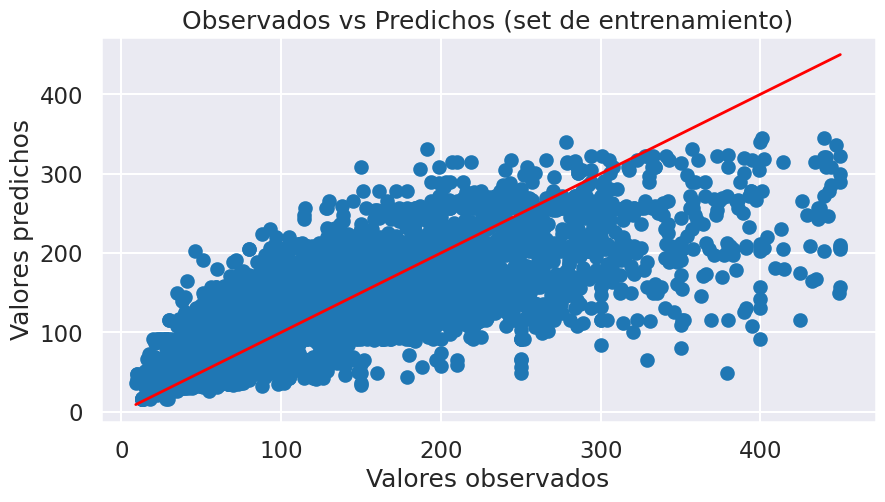

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_rf, pred_train_rf)
plt.plot([y_train_rf.min(), y_train_rf.max()], [y_train_rf.min(), y_train_rf.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
#Veo los errores para los valores observados y los predichos para el set de test
mse_test_rf = mean_squared_error(y_test_rf, preds_rf)
print("MSE: %.2f" % mse_test_rf)

rmse_test_rf = np.sqrt(mse_test_rf)
print("RMSE: %.2f" % rmse_test_rf)

r2_test_rf = r2_score(y_test_rf, preds_rf)
print("R2: %.2f" % r2_test_rf)

MSE: 2118.94
RMSE: 46.03
R2: 0.60


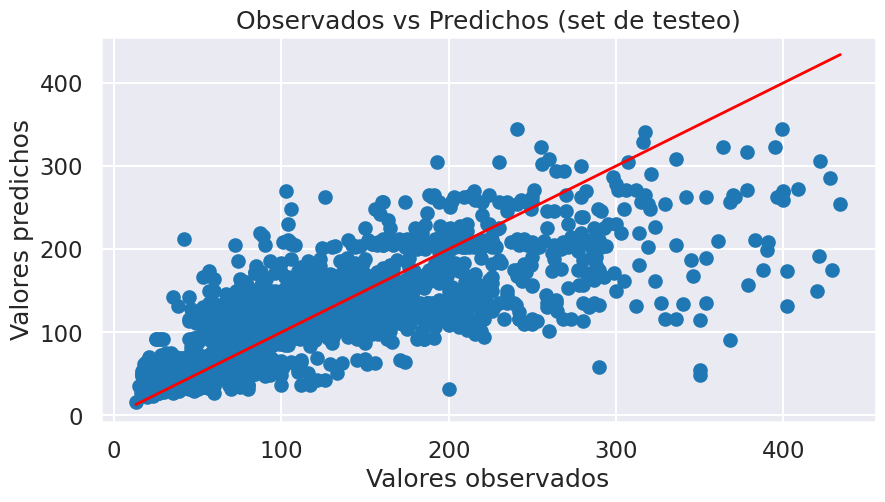

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_rf, preds_rf)
plt.plot([y_test_rf.min(), y_test_rf.max()], [y_test_rf.min(), y_test_rf.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_rf)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_rf)

Para el set de entrenamiento: 
RMSE: 43.54
Para el set de testeo: 
RMSE: 46.03


Para ambos set de datos, la diferencia entre sus RMSE es baja por lo que este modelo predice de forma aceptable.

######Modelo RF 2: Variables accommodates, bathrooms, bedrooms, beds y property_category_mapped

Tomo unicamente las variables accommodates, bathrooms, bedrooms, beds y property_category_mapped

In [ ]:
df_rf_2 = df_para_rf[['price', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'property_category_mapped']].copy()
df_rf_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     12701 non-null  float64
 1   accommodates              12701 non-null  float64
 2   bathrooms                 12701 non-null  float64
 3   bedrooms                  12701 non-null  float64
 4   beds                      12701 non-null  float64
 5   property_category_mapped  12701 non-null  int64  
dtypes: float64(5), int64(1)
memory usage: 694.6 KB


In [ ]:
df_rf_2.head()

,price,accommodates,bathrooms,bedrooms,beds,property_category_mapped
0,150.0,4.0,1.0,2.0,2.0,1
1,137.0,4.0,1.0,0.0,1.0,1
2,244.0,6.0,2.0,2.0,3.0,1
4,69.0,4.0,1.0,1.0,1.0,1
6,32.0,1.0,1.0,1.0,1.0,2


In [ ]:
var_x_2 = df_rf_2.drop(['price'], axis='columns', inplace=False)
var_to_predict_y_2 = df_rf_2['price'].copy()

x_train_rf_2, x_test_rf_2, y_train_rf_2, y_test_rf_2 = train_test_split(var_x_2, var_to_predict_y_2, test_size=0.2, random_state=2)

In [ ]:
x_train_rf_2.head(2)

,accommodates,bathrooms,bedrooms,beds,property_category_mapped
14490,2.0,1.0,1.0,1.0,2
14783,6.0,1.0,2.0,6.0,1


In [ ]:
y_train_rf_2.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_rf_2.head(2)

,accommodates,bathrooms,bedrooms,beds,property_category_mapped
4895,1.0,2.0,1.0,1.0,2
16061,4.0,1.0,2.0,2.0,1


In [ ]:
y_test_rf_2.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_rf_2 = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [6, 8, 10, 12],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
folds = 5

model_rf_2 = RandomForestRegressor()

#Con RandomizedSearchCV
hyperparam_cv_rf_2 = RandomizedSearchCV(estimator=model_rf_2, param_distributions=parameters_rf_2, cv=folds, random_state=2)
hyperparam_cv_rf_2.fit(x_train_rf_2, y_train_rf_2)
for i in range(6, 10):
  prueba_rf_2 = RandomizedSearchCV(estimator=model_rf_2, param_distributions=parameters_rf_2, cv=i, random_state=2)
  prueba_rf_2.fit(x_train_rf_2, y_train_rf_2)
  if prueba_rf_2.best_score_ > hyperparam_cv_rf_2.best_score_:
    hyperparam_cv_rf_2 = prueba_rf_2
    folds = i

In [ ]:
best_parameters_rf_2 = hyperparam_cv_rf_2.best_params_
print("Best parameters: ")
print(best_parameters_rf_2)
print("\nBest score: ")
print(hyperparam_cv_rf_2.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 6}

Best score: 
0.5332232543029576

Number of folds for the best score: 
9


In [ ]:
random_forest_2 = RandomForestRegressor(n_estimators=best_parameters_rf_2['n_estimators'], max_depth=best_parameters_rf_2['max_depth'], min_samples_split=best_parameters_rf_2['min_samples_split'], min_samples_leaf=best_parameters_rf_2['min_samples_leaf'])
random_forest_2.fit(x_train_rf_2, y_train_rf_2)

RandomForestRegressor(max_depth=6, min_samples_leaf=4, min_samples_split=10,
                      n_estimators=200)

In [ ]:
preds_rf_2 = random_forest_2.predict(x_test_rf_2)
preds_rf_2[0:10]

array([ 30.81104932, 140.65485387, 102.43929587, 139.12177135,
       113.69572272,  55.20337022, 161.12575955, 145.72300591,
       227.51173739, 108.0329972 ])

In [ ]:
len(preds_rf_2)

2541

In [ ]:
y_test_rf_2.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparacion entre el set de testeo y el set de entrenamiento

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
pred_train_rf_2 = random_forest_2.predict(x_train_rf_2)
mse_train_rf_2 = mean_squared_error(y_train_rf_2, pred_train_rf_2)
print("MSE: %.2f" % mse_train_rf_2)

rmse_train_rf_2 = np.sqrt(mse_train_rf_2)
print("RMSE: %.2f" % rmse_train_rf_2)

r2_train_rf_2 = r2_score(y_train_rf_2, pred_train_rf_2)
print("R2: %.2f" % r2_train_rf_2)

MSE: 2290.88
RMSE: 47.86
R2: 0.55


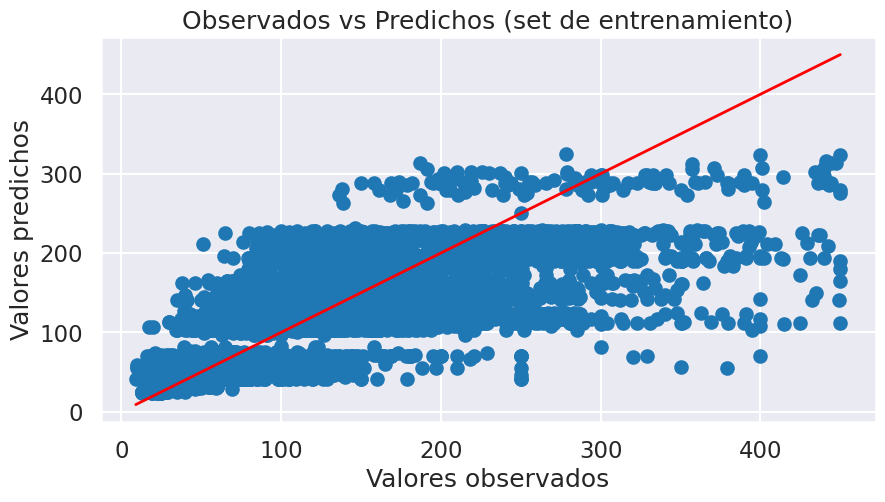

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_rf_2, pred_train_rf_2)
plt.plot([y_train_rf_2.min(), y_train_rf_2.max()], [y_train_rf_2.min(), y_train_rf_2.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
#Veo los errores para los valores observados y los predichos para el set de test
mse_test_rf_2 = mean_squared_error(y_test_rf_2, preds_rf_2)
print("MSE: %.2f" % mse_test_rf_2)

rmse_test_rf_2 = np.sqrt(mse_test_rf_2)
print("RMSE: %.2f" % rmse_test_rf_2)

r2_test_rf_2 = r2_score(y_test_rf_2, preds_rf_2)
print("R2: %.2f" % r2_test_rf_2)

MSE: 2344.53
RMSE: 48.42
R2: 0.56


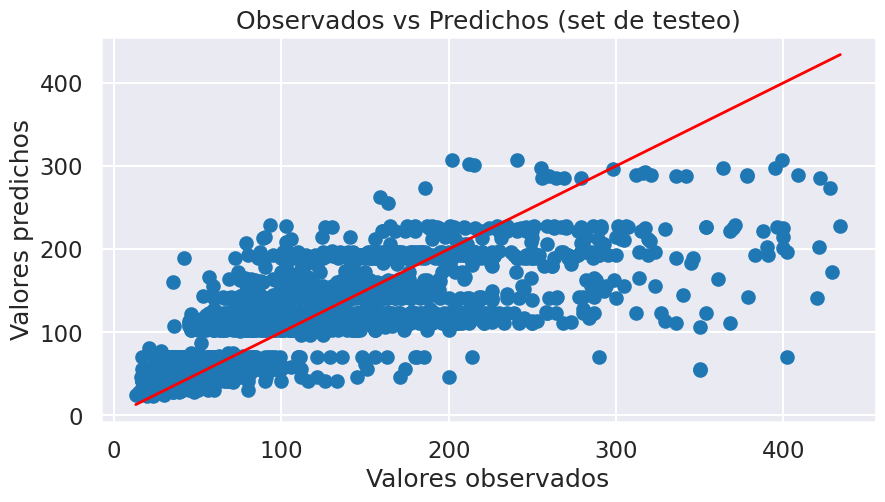

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_rf_2, preds_rf_2)
plt.plot([y_test_rf_2.min(), y_test_rf_2.max()], [y_test_rf_2.min(), y_test_rf_2.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_rf_2)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_rf_2)

Para el set de entrenamiento: 
RMSE: 47.86
Para el set de testeo: 
RMSE: 48.42


Para el set de entrenamiento, el RMSE es 47.88 y para el set de testeo es 48.43. La diferencia entre ambos es de 0.55, un valor muy chico, por lo que el modelo predice de forma correcta.

######Modelo RF 3: Mix de variables

Tomo un dataframe con las variables accommodates, review_scores_rating, neighbourhood_group y property_category_mapped

In [ ]:
df_rf_3 = df_para_rf[['price', 'accommodates', 'review_scores_rating', 'neighbourhood_group', 'property_category_mapped']].copy()
df_rf_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12701 entries, 0 to 19901
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     12701 non-null  float64
 1   accommodates              12701 non-null  float64
 2   review_scores_rating      12701 non-null  float64
 3   neighbourhood_group       12701 non-null  float64
 4   property_category_mapped  12701 non-null  int64  
dtypes: float64(4), int64(1)
memory usage: 595.4 KB


In [ ]:
df_rf_3.head()

,price,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
0,150.0,4.0,4.64,44.100304,1
1,137.0,4.0,4.58,44.100304,1
2,244.0,6.0,4.78,44.100304,1
4,69.0,4.0,3.73,3.133004,1
6,32.0,1.0,4.52,3.794151,2


In [ ]:
var_x_3 = df_rf_3.drop(['price'], axis='columns', inplace=False)
var_to_predict_y_3 = df_rf_3['price'].copy()

x_train_rf_3, x_test_rf_3, y_train_rf_3, y_test_rf_3 = train_test_split(var_x_3, var_to_predict_y_3, test_size=0.2, random_state=2)

In [ ]:
x_train_rf_3.head(2)

,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
14490,2.0,5.0,0.470546,2
14783,6.0,4.8,44.100304,1


In [ ]:
y_train_rf_3.head(2)

,price
14490,35.0
14783,221.0


In [ ]:
x_test_rf_3.head(2)

,accommodates,review_scores_rating,neighbourhood_group,property_category_mapped
4895,1.0,4.95,2.322950,2
16061,4.0,3.67,3.001966,1


In [ ]:
y_test_rf_3.head(2)

,price
4895,35.0
16061,103.0


TRAIN AND TEST

In [ ]:
parameters_rf_3 = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [6, 8, 10, 12],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
folds = 5

model_rf_3 = RandomForestRegressor()

#Con RandomizedSearchCV
hyperparam_cv_rf_3 = RandomizedSearchCV(estimator=model_rf_3, param_distributions=parameters_rf_3, cv=folds, random_state=2)
hyperparam_cv_rf_3.fit(x_train_rf_3, y_train_rf_3)
for i in range(6, 10):
  prueba_rf_3 = RandomizedSearchCV(estimator=model_rf_3, param_distributions=parameters_rf_3, cv=i, random_state=2)
  prueba_rf_3.fit(x_train_rf_3, y_train_rf_3)
  if prueba_rf_3.best_score_ > hyperparam_cv_rf_3.best_score_:
    hyperparam_cv_rf_3 = prueba_rf_3
    folds = i

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
best_parameters_rf_3 = hyperparam_cv_rf_3.best_params_
print("Best parameters: ")
print(best_parameters_rf_3)
print("\nBest score: ")
print(hyperparam_cv_rf_3.best_score_)
print("\nNumber of folds for the best score: ")
print(folds)

Best parameters: 
{'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 8}

Best score: 
0.5195931581389389

Number of folds for the best score: 
7


In [ ]:
random_forest_3 = RandomForestRegressor(n_estimators=best_parameters_rf_3['n_estimators'], max_depth=best_parameters_rf_3['max_depth'], min_samples_split=best_parameters_rf_3['min_samples_split'], min_samples_leaf=best_parameters_rf_3['min_samples_leaf'])
random_forest_3.fit(x_train_rf_3, y_train_rf_3)

RandomForestRegressor(max_depth=8, min_samples_split=5, n_estimators=50)

In [ ]:
preds_rf_3 = random_forest_3.predict(x_test_rf_3)
preds_rf_3[0:10]

array([ 37.72874856, 113.93849319, 113.04618102, 160.49664413,
       121.73807634,  60.97222485, 159.00199815, 114.98816134,
       282.86284463, 117.87287243])

In [ ]:
len(preds_rf_3)

2541

In [ ]:
y_test_rf_3.head(10)

,price
4895,35.0
16061,103.0
6300,147.0
685,100.0
1343,136.0
5222,43.0
10746,166.0
16174,134.0
1434,434.0
8968,104.0


Comparacion de metricas para set de entrenamiento y set de testeo

In [ ]:
#Veo los errores entre los valores observados y predichos para el set de entrenamiento
pred_train_rf_3 = random_forest_3.predict(x_train_rf_3)
mse_train_rf_3 = mean_squared_error(y_train_rf_3, pred_train_rf_3)
print("MSE: %.2f" % mse_train_rf_3)

rmse_train_rf_3 = np.sqrt(mse_train_rf_3)
print("RMSE: %.2f" % rmse_train_rf_3)

r2_train_rf_3 = r2_score(y_train_rf_3, pred_train_rf_3)
print("R2: %.2f" % r2_train_rf_3)

MSE: 2114.86
RMSE: 45.99
R2: 0.58


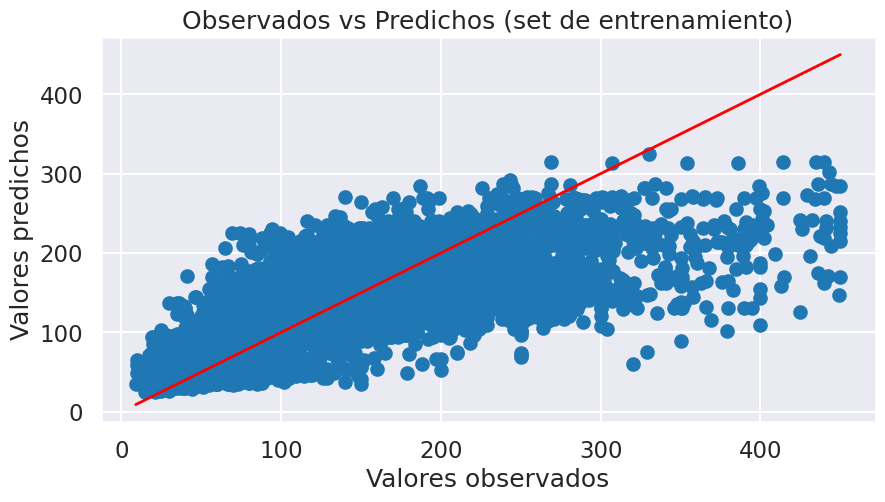

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_train_rf_3, pred_train_rf_3)
plt.plot([y_train_rf_3.min(), y_train_rf_3.max()], [y_train_rf_3.min(), y_train_rf_3.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de entrenamiento)')
plt.show()

In [ ]:
#Veo los errores para los valores observados y los predichos para el set de test
mse_test_rf_3 = mean_squared_error(y_test_rf_3, preds_rf_3)
print("MSE: %.2f" % mse_test_rf_3)

rmse_test_rf_3 = np.sqrt(mse_test_rf_3)
print("RMSE: %.2f" % rmse_test_rf_3)

r2_test_rf_3 = r2_score(y_test_rf_3, preds_rf_3)
print("R2: %.2f" % r2_test_rf_3)

MSE: 2462.63
RMSE: 49.62
R2: 0.53


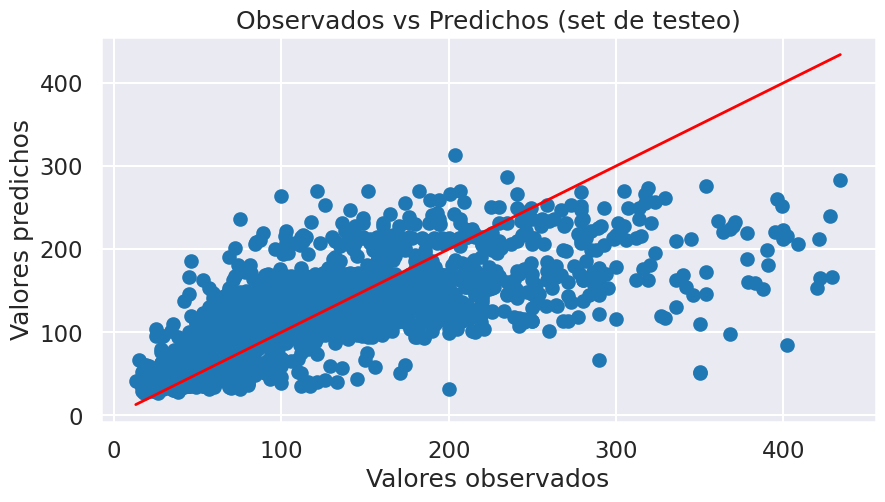

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test_rf_3, preds_rf_3)
plt.plot([y_test_rf_3.min(), y_test_rf_3.max()], [y_test_rf_3.min(), y_test_rf_3.max()], color='red', linewidth=2)
plt.xlabel('Valores observados')
plt.ylabel('Valores predichos')
plt.title('Observados vs Predichos (set de testeo)')
plt.show()

In [ ]:
print("Para el set de entrenamiento: ")
print("RMSE: %.2f" % rmse_train_rf_3)
print("Para el set de testeo: ")
print("RMSE: %.2f" % rmse_test_rf_3)

Para el set de entrenamiento: 
RMSE: 45.99
Para el set de testeo: 
RMSE: 49.62


Para ambos set de datos, la diferencia en el RMSE no es grande, no llega a 4. Podemos decir que este modelo predice correctamente

######Conclusiones

In [ ]:
print("El MSE del modelo con las variables con mejor correlacion es:")
print("MSE: %.2f" % mse_test_rf)
print("El MSE del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:")
print("MSE: %.2f" % mse_test_rf_2)
print("El MSE del modelo con un mix de variables es:")
print("MSE: %.2f" % mse_test_rf_3)

El MSE del modelo con las variables con mejor correlacion es:
MSE: 2118.94
El MSE del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:
MSE: 2344.53
El MSE del modelo con un mix de variables es:
MSE: 2462.63


In [ ]:
print("El RMSE del modelo con las variables con mejor correlacion es:")
print("RMSE: %.2f" % rmse_test_rf)
print("El RMSE del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:")
print("RMSE: %.2f" % rmse_test_rf_2)
print("El RMSE del modelo con un mix de variables es:")
print("RMSE: %.2f" % rmse_test_rf_3)

El RMSE del modelo con las variables con mejor correlacion es:
RMSE: 46.03
El RMSE del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:
RMSE: 48.42
El RMSE del modelo con un mix de variables es:
RMSE: 49.62


In [ ]:
print("El R2 del modelo con las variables con mejor correlacion es:")
print("R2: %.2f" % r2_test_rf)
print("El R2 del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:")
print("R2: %.2f" % r2_test_rf_2)
print("El R2 del modelo con un mix de variables es:")
print("R2: %.2f" % r2_test_rf_3)

El R2 del modelo con las variables con mejor correlacion es:
R2: 0.60
El R2 del modelo con las variables con mejor correlacion menos la variables neighbourhood_group es:
R2: 0.56
El R2 del modelo con un mix de variables es:
R2: 0.53


El modelo con las variables con mejor correlacion tienen las mejores metricas.

Para las metricas MSE y RMSE, para el primer modelo, se obtuvo 2116.52 y 46.01 respectivamente. Por lo que el error medio para la variable Price es 46.01.
A pesar de ser el mejor modelo, tiene alto MSE y RMSE.  

En relacion a la metrica R2, el primer modelo explica en un 60% de la variabilidad del problema y los otros dos 56% y 54% respectivamente

Para todos los modelos, no hay un sobreentrenamiento para el set de train ya que el RMSE no esta en un valor cercano a 0 y para el del set de test tampoco. Ademas, el RMSE del set de testeo, no varia mucho en relacion al del entrenamiento.

Por estas razones, el modelo elegido es el primer modelo.

Nos guardamos el Modelo RF 1

In [ ]:
with open('modelo_rf_1.pkl', 'wb') as f:
  pickle.dump(random_forest, f)

###Ensambles

En este último modelo responderemos la pregunta de si las democracias funcionan. (La sabiduría de las masas). Spoiler: Funciona con el peso de vacas.

####Ensambles Voting

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

X = df[['accommodates', 'bathrooms', 'bedrooms', 'beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

#Modelos base
knn = KNeighborsRegressor(n_neighbors=19)  #aqui agrego el k=19
rf = RandomForestRegressor(n_estimators=best_parameters_rf['n_estimators'], max_depth=best_parameters_rf['max_depth'], min_samples_split=best_parameters_rf['min_samples_split'], min_samples_leaf=best_parameters_rf['min_samples_leaf'])
xgb = XGBRegressor(objective =best_parameters['objective'], learning_rate = best_parameters['learning_rate'],
                  max_depth = best_parameters['max_depth'], alpha = 10, n_estimators = best_parameters['n_estimators'], gamma = best_parameters['gamma'], reg_lambda = best_parameters['lambda'])
svm = SVR()

# Crear Voting Regressor
voting_reg = VotingRegressor(estimators=[
    ('knn', knn),
    ('rf', rf),
    ('xgb', xgb),
    ('svm', svm)
])

voting_reg.fit(X_train, y_train)
#hacer predicciones
y_pred_train = voting_reg.predict(X_train)
y_pred_test = voting_reg.predict(X_test)

# Métricas
#entrenamiento
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)
#test
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

print(f"Entrenamiento - MSE: {mse_train:.4f}, RMSE: {rmse_train:.4f}, R2: {r2_train:.4f}")
print(f"Test - MSE: {mse_test:.4f}, RMSE: {rmse_test:.4f}, R2: {r2_test:.4f}")


Entrenamiento - MSE: 1932.1008, RMSE: 43.9557, R2: 0.6189
Test - MSE: 2377.3229, RMSE: 48.7578, R2: 0.5504


####Ensambles Stacking

Pruebo el Ensamble con los modelos bases de KNN. Random Forest, XGBoost. Sin usar nada de lo aprendido usando cada modelo individualmente.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

#Seleccion variables regresoras y objetivo
X = df[['accommodates', 'bathrooms', 'bedrooms', 'beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df['price']

#traine y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

#modelos base
knn_reg = KNeighborsRegressor(n_neighbors=1)
rf_reg = RandomForestRegressor(n_estimators=100, random_state=12)
xgb_reg = XGBRegressor(random_state=12)

#meta-modelo
meta_model = LinearRegression()

#se hace el ensamble
stacking_regressor = StackingRegressor(
    estimators=[
        ('knn', knn_reg),
        ('rf', rf_reg),
        ('xgb', xgb_reg)
    ],
    final_estimator=meta_model,
    cv=5  #validación cruzada
)

#Entrenmiento
stacking_regressor.fit(X_train, y_train)

#test
y_pred = stacking_regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

r2 = r2_score(y_test, y_pred)
print('En tests:')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'R^2: {r2}')


En tests:
MSE: 2104.9353503418924
RMSE: 45.879574435056526
R^2: 0.6019192496494107


Exactamente igual pero agrego modelo SVM. EL resultado mejora en un 4to decimal. O sea, practicamente nada.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.svm import SVR
X = df[['accommodates', 'bathrooms', 'bedrooms', 'beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

# Modelos base
knn = KNeighborsRegressor(n_neighbors=19)
xgb = XGBRegressor(random_state=2)
svm = SVR()
rf_reg = RandomForestRegressor(n_estimators=100, random_state=12)


# Predicciones del conjunto de entrenamiento
knn_train_preds = cross_val_predict(knn, X_train, y_train, cv=5)
rf_train_preds = cross_val_predict(rf, X_train, y_train, cv=5)
xgb_train_preds = cross_val_predict(xgb, X_train, y_train, cv=5)
svm_train_preds = cross_val_predict(svm, X_train, y_train, cv=5)

#nuevo df
train_meta_features = np.column_stack((knn_train_preds, rf_train_preds, xgb_train_preds, svm_train_preds))

#meta modelo
meta_model = LinearRegression()
meta_model.fit(train_meta_features, y_train)

#predicciones en los datos de prueba con cada modelo base
knn_test_preds = knn.fit(X_train, y_train).predict(X_test)
rf_test_preds = rf.fit(X_train, y_train).predict(X_test)
xgb_test_preds = xgb.fit(X_train, y_train).predict(X_test)
svm_test_preds = svm.fit(X_train, y_train).predict(X_test)

#nuevo dataset con las predicciones del conjunto de prueba
test_meta_features = np.column_stack((knn_test_preds, rf_test_preds, xgb_test_preds, svm_test_preds))

#predccion del meta modelo
y_pred_meta = meta_model.predict(test_meta_features)

mse_train = mean_squared_error(y_train, meta_model.predict(train_meta_features))
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, meta_model.predict(train_meta_features))

mse_test = mean_squared_error(y_test, y_pred_meta)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_meta)

# Resultados
print(f"Entrenamiento - MSE: {mse_train:.4f}, RMSE: {rmse_train:.4f}, R2: {r2_train:.4f}")
print(f"Test - MSE: {mse_test:.4f}, RMSE: {rmse_test:.4f}, R2: {r2_test:.4f}")


Entrenamiento - MSE: 2020.3947, RMSE: 44.9488, R2: 0.6015
Test - MSE: 2083.8750, RMSE: 45.6495, R2: 0.6059


Ensambles Stacking usando los mejores modelos encontrados en el estudio de cada uno individualmente.

Esos cambios son:  
Agrego como modelo base a Regresión múltiple con las 5 variables que mejor predice.  
En modelo KNN uso k_neightboors =19  
Random Forest: Usamos el modelo RF1. EL mejor de los Random Forest probados.  
XGBoost: Usamos el modelo XGB1.
  
  Nota importante: Para ejecutar este código se deben haber ejecutado antes el ModeloRF1 y el XGB 1.

In [ ]:
X = df[['accommodates', 'bathrooms', 'bedrooms', 'beds', 'property_category_mapped', 'neighbourhood_group', 'host_acceptance_rate', 'review_scores_location']]
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

# Modelos base
knn = KNeighborsRegressor(n_neighbors=19)  #aqui agrego el k=19
rf = RandomForestRegressor(n_estimators=best_parameters_rf['n_estimators'], max_depth=best_parameters_rf['max_depth'], min_samples_split=best_parameters_rf['min_samples_split'], min_samples_leaf=best_parameters_rf['min_samples_leaf'])
xgb = XGBRegressor(objective =best_parameters['objective'], learning_rate = best_parameters['learning_rate'],
                  max_depth = best_parameters['max_depth'], alpha = 10, n_estimators = best_parameters['n_estimators'], gamma = best_parameters['gamma'], reg_lambda = best_parameters['lambda'])
svm = SVR()
X_linear = df[['accommodates', 'neighbourhood_group', 'bathrooms', 'review_scores_location', 'property_category_mapped']]

linear_reg = LinearRegression()
knn_train_preds = cross_val_predict(knn, X_train, y_train, cv=5)
rf_train_preds = cross_val_predict(rf, X_train, y_train, cv=5)
xgb_train_preds = cross_val_predict(xgb, X_train, y_train, cv=5)
svm_train_preds = cross_val_predict(svm, X_train, y_train, cv=5)
X_train_linear, X_test_linear = train_test_split(X_linear, test_size=0.2, random_state=12)[0:2]
linear_train_preds = cross_val_predict(linear_reg, X_train_linear, y_train, cv=5)

train_meta_features = np.column_stack((knn_train_preds, rf_train_preds, xgb_train_preds, svm_train_preds, linear_train_preds))

# Modelo meta
meta_model = LinearRegression()
meta_model.fit(train_meta_features, y_train)

# Hacer predicciones en los datos de prueba con cada modelo base
knn_test_preds = knn.fit(X_train, y_train).predict(X_test)
rf_test_preds = rf.fit(X_train, y_train).predict(X_test)
xgb_test_preds = xgb.fit(X_train, y_train).predict(X_test)
svm_test_preds = svm.fit(X_train, y_train).predict(X_test)

#modelo de regresión lineal múltiple en los datos de prueba
linear_test_preds = linear_reg.fit(X_train_linear, y_train).predict(X_test_linear)

#nuevo dataset con las predicciones del conjunto de prueba
test_meta_features = np.column_stack((knn_test_preds, rf_test_preds, xgb_test_preds, svm_test_preds, linear_test_preds))

y_pred_meta = meta_model.predict(test_meta_features)

mse_train = mean_squared_error(y_train, meta_model.predict(train_meta_features))
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, meta_model.predict(train_meta_features))

mse_test = mean_squared_error(y_test, y_pred_meta)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_meta)

# Resultados
print(f"Entrenamiento - MSE: {mse_train:.4f}, RMSE: {rmse_train:.4f}, R2: {r2_train:.4f}")
print(f"Test - MSE: {mse_test:.4f}, RMSE: {rmse_test:.4f}, R2: {r2_test:.4f}")


Entrenamiento - MSE: 1999.9618, RMSE: 44.7209, R2: 0.6055
Test - MSE: 2075.0567, RMSE: 45.5528, R2: 0.6076


Guardamos el modelo Stacking con mejores metricas

In [ ]:
with open('modelo_stacking.pkl', 'wb') as f:
  pickle.dump(meta_model, f)

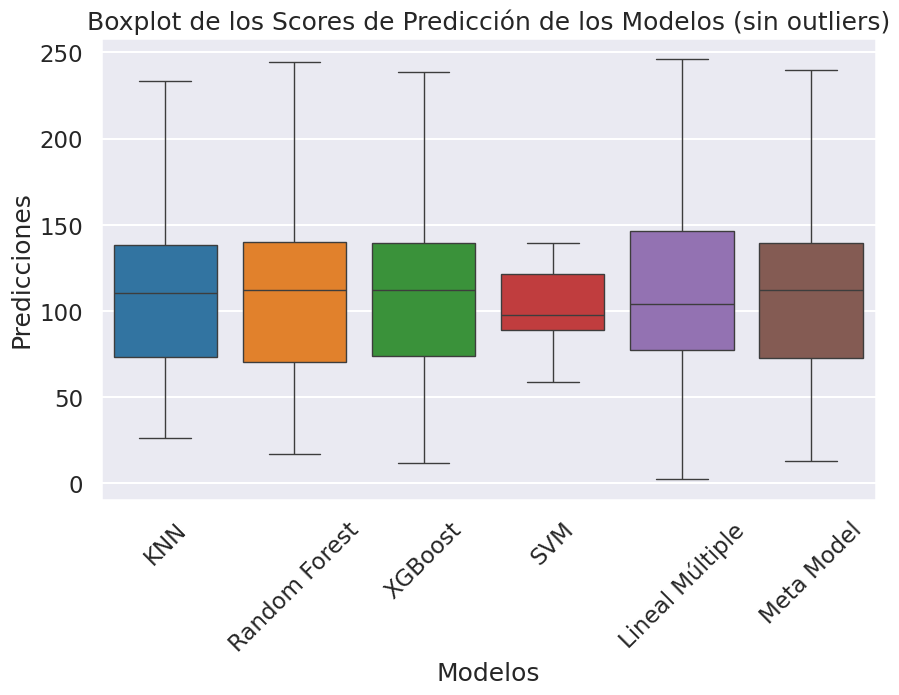

In [ ]:
# Crear un DataFrame con los scores (predicciones) para cada modelo
scores_df = pd.DataFrame({
    'KNN': knn_test_preds,
    'Random Forest': rf_test_preds,
    'XGBoost': xgb_test_preds,
    'SVM': svm_test_preds,
    'Lineal Múltiple': linear_test_preds,
    'Meta Model': y_pred_meta
})

# Crear los boxplots sin outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=scores_df, showfliers=False)  # showfliers=False oculta los outliers
plt.title('Boxplot de los Scores de Predicción de los Modelos (sin outliers)')
plt.ylabel('Predicciones')
plt.xlabel('Modelos')
plt.xticks(rotation=45)
plt.show()


En tests  
mejora 0.013 en r2  
mejora 0.01 en rmse

####Conclusión
Sí sirve más usar disintos modelos y de sus resultados crear un nuevo. Este modelo predice mejor que cada uno por si solo.  
  
  Haber hecho las configuraciones específicas de lo aprendido en cada modelo individualmente no mejoró significativamente la predicción del modelo de ensambles. Se podría haber hecho solamente este modelo y se hubiera obtenido el mejor resultado.  
    
    Conclusión muy relevante: Lo más importante para predecir bien más allá del modelo que se use, está en la limpieza de los datos y en buscar la mejor correlación entre las variables con la variable target.

##c) Cuadro de resultados

###Modelos hechos

Requeridos:  
1. Modelo Lineal Múltiple  
2. XGBoost  
3. Modelo con Cross Validation: Random Forest  

Adicionales:  
4. Modelo Lineal Simple
5. KNN Nearest neighbors algorithm  
6. Ensambles Voting  
7. Ensambles Stacking


###Metricas de los mejores modelos

####Modelo lineal Simple:

* Entrenamiento:
    - MSE: 3092.29  
    - RMSE: 55.61  
    - R2: 0.40  
* Test:  
    - MSE: 3327.01  
    - RMSE: 57.68
    - R2: 0.38

####Modelo Lineal Multiple:

* Entrenamiento:
    - MSE: 2727.01    
    - RMSE: 52.22
    - R2: 0.46
* Test:  
    - MSE: 3008.63   
    - RMSE: 54.85
    - R2: 0.44

####K Nearest Neighbours Algorithm

Usando 8 variables con mejor correlacion:
* Entrenamiento:
    - MSE: 1640
    - RMSE: 40.51
    - R2: 0.67
* Test:  
    - MSE: 2571.14    
    - RMSE: 50.71
    - R2: 0.51

Usando k=19:
* Entrenamiento:  
    - MSE: 2014.833  
    - RMSE: 44.887,
    - R2: 0.603
* Test:
    - MSE: 2365.010
    - RMSE: 48.631
    - R2: 0.553

####XGBoost

* Entrenamiento:
    - MSE: 1894.76
    - RMSE: 43.53
    - R2: 0.63
* Test:  
    - MSE: 2126.83
    - RMSE: 46.12
    - R2: 0.60

####Random Forest

* Entrenamiento:
  - MSE: 1891.72
  - RMSE: 43.49
  - R2: 0.63

* Test:
  - MSE: 2116.52
  - RMSE: 46.01
  - R2: 0.60

####Ensamblaje Voting

* Entrenamiento:
    - MSE: 1933.51
    - RMSE: 43.97
    - R2: 0.62
* Test:
    - MSE: 2379.68
    - RMSE: 48.78
    - R2: 0.55

####Ensamblaje Stacking

* Entrenamiento:
  - MSE: 2001.15
  - RMSE: 44.73
  - R2: 0.61
* Test:
  - MSE: 2074.41
  - RMSE: 45.55
  - R2: 0.61

###Conclusiones finales

Luego de un exhaustivo estudio de diferentes modelos, se llegaron a las siguientes conclusiones.

Las metricas que se tuvieron en cuenta son MSE, RMSE y R2.

* Modelo Lineal Simple:
 Para ser el mas simple de todos y basarse en una sola variable para predecir el precio lo hace bastante bien con un 0.38 de r2 en tests.
* Modelo Lineal Múltiple:  
Se probó con 5 modelos distintos variando las variables a utilizar para predicción. Las mejore predictoras son las que tienen buena correlación con la variable target pero que no estén tan correlacionadas entre ellas.  
* KNN:  
A diferencia de Modelo lineal simple, en KNN no importa si las variables están también muy correlacionadas entre ellas. Entre más variables se utilicen en KNN mejor es la predicción. Y se encontró una buena mejora encontrando el K que mejor predice.
* XGBoost:  
Se encontraron dos modelos que tienen las mejores métricas, el Modelo XGB 1 y el Modelo XGB 5. Éste último lo desestimamos ya que sus métricas para el set de entrenamiento variaban mucho con respecto a las metricas para el set de testeo(no generaliza bien), algo que en el modelo 1, si bien varian, no lo hacen con tanta diferencia. Por ello, tenemos como primera opción al Modelo XGB 1.
* Random Forest  
Obtuvimos que el Modelo RF 1 es el mejor métricas obtuvo con respecto a los otros modelos de Random Forest estudiados.
*Ensambles:  
Para el modelo de Voting, se obtuvieron métricas bajas en relación a los demás modelos estudiados hasta ahora. Para el modelo Stacking y con las configuraciones aprendidas en los modelos estudiados se obtuvieron las mejores métricas, con un R2 = 0.6074.

En conclusión, de todos los modelos que podemos utilizar para predecir el valor de la variable Price, **los mejores son el Modelo XGB 1, el Modelo RF 1 y el Modelo de Ensambles Stacking**, siendo este último el mejor de los tres ya que utiliza los mejores modelos encontrados como modelos base.
